In [1]:
import csv, re, random
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn import metrics

In [2]:
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', None)  # or 199

# Read CSVs --> df_2010to2020

In [3]:
# df_au = pd.read_csv('AU_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading au")
# df_bd = pd.read_csv('BD_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading bd")
# df_ca = pd.read_csv('CA_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading ca")
# df_gb = pd.read_csv('GB_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading gb")
# df_gh = pd.read_csv('GH_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading gh")
# df_hk = pd.read_csv('HK_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading hk")
# df_ie = pd.read_csv('IE_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading ie")
# df_in = pd.read_csv('IN_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading in")
# df_jm = pd.read_csv('JM_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading jm")
# df_ke = pd.read_csv('KE_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading ke")
# df_lk = pd.read_csv('LK_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading lk")
# df_my = pd.read_csv('MY_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading my")
# df_ng = pd.read_csv('NG_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading ng")
# df_nz = pd.read_csv('NZ_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading nz")
# df_ph = pd.read_csv('PH_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading ph")
# # df_pk = pd.read_csv('PK_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# # print("finished reading pk")
# df_sg = pd.read_csv('SG_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading sg")
# df_tz = pd.read_csv('TZ_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading tz")
# df_us = pd.read_csv('US_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# print("finished reading us")
# # df_za = pd.read_csv('ZA_domestic_Ngram_stopword_lematize.csv', usecols=['article_text_Ngram_stopword_lemmatize'])
# # print("finished reading za")

In [4]:
# df_au

In [5]:
# # concate to make all countries show in one big table
# # missing pk & za

# df_2010to2020 = pd.concat([df_au,df_bd,df_ca,df_gb,df_gh,df_hk,df_ie,df_in,df_jm,df_ke,df_lk,df_my,df_ng,df_nz,df_ph,df_sg,df_tz,df_us], axis=1)
# df_2010to2020.columns = ['txtfiles_au','txtfiles_bd','txtfiles_ca','txtfiles_gb','txtfiles_gh','txtfiles_hk',
#                          'txtfiles_ie','txtfiles_in','txtfiles_jm','txtfiles_ke','txtfiles_lk','txtfiles_my',
#                          'txtfiles_ng','txtfiles_nz','txtfiles_ph','txtfiles_sg','txtfiles_tz','txtfiles_us']

In [6]:
# df_2010to2020

# Function: Get Top 300 Words for Each Country

In [7]:
# input: country_serie (for example: df_2010to2020.txtfiles_au.dropna()).
# if not dropna(), error
# output: a list that consists of the most frequent 300 pairs (key: word + value: occurance times) for 2010to2020

def most300(country_serie):

    # create a dictionary. If key doesn't exist, set its value to be 0, otherwise its value + 1
    counts = {}
    for article in country_serie:
        words = article.lower().split()
        for word in words:
            counts[word] = counts.get(word, 0) + 1

    # pop all pairs in which keys are not words
    # keys_to_remove = [',' , '?' , '.' , ';' , '!', ':', '-', '--', '(', ')']
    # reference website https://www.ranks.nl/stopwords
    keys_to_remove = ['\'s','n\'t','\'re','\'ve','\'\'','\'m','\'ll','\'d','**33','/p','1','2','3','4','5','6','7','10','12','15','19',
                      '20','30','one','six','a','able','across','act','all','almost','along','already','also','among','and',
                      'another','around','as','ask','at','away','back','become','but','by','ca','cause','co','could','come',
                      'd','do','due','e','end','enough','even','ever','every','f','ff','first','five','for','found','four',
                      'g','get','give','go','he','home','however','i','if','in','instead','it','keep','know','last','least',
                      'less','let','like','likely','line','look','make','many','may','me','mean','might','mr','mr.','much','must',
                      'n','name','need','next','no','now','old','on','others','our','p','part','past','per','put','r',
                      'really','recent','s','second','say','see','seem','she','show','since','so','someone','still','sure',
                      't','take','that','the','there','they','third','though','told','try','two','u','us','yet','you','tell','this',
                      'three','to','want','way','we','what','when','whether','while','with','within','without','would']
    for key in keys_to_remove:
        counts.pop(key, None)

    # use tuple to exchange key and value
    lst = list()
    for key, val in counts.items():
        newtup = (val, key)
        lst.append(newtup)

    # sort by value in pair and get the most 300
    # sortedLst contains tuples (val, key)
    sortedLst = sorted(lst, reverse=True)[:300]
    
    # exchange key and value back
    resLst = list()
    for val, key in sortedLst:
        newtup = (key, val)
        resLst.append(newtup)
    return resLst

In [8]:
# # calculate the most frequent 300 words for each country 2010to2020
# # missing pk & za

# count_au_2010to2020 = most300(df_2010to2020.txtfiles_au.dropna())
# print('finished counting au')
# count_bd_2010to2020 = most300(df_2010to2020.txtfiles_bd.dropna())
# print('finished counting bd')
# count_ca_2010to2020 = most300(df_2010to2020.txtfiles_ca.dropna())
# print('finished counting ca')
# count_gb_2010to2020 = most300(df_2010to2020.txtfiles_gb.dropna())
# print('finished counting gb')
# count_gh_2010to2020 = most300(df_2010to2020.txtfiles_gh.dropna())
# print('finished counting gh')
# count_hk_2010to2020 = most300(df_2010to2020.txtfiles_hk.dropna())
# print('finished counting hk')
# count_ie_2010to2020 = most300(df_2010to2020.txtfiles_ie.dropna())
# print('finished counting ie')
# count_in_2010to2020 = most300(df_2010to2020.txtfiles_in.dropna())
# print('finished counting in')
# count_jm_2010to2020 = most300(df_2010to2020.txtfiles_jm.dropna())
# print('finished counting jm')
# count_ke_2010to2020 = most300(df_2010to2020.txtfiles_ke.dropna())
# print('finished counting ke')
# count_lk_2010to2020 = most300(df_2010to2020.txtfiles_lk.dropna())
# print('finished counting lk')
# count_my_2010to2020 = most300(df_2010to2020.txtfiles_my.dropna())
# print('finished counting my')
# count_ng_2010to2020 = most300(df_2010to2020.txtfiles_ng.dropna())
# print('finished counting ng')
# count_nz_2010to2020 = most300(df_2010to2020.txtfiles_nz.dropna())
# print('finished counting nz')
# count_ph_2010to2020 = most300(df_2010to2020.txtfiles_ph.dropna())
# print('finished counting ph')
# # count_pk_2010to2020 = most300(df_2010to2020.txtfiles_pk.dropna())
# # print('finished counting pk')
# count_sg_2010to2020 = most300(df_2010to2020.txtfiles_sg.dropna())
# print('finished counting sg')
# count_tz_2010to2020 = most300(df_2010to2020.txtfiles_tz.dropna())
# print('finished counting tz')
# count_us_2010to2020 = most300(df_2010to2020.txtfiles_us.dropna())
# print('finished counting us')
# # count_za_2010to2020 = most300(df_2010to2020.txtfiles_za.dropna())
# # print('finished counting za')

In [9]:
df_counts_au = pd.read_pickle('counts_au_final.pkl')
counts_au = dict(zip(df_counts_au[0], df_counts_au[1]))

In [10]:
df_counts_bd = pd.read_pickle('counts_bd_final.pkl')
counts_bd = dict(zip(df_counts_bd[0], df_counts_bd[1]))

In [11]:
df_counts_ca = pd.read_pickle('counts_ca_final.pkl')
counts_ca = dict(zip(df_counts_ca[0], df_counts_ca[1]))

In [12]:
df_counts_gb = pd.read_pickle('counts_gb_final.pkl')
counts_gb = dict(zip(df_counts_gb[0], df_counts_gb[1]))

In [13]:
df_counts_gh = pd.read_pickle('counts_gh_final.pkl')
counts_gh = dict(zip(df_counts_gh[0], df_counts_gh[1]))

In [14]:
df_counts_hk = pd.read_pickle('counts_hk_final.pkl')
counts_hk = dict(zip(df_counts_hk[0], df_counts_hk[1]))

In [15]:
df_counts_ie = pd.read_pickle('counts_ie_final.pkl')
counts_ie = dict(zip(df_counts_ie[0], df_counts_ie[1]))

In [16]:
df_counts_in = pd.read_pickle('counts_in_final.pkl')
counts_in = dict(zip(df_counts_in[0], df_counts_in[1]))

In [17]:
df_counts_jm = pd.read_pickle('counts_jm_final.pkl')
counts_jm = dict(zip(df_counts_jm[0], df_counts_jm[1]))

In [18]:
df_counts_ke = pd.read_pickle('counts_ke_final.pkl')
counts_ke = dict(zip(df_counts_ke[0], df_counts_ke[1]))

In [19]:
df_counts_lk = pd.read_pickle('counts_lk_final.pkl')
counts_lk = dict(zip(df_counts_lk[0], df_counts_lk[1]))

In [20]:
df_counts_my = pd.read_pickle('counts_my_final.pkl')
counts_my = dict(zip(df_counts_my[0], df_counts_my[1]))

In [21]:
df_counts_ng = pd.read_pickle('counts_ng_final.pkl')
counts_ng = dict(zip(df_counts_ng[0], df_counts_ng[1]))

In [22]:
df_counts_nz = pd.read_pickle('counts_nz_final.pkl')
counts_nz = dict(zip(df_counts_nz[0], df_counts_nz[1]))

In [23]:
df_counts_ph = pd.read_pickle('counts_ph_final.pkl')
counts_ph = dict(zip(df_counts_ph[0], df_counts_ph[1]))

In [24]:
df_counts_sg = pd.read_pickle('counts_sg_final.pkl')
counts_sg = dict(zip(df_counts_sg[0], df_counts_sg[1]))

In [25]:
df_counts_tz = pd.read_pickle('counts_tz_final.pkl')
counts_tz = dict(zip(df_counts_tz[0], df_counts_tz[1]))

In [26]:
df_counts_us = pd.read_pickle('counts_us_final.pkl')
counts_us = dict(zip(df_counts_us[0], df_counts_us[1]))

In [27]:
df_counts_us

,0,1
0,people,92775
1,time,91124
2,like,90828
3,new,74341
4,use,70516
5,work,67046
6,come,59949
7,know,58216
8,way,51141
9,want,47687


In [28]:
print('-------------------------------------------------------')
print('au')
for key, val in counts_au.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('bd')
for key, val in counts_bd.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('ca')
for key, val in counts_ca.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('gb')
for key, val in counts_gb.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('gh')
for key, val in counts_gh.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('hk')
for key, val in counts_hk.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('ie')
for key, val in counts_ie.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('in')
for key, val in counts_in.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('jm')
for key, val in counts_jm.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('ke')
for key, val in counts_ke.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('lk')
for key, val in counts_lk.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('my')
for key, val in counts_my.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('ng')
for key, val in counts_ng.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('nz')
for key, val in counts_nz.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('ph')
for key, val in counts_ph.items():
    print(key, val)
    
# print('-------------------------------------------------------')
# print('pk')
# for key, val in count_pk_2010to2020:
#     print(key, val)
    
print('-------------------------------------------------------')  
print('sg')
for key, val in counts_sg.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('tz')
for key, val in counts_tz.items():
    print(key, val)
    
print('-------------------------------------------------------')
print('us')
for key, val in counts_us.items():
    print(key, val)
    
# print('-------------------------------------------------------')
# print('za')
# for key, val in count_za_2010to2020:
#     print(key, val)

-------------------------------------------------------
au
time 99918
people 83357
like 73990
new 69815
work 65096
use 63113
come 57492
need 51243
government 51129
look 49322
think 47609
know 46152
way 45194
include 45178
game 43195
good 41740
want 41397
high 39172
market 38863
world 38654
company 36958
change 36302
thing 34861
big 34666
right 34097
business 33743
report 32855
team 32075
start 31979
day 31683
home 31660
information 31310
great 30983
play 30863
state 30849
life 30432
provide 29711
service 29554
point 28701
car 28522
long 28221
best 27873
country 27651
help 27638
year 27623
end 26499
place 25950
run 25677
family 25601
support 25273
public 24968
lot 24948
number 24731
lead 24718
player 24558
price 24464
woman 24353
issue 24159
share 24125
community 23635
try 23485
child 23364
set 23218
group 23206
told 22611
local 22196
cost 22151
industry 22082
site 21816
system 21351
win 21263
base 21223
health 20934
case 20720
medium 20647
increase 20455
term 20366
find 20038
found 199

idea 7017
hit 7009
project 7009
video 6957
role 6950
sell 6902
campaign 6900
organisation 6896
late 6891
race 6885
bit 6870
clear 6845
let 6817
online 6789
staff 6765
history 6752
hope 6694
die 6691
care 6599
human 6582
building 6562
visit 6551
office 6550
industry 6477
control 6476
cut 6471
charge 6429
rule 6400
sign 6385
date 6383
kill 6374
water 6329
moment 6328
vote 6284
practice 6282
product 6280
security 6249
design 6247
general 6241
official 6201
rise 6201
process 6189
feature 6180
later 6175
art 6142
person 6132
email 6088
raise 6079
stand 6074
remain 6061
food 6055
getty 6046
officer 6043
current 6035
stage 6009
body 6007
test 5980
require 5955
bank 5953
value 5940
position 5931
despite 5928
bring 5925
grow 5922
age 5883
hold 5878
launch 5866
involve 5865
join 5856
challenge 5834
past 5833
complaint 5829
investment 5788
word 5778
space 5772
reason 5762
style 5703
possible 5695
sure 5693
fight 5693
likely 5691
black 5685
room 5679
student 5664
chief 5658
council 5655
carry 5629

growth 17339
demand 17302
president 17109
expect 17095
sector 17074
great 16987
rate 16932
launch 16902
player 16746
different 16645
term 16535
system 16523
try 16494
cricket 16439
low 16330
release 16242
registration 16126
centre 16048
face 15954
interest 15951
game 15897
match 15643
cost 15582
comment 15556
product 15438
international 15360
found 15352
offer 15340
story 15304
road 15261
global 15223
medium 15034
account 14964
proceed 14925
create 14905
hand 14749
officer 14749
money 14734
book 14671
open 14657
policy 14581
law 14568
write 14553
thing 14541
land 14527
department 14459
lot 14455
role 14401
technology 14400
form 14394
force 14232
fund 14102
view 14086
house 14031
tax 13995
person 13985
social 13845
continue 13823
health 13750
held 13715
win 13697
body 13655
source 13641
election 13553
turn 13500
prime 13497
political 13491
decision 13485
result 13402
attack 13388
fact 13343
talk 13149
process 13071
investment 12931
problem 12915
security 12914
visit 12889
question 12837

new 24631
time 24115
use 23905
minister 21194
state 20642
company 18220
high 18003
work 17900
like 17897
come 17464
need 17413
comment 17125
right 15180
public 15155
group 15099
report 15070
include 14931
market 14687
price 14334
want 13752
issue 13670
business 12774
know 12671
property 12398
car 12275
service 12097
good 12088
look 12003
project 11847
case 11804
police 11792
party 11683
day 11675
world 11622
development 11254
add 11137
share 11105
help 10952
increase 10840
local 10755
national 10268
way 10151
court 10081
support 10057
expect 9975
post 9938
home 9858
sarawak 9856
low 9826
told 9763
school 9748
prime 9700
cost 9688
member 9490
general 9310
provide 9294
base 9223
ask 9079
place 9067
start 9064
year 9047
industry 8994
point 8943
system 8801
child 8750
set 8709
family 8657
statement 8646
law 8645
international 8628
area 8529
think 8493
act 8484
end 8380
lead 8362
problem 8350
change 8340
number 8328
life 8243
power 8217
land 8180
bank 8109
long 8054
oil 8005
student 7876
po

car 8360
working 8344
rate 8311
award 8297
bill 8269
feature 8244
delete 8240
flowing 8169
know 8144
private 8131
feel 8116
create 8102
friend 8092
queen 8084
had 8081
death 8072
large 8039
remain 8036
investment 7994
love 7989
special 7984
final 7958
despite 7950
companies 7947
together 7841
monday 7835
happen 7832
there 7813
two 7806
become 7804
products 7804
process 7796
curse 7792
provide 7741
men 7738
challenge 7729
address 7720
test 7679
live 7677
study 7654
administration 7646
around 7611
facility 7609
operations 7594
pay 7570
such 7529
design 7514
far 7460
miss 7457
let 7457
plant 7412
arrest 7401
reflect 7385
something 7375
begin 7352
meeting 7349
budget 7328
air 7301
fact 7288
island 7276
vehicle 7242
performance 7238
training 7233
class 7213
coming 7191
known 7138
ensure 7106
real 7066
available 7037
agreement 7017
various 7008
ban 7008
fire 7008
early 7001
raise 6969
launch 6949
groups 6926
young 6907
brand 6891
presidential 6886
energy 6853
travel 6848
--------------------

# Write All Words to A CSV file

In [29]:
# put all notpeaceful words into notpeace dictionary (key: word; val: count)
# put all peaceful words into peace dictionary (key: word; val: count)
# if key is the same, val = sum(val)
    
notpeace_wrd_dict = {}
peace_wrd_dict = {}
    
for key, val in counts_bd.items():
    notpeace_wrd_dict[key] = notpeace_wrd_dict.get(key, 0) + val
    
for key, val in counts_ke.items():
    notpeace_wrd_dict[key] = notpeace_wrd_dict.get(key, 0) + val
    
for key, val in counts_ng.items():
    notpeace_wrd_dict[key] = notpeace_wrd_dict.get(key, 0) + val   
    
for key, val in counts_tz.items():
    notpeace_wrd_dict[key] = notpeace_wrd_dict.get(key, 0) + val

for key, val in counts_au.items():
    peace_wrd_dict[key] = peace_wrd_dict.get(key, 0) + val
    
for key, val in counts_ca.items():
    peace_wrd_dict[key] = peace_wrd_dict.get(key, 0) + val
    
for key, val in counts_gb.items():
    peace_wrd_dict[key] = peace_wrd_dict.get(key, 0) + val
    
for key, val in counts_ie.items():
    peace_wrd_dict[key] = peace_wrd_dict.get(key, 0) + val
    
for key, val in counts_nz.items():
    peace_wrd_dict[key] = peace_wrd_dict.get(key, 0) + val
    
for key, val in counts_sg.items():
    peace_wrd_dict[key] = peace_wrd_dict.get(key, 0) + val

In [30]:
# use tuple to sort the dictionary by value and put tuple back to the list

# use tuple to exchange key and value
notpeace_wrd_lst = list()
peace_wrd_lst = list()

for key, val in notpeace_wrd_dict.items():
    newtup = (val, key)
    notpeace_wrd_lst.append(newtup)
    
for key, val in peace_wrd_dict.items():
    newtup = (val, key)
    peace_wrd_lst.append(newtup)
    
# sort by value in pair
# sortedLst contains tuples (val, key)
notpeace_wrd_lst = sorted(notpeace_wrd_lst, reverse=True)
peace_wrd_lst = sorted(peace_wrd_lst, reverse=True)

# exchange key and value back
notpeace_wrd_sortedLst = list()
peace_wrd_sortedLst = list()

for val, key in notpeace_wrd_lst:
    newtup = (key, val)
    notpeace_wrd_sortedLst.append(newtup)
    
for val, key in peace_wrd_lst:
    newtup = (key, val)
    peace_wrd_sortedLst.append(newtup)

# here are all notpeaceful words from all notpeaceful countries
for key, val in notpeace_wrd_sortedLst:
    print(key, val)

state 187579
government 161409
people 136572
country 135245
president 93318
time 91229
come 81038
work 69295
new 68473
use 67592
national 67278
need 64120
like 62792
know 60263
police 55960
service 53651
include 53475
high 53240
party 53131
governor 53129
public 53073
issue 52302
company 51865
world 51427
member 51363
election 50152
development 50112
report 49649
court 49580
want 48893
business 48562
bank 47414
way 47390
good 47312
area 47024
life 46323
school 45858
case 44521
political 43829
lead 43669
general 43478
market 42802
project 42661
minister 42630
add 42127
law 42023
right 41630
woman 41609
child 40984
leader 40820
power 40662
security 40461
group 40296
support 40064
federal 39649
day 39404
start 39216
local 39173
place 38614
sector 37762
money 37005
provide 36984
help 35744
nation 35425
office 35133
chief 34821
ensure 34802
international 34246
number 34062
road 33979
act 33484
told 33308
set 33165
health 33150
community 33097
thing 32966
order 32666
increase 31742
home 3169

In [31]:
# concatenate notpeace words dataframe and peace words dataframe to get all words dataframe

df_notpeace_wrd_sortedLst = pd.DataFrame(notpeace_wrd_sortedLst)
df_peace_wrd_sortedLst = pd.DataFrame(peace_wrd_sortedLst)
df_all_wrd_update = pd.concat([df_notpeace_wrd_sortedLst,df_peace_wrd_sortedLst], axis=1)
df_all_wrd_update.columns = ['Notpeace','0 Count','Peace','1 Count']

In [32]:
df_notpeace_wrd_sortedLst.columns = ['Word','Count']
df_peace_wrd_sortedLst.columns = ['Word','Count']

In [33]:
df_all_wrd_update

,Notpeace,0 Count,Peace,1 Count
0,state,187579.0,time,409580
1,government,161409.0,people,378012
2,people,136572.0,new,313290
3,country,135245.0,work,309182
4,president,93318.0,use,304381
5,time,91229.0,like,291324
6,come,81038.0,come,267715
7,work,69295.0,need,209246
8,new,68473.0,look,203832
9,use,67592.0,include,201315


In [34]:
df_all_wrd_update
df_all_wrd_update.to_csv('p_n_notp_words.csv', index=False) 

# Function: Union Words

In [35]:
df_2010to2020_words = pd.DataFrame()

In [36]:
# missing pk & za

countries = ['Australia AU', 'Bangladesh BD', 'Canada CA', 'United Kingdom GB', 'Ghana GH', 'Hong Kong HK', 'Ireland IE', 'India IN', 'Jamaica JM', 'Kenya KE', 'Sri Lanka LK', 'Malaysia MY', 'Nigeria NG', 'New Zealand NZ', 'Philippines PH', 'Singapore SG', 'Tanzania TZ', 'United States US']

In [37]:
df_2010to2020_words.insert(loc=0, column='Countries', value=countries)

In [38]:
df_2010to2020_words

,Countries
0,Australia AU
1,Bangladesh BD
2,Canada CA
3,United Kingdom GB
4,Ghana GH
5,Hong Kong HK
6,Ireland IE
7,India IN
8,Jamaica JM
9,Kenya KE


In [39]:
# union 300 words from each country, so the new dataframe consist of all occurant word
# it should have 300 (if each country has identicle 300 words) - 5400 words (if each country has distinct 300 words)
# for example function union_words (df1, count_au_2010to2020) union words in list count_au_2010to2020 with dataframe 1
# and then expands the columns.
# output: new dateframe

def union_words(df, new_lst):
    key_lst = []
    for key, val in new_lst:
        key_lst.append(key)
    df = df.reindex(df.columns.union(key_lst, sort=False), axis=1, fill_value=0)
    return df

# df_2010to2020_words = union_words(df_2010to2020_words, count_au_2010to2020)

In [40]:
# already union the first 300 words from list count_au_2010to2020, so we have 301 columns now

df_2010to2020_words

,Countries
0,Australia AU
1,Bangladesh BD
2,Canada CA
3,United Kingdom GB
4,Ghana GH
5,Hong Kong HK
6,Ireland IE
7,India IN
8,Jamaica JM
9,Kenya KE


In [41]:
# union rest countries

df_2010to2020_words = union_words(df_2010to2020_words, counts_bd.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_ca.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_gb.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_gh.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_hk.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_ie.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_in.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_jm.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_ke.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_lk.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_my.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_ng.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_nz.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_ph.items())
# df_2010to2020_words = union_words(df_2010to2020_words, count_pk_2010to2020)
df_2010to2020_words = union_words(df_2010to2020_words, counts_sg.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_tz.items())
df_2010to2020_words = union_words(df_2010to2020_words, counts_us.items())
# df_2010to2020_words = union_words(df_2010to2020_words, count_za_2010to2020)

In [42]:
# already union all words from all countries
# now we have 1047 distinct words, so it shows 1048 columns

df_2010to2020_words

,Countries,country,government,people,minister,time,work,police,come,high,use,new,include,case,add,area,world,need,bank,official,report,day,like,student,party,state,law,project,member,development,told,international,leader,issue,national,number,city,general,power,woman,local,start,court,prime,market,child,life,company,sector,right,service,water,good,place,political,increase,election,president,land,director,know,home,public,different,group,set,help,lead,family,road,provide,secretary,change,team,health,demand,way,business,foreign,want,school,district,meeting,authority,long,photo,war,order,run,follow,worker,programme,price,support,share,chief,kill,found,system,level,play,visit,university,ask,face,ministry,capital,try,office,base,year,education,force,present,act,economic,end,plan,death,medium,held,form,human,policy,building,industry,ensure,hand,nation,large,officer,point,test,attack,committee,body,social,cost,think,money,hospital,charge,export,according,river,total,accord,create,look,food,security,growth,problem,rate,situation,match,low,begin,house,global,arrest,receive,private,great,product,term,remain,organisation,big,centre,information,source,action,department,station,cause,return,press,commission,trade,fire,study,community,process,role,reach,open,decision,star,pay,activity,interest,rise,file,left,continue,later,investment,result,film,major,chairman,free,lose,job,gas,college,question,stop,post,carry,young,important,society,rule,plant,talk,step,future,army,write,release,far,find,head,production,incident,statement,best,involve,import,unit,technology,event,factory,bring,fund,book,special,able,person,men,division,matter,economy,hold,cricket,justice,allow,bus,agency,village,opportunity,teacher,supply,border,poor,regard,condition,produce,consider,father,senior,launch,league,sell,line,traffic,movement,non,expect,crisis,stand,turn,population,research,crime,central,region,believe,lack,initiative,control,award,coronavirus,tax,financial,raise,management,quality,effort,conduct,thing,recently,join,grow,conference,medical,address,field,complete,game,comment,lot,program,story,player,forward,win,account,news,experience,man,goal,little,feel,deal,note,vancouver,site,care,offer,content,view,street,small,love,close,mean,season,amp,risk,learn,away,personal,read,live,record,happen,board,old,federal,province,kind,hit,friend,agree,ottawa,article,sign,real,fact,email,hard,staff,bad,car,score,tell,drive,sale,hope,history,coach,focus,organization,park,understand,oil,period,click,kid,past,online,thought,value,require,customer,guy,let,hockey,sure,available,announce,postmedia,property,store,room,watch,idea,final,space,appear,series,serve,shot,reason,related,course,strong,data,energy,access,list,encourage,contact,image,website,club,music,picture,response,leave,independent,fan,claim,video,campaign,late,race,bit,clear,die,cut,date,moment,vote,practice,design,feature,art,getty,current,stage,position,despite,age,challenge,complaint,word,style,possible,fight,likely,black,council,performance,light,parliament,god,institution,executive,regional,express,youth,legal,church,improve,responsibility,resource,training,especially,explain,currently,facility,corruption,football,deputy,limited,contract,urge,revenue,finance,reduce,operation,benefit,administration,payment,leadership,paid,fail,indicate,seek,association,individual,peace,vice,establish,candidate,farmer,firm,investor,mainland,protest,pro,asset,stock,bond,democracy,professional,publish,concern,key,recent,protester,exchange,transaction,offering,lawyer,cover,internet,partner,lawmaker,trading,corporate,journal,equity,measure,mobile,size,example,air,banking,commercial,figure,brand,profit,language,domestic,range,type,county,cookie,target,cork,sport,yea,night,ad,opt,judge,page,outside,identify,cookies,newspaper,town,played,enjoy,advertising,patient,user,travel,chance,manager,parent,ball,championship,collect,device,mother,week,walk,miss,option,finish,remember,saw,times,web,registration,proceed,actor,decide,till,stay,class,mov

In [43]:
df_2010to2020_words = df_2010to2020_words.set_index('Countries')

In [44]:
df_2010to2020_words = df_2010to2020_words.sort_index(axis=1)

In [45]:
df_2010to2020_words

,able,access,accord,according,account,accuse,achieve,act,action,activity,actor,actually,ad,add,address,administration,advertising,again,age,agency,agree,agreement,agriculture,aim,air,allow,along,among,amp,announce,another,app,appeal,appear,appoint,area,army,around,arrest,art,article,ask,assembly,asset,association,attack,authority,available,award,away,bad,ball,ban,bank,banking,base,bay,become,before,begin,believe,benefit,best,big,bill,billion,bit,black,block,board,body,bond,book,border,both,brand,bring,budget,building,bus,business,but,buy,cabinet,campaign,candidate,capacity,capital,car,card,care,carry,case,cause,cent,center,central,centre,chairman,challenge,championship,chance,change,character,charge,chief,child,church,citizen,city,civil,claim,class,clear,click,close,club,coach,collect,college,come,coming,comment,comments,commercial,commission,commissioner,committee,community,companies,company,compare,competition,complaint,complete,concern,condition,conduct,conference,consider,constitution,construction,consumer,contact,content,continue,contract,control,cookie,cookies,cork,coronavirus,corporate,corruption,cost,could,council,countries,country,county,course,court,cover,covid,create,cricket,crime,crisis,culture,current,currently,curse,customer,cut,data,date,day,deal,death,decide,decision,delete,demand,democracy,department,deputy,design,despite,develop,development,device,die,different,digital,direct,director,district,division,domestic,down,drive,drug,dunedin,earlier,early,economic,economy,education,effect,effort,election,email,employee,enable,encourage,end,energy,enjoy,ensure,environment,equity,ers,especially,establish,event,example,exchange,executive,expect,experience,explain,export,express,face,facility,fact,factory,fail,family,fan,far,farm,farmer,father,feature,federal,feel,field,fight,figure,file,film,final,finance,financial,find,finish,fire,firm,flowing,focus,follow,food,football,force,foreign,form,former,forward,found,free,friend,from,fund,fur,future,game,gas,general,getty,girl,gleaner,global,go,goal,god,going,good,govern,government,governor,great,group,groups,grow,growth,guardian,guy,had,hand,happen,hard,head,health,held,help,high,history,hit,hockey,hold,home,hope,hospital,hotel,house,housing,however,human,idea,identify,image,immediately,impact,implement,implementation,import,important,improve,incident,include,income,increase,independent,indiana,indicate,individual,industry,inform,information,infrastructure,initiative,instead,institution,interest,international,internet,investigation,investment,investor,involve,island,issue,it,job,join,journal,jubilee,judge,justice,key,kid,kill,kind,know,known,labour,lack,land,language,large,late,later,launch,law,lawmaker,lawyer,lead,leader,leadership,league,learn,leave,left,legal,let,level,life,light,like,likely,limited,line,list,little,live,living,loan,local,long,look,lose,lot,love,low,main,mainland,major,man,manage,management,manager,market,marketing,match,matter,may,mean,measure,medical,medium,meet,meeting,member,men,met,military,million,minister,ministry,miss,mobile,model,moment,monday,money,months,mother,movement,movie,music,must,nation,national,natural,nature,near,need,network,new,news,newspaper,night,non,north,note,number,offer,offering,office,officer,official,officials,oil,old,online,only,open,operation,operations,opinion,opportunity,opposition,opt,option,order,organisation,organization,ottawa,outside,owner,page,paid,parent,parish,park,parliament,partner,party,past,patient,pay,payment,peace,pen,people,performance,period,person,personal,phone,photo,picture,place,plan,plant,platform,play,played,player,point,police,policy,political,politician,poor,population,port,position,possible,post,posted,postmedia,power,practice,present,president,presidential,press,price,prime,prince,private,pro,problem,proceed,process,produce,product,production,products,prof,professional,profit,program,programme,project,projects,property,protest,protester,provide,province,public,publish,quality,queen,question,race,

In [46]:
df_2010to2020_words.shape

(18, 767)

# Function: Fill in Word Frenquency --> df_2010to2020_words

In [43]:
# function fills in the word frenquency to the dataframe. 
# For example, "you" appears 25318 times in count_au_2010to2020, then fill in 25318.

def fill_in(df, new_lst, row):
    for key, val in new_lst:
        if key in df.iloc[row]:
            df[key].iloc[row] = val

In [44]:
# use function to fill in all 937 words
# missing pk & za

fill_in(df_2010to2020_words, counts_au.items(), 0)
fill_in(df_2010to2020_words, counts_bd.items(), 1)
fill_in(df_2010to2020_words, counts_ca.items(), 2)
fill_in(df_2010to2020_words, counts_gb.items(), 3)
fill_in(df_2010to2020_words, counts_gh.items(), 4)
fill_in(df_2010to2020_words, counts_hk.items(), 5)
fill_in(df_2010to2020_words, counts_ie.items(), 6)
fill_in(df_2010to2020_words, counts_in.items(), 7)
fill_in(df_2010to2020_words, counts_jm.items(), 8)
fill_in(df_2010to2020_words, counts_ke.items(), 9)
fill_in(df_2010to2020_words, counts_lk.items(), 10)
fill_in(df_2010to2020_words, counts_my.items(), 11)
fill_in(df_2010to2020_words, counts_ng.items(), 12)
fill_in(df_2010to2020_words, counts_nz.items(), 13)
fill_in(df_2010to2020_words, counts_ph.items(), 14)
# fill_in(df_2010to2020_words, count_pk_2010to2020, 15)
fill_in(df_2010to2020_words, counts_sg.items(), 15)
fill_in(df_2010to2020_words, counts_tz.items(), 16)
fill_in(df_2010to2020_words, counts_us.items(), 17)
# fill_in(df_2010to2020_words, count_za_2010to2020, 19)

In [45]:
df_2010to2020_words

,able,access,accord,according,account,accuse,achieve,act,action,activity,actor,actually,ad,add,address,administration,advertising,again,age,agency,agree,agreement,agriculture,aim,air,allow,along,among,amp,announce,another,app,appeal,appear,appoint,area,army,around,arrest,art,article,ask,assembly,asset,association,attack,authority,available,award,away,bad,ball,ban,bank,banking,base,bay,become,before,begin,believe,benefit,best,big,bill,billion,bit,black,block,board,body,bond,book,border,both,brand,bring,budget,building,bus,business,but,buy,cabinet,campaign,candidate,capacity,capital,car,card,care,carry,case,cause,cent,center,central,centre,chairman,challenge,championship,chance,change,character,charge,chief,child,church,citizen,city,civil,claim,class,clear,click,close,club,coach,collect,college,come,coming,comment,comments,commercial,commission,commissioner,committee,community,companies,company,compare,competition,complaint,complete,concern,condition,conduct,conference,consider,constitution,construction,consumer,contact,content,continue,contract,control,cookie,cookies,cork,coronavirus,corporate,corruption,cost,could,council,countries,country,county,course,court,cover,covid,create,cricket,crime,crisis,culture,current,currently,curse,customer,cut,data,date,day,deal,death,decide,decision,delete,demand,democracy,department,deputy,design,despite,develop,development,device,die,different,digital,direct,director,district,division,domestic,down,drive,drug,dunedin,earlier,early,economic,economy,education,effect,effort,election,email,employee,enable,encourage,end,energy,enjoy,ensure,environment,equity,ers,especially,establish,event,example,exchange,executive,expect,experience,explain,export,express,face,facility,fact,factory,fail,family,fan,far,farm,farmer,father,feature,federal,feel,field,fight,figure,file,film,final,finance,financial,find,finish,fire,firm,flowing,focus,follow,food,football,force,foreign,form,former,forward,found,free,friend,from,fund,fur,future,game,gas,general,getty,girl,gleaner,global,go,goal,god,going,good,govern,government,governor,great,group,groups,grow,growth,guardian,guy,had,hand,happen,hard,head,health,held,help,high,history,hit,hockey,hold,home,hope,hospital,hotel,house,housing,however,human,idea,identify,image,immediately,impact,implement,implementation,import,important,improve,incident,include,income,increase,independent,indiana,indicate,individual,industry,inform,information,infrastructure,initiative,instead,institution,interest,international,internet,investigation,investment,investor,involve,island,issue,it,job,join,journal,jubilee,judge,justice,key,kid,kill,kind,know,known,labour,lack,land,language,large,late,later,launch,law,lawmaker,lawyer,lead,leader,leadership,league,learn,leave,left,legal,let,level,life,light,like,likely,limited,line,list,little,live,living,loan,local,long,look,lose,lot,love,low,main,mainland,major,man,manage,management,manager,market,marketing,match,matter,may,mean,measure,medical,medium,meet,meeting,member,men,met,military,million,minister,ministry,miss,mobile,model,moment,monday,money,months,mother,movement,movie,music,must,nation,national,natural,nature,near,need,network,new,news,newspaper,night,non,north,note,number,offer,offering,office,officer,official,officials,oil,old,online,only,open,operation,operations,opinion,opportunity,opposition,opt,option,order,organisation,organization,ottawa,outside,owner,page,paid,parent,parish,park,parliament,partner,party,past,patient,pay,payment,peace,pen,people,performance,period,person,personal,phone,photo,picture,place,plan,plant,platform,play,played,player,point,police,policy,political,politician,poor,population,port,position,possible,post,posted,postmedia,power,practice,present,president,presidential,press,price,prime,prince,private,pro,problem,proceed,process,produce,product,production,products,prof,professional,profit,program,programme,project,projects,property,protest,protester,provide,province,public,publish,quality,queen,question,race,

# Convert to Percentage --> df_2010to2020_words_percent

In [46]:
df_2010to2020_words['Sum'] = df_2010to2020_words.sum(axis=1)

In [47]:
df_2010to2020_words

,able,access,accord,according,account,accuse,achieve,act,action,activity,actor,actually,ad,add,address,administration,advertising,again,age,agency,agree,agreement,agriculture,aim,air,allow,along,among,amp,announce,another,app,appeal,appear,appoint,area,army,around,arrest,art,article,ask,assembly,asset,association,attack,authority,available,award,away,bad,ball,ban,bank,banking,base,bay,become,before,begin,believe,benefit,best,big,bill,billion,bit,black,block,board,body,bond,book,border,both,brand,bring,budget,building,bus,business,but,buy,cabinet,campaign,candidate,capacity,capital,car,card,care,carry,case,cause,cent,center,central,centre,chairman,challenge,championship,chance,change,character,charge,chief,child,church,citizen,city,civil,claim,class,clear,click,close,club,coach,collect,college,come,coming,comment,comments,commercial,commission,commissioner,committee,community,companies,company,compare,competition,complaint,complete,concern,condition,conduct,conference,consider,constitution,construction,consumer,contact,content,continue,contract,control,cookie,cookies,cork,coronavirus,corporate,corruption,cost,could,council,countries,country,county,course,court,cover,covid,create,cricket,crime,crisis,culture,current,currently,curse,customer,cut,data,date,day,deal,death,decide,decision,delete,demand,democracy,department,deputy,design,despite,develop,development,device,die,different,digital,direct,director,district,division,domestic,down,drive,drug,dunedin,earlier,early,economic,economy,education,effect,effort,election,email,employee,enable,encourage,end,energy,enjoy,ensure,environment,equity,ers,especially,establish,event,example,exchange,executive,expect,experience,explain,export,express,face,facility,fact,factory,fail,family,fan,far,farm,farmer,father,feature,federal,feel,field,fight,figure,file,film,final,finance,financial,find,finish,fire,firm,flowing,focus,follow,food,football,force,foreign,form,former,forward,found,free,friend,from,fund,fur,future,game,gas,general,getty,girl,gleaner,global,go,goal,god,going,good,govern,government,governor,great,group,groups,grow,growth,guardian,guy,had,hand,happen,hard,head,health,held,help,high,history,hit,hockey,hold,home,hope,hospital,hotel,house,housing,however,human,idea,identify,image,immediately,impact,implement,implementation,import,important,improve,incident,include,income,increase,independent,indiana,indicate,individual,industry,inform,information,infrastructure,initiative,instead,institution,interest,international,internet,investigation,investment,investor,involve,island,issue,it,job,join,journal,jubilee,judge,justice,key,kid,kill,kind,know,known,labour,lack,land,language,large,late,later,launch,law,lawmaker,lawyer,lead,leader,leadership,league,learn,leave,left,legal,let,level,life,light,like,likely,limited,line,list,little,live,living,loan,local,long,look,lose,lot,love,low,main,mainland,major,man,manage,management,manager,market,marketing,match,matter,may,mean,measure,medical,medium,meet,meeting,member,men,met,military,million,minister,ministry,miss,mobile,model,moment,monday,money,months,mother,movement,movie,music,must,nation,national,natural,nature,near,need,network,new,news,newspaper,night,non,north,note,number,offer,offering,office,officer,official,officials,oil,old,online,only,open,operation,operations,opinion,opportunity,opposition,opt,option,order,organisation,organization,ottawa,outside,owner,page,paid,parent,parish,park,parliament,partner,party,past,patient,pay,payment,peace,pen,people,performance,period,person,personal,phone,photo,picture,place,plan,plant,platform,play,played,player,point,police,policy,political,politician,poor,population,port,position,possible,post,posted,postmedia,power,practice,present,president,presidential,press,price,prime,prince,private,pro,problem,proceed,process,produce,product,production,products,prof,professional,profit,program,programme,project,projects,property,protest,protester,provide,province,public,publish,quality,queen,question,race,

In [48]:
df_2010to2020_words_percent = df_2010to2020_words.loc[:].div(df_2010to2020_words["Sum"], axis=0)

In [49]:
df_2010to2020_words_percent

,able,access,accord,according,account,accuse,achieve,act,action,activity,actor,actually,ad,add,address,administration,advertising,again,age,agency,agree,agreement,agriculture,aim,air,allow,along,among,amp,announce,another,app,appeal,appear,appoint,area,army,around,arrest,art,article,ask,assembly,asset,association,attack,authority,available,award,away,bad,ball,ban,bank,banking,base,bay,become,before,begin,believe,benefit,best,big,bill,billion,bit,black,block,board,body,bond,book,border,both,brand,bring,budget,building,bus,business,but,buy,cabinet,campaign,candidate,capacity,capital,car,card,care,carry,case,cause,cent,center,central,centre,chairman,challenge,championship,chance,change,character,charge,chief,child,church,citizen,city,civil,claim,class,clear,click,close,club,coach,collect,college,come,coming,comment,comments,commercial,commission,commissioner,committee,community,companies,company,compare,competition,complaint,complete,concern,condition,conduct,conference,consider,constitution,construction,consumer,contact,content,continue,contract,control,cookie,cookies,cork,coronavirus,corporate,corruption,cost,could,council,countries,country,county,course,court,cover,covid,create,cricket,crime,crisis,culture,current,currently,curse,customer,cut,data,date,day,deal,death,decide,decision,delete,demand,democracy,department,deputy,design,despite,develop,development,device,die,different,digital,direct,director,district,division,domestic,down,drive,drug,dunedin,earlier,early,economic,economy,education,effect,effort,election,email,employee,enable,encourage,end,energy,enjoy,ensure,environment,equity,ers,especially,establish,event,example,exchange,executive,expect,experience,explain,export,express,face,facility,fact,factory,fail,family,fan,far,farm,farmer,father,feature,federal,feel,field,fight,figure,file,film,final,finance,financial,find,finish,fire,firm,flowing,focus,follow,food,football,force,foreign,form,former,forward,found,free,friend,from,fund,fur,future,game,gas,general,getty,girl,gleaner,global,go,goal,god,going,good,govern,government,governor,great,group,groups,grow,growth,guardian,guy,had,hand,happen,hard,head,health,held,help,high,history,hit,hockey,hold,home,hope,hospital,hotel,house,housing,however,human,idea,identify,image,immediately,impact,implement,implementation,import,important,improve,incident,include,income,increase,independent,indiana,indicate,individual,industry,inform,information,infrastructure,initiative,instead,institution,interest,international,internet,investigation,investment,investor,involve,island,issue,it,job,join,journal,jubilee,judge,justice,key,kid,kill,kind,know,known,labour,lack,land,language,large,late,later,launch,law,lawmaker,lawyer,lead,leader,leadership,league,learn,leave,left,legal,let,level,life,light,like,likely,limited,line,list,little,live,living,loan,local,long,look,lose,lot,love,low,main,mainland,major,man,manage,management,manager,market,marketing,match,matter,may,mean,measure,medical,medium,meet,meeting,member,men,met,military,million,minister,ministry,miss,mobile,model,moment,monday,money,months,mother,movement,movie,music,must,nation,national,natural,nature,near,need,network,new,news,newspaper,night,non,north,note,number,offer,offering,office,officer,official,officials,oil,old,online,only,open,operation,operations,opinion,opportunity,opposition,opt,option,order,organisation,organization,ottawa,outside,owner,page,paid,parent,parish,park,parliament,partner,party,past,patient,pay,payment,peace,pen,people,performance,period,person,personal,phone,photo,picture,place,plan,plant,platform,play,played,player,point,police,policy,political,politician,poor,population,port,position,possible,post,posted,postmedia,power,practice,present,president,presidential,press,price,prime,prince,private,pro,problem,proceed,process,produce,product,production,products,prof,professional,profit,program,programme,project,projects,property,protest,protester,provide,province,public,publish,quality,queen,question,race,

# Add Peace as A Feature --> df_2010to2020_peace

In [50]:
df_2010to2020_peace = df_2010to2020_words_percent

In [51]:
# insert a new column "Group" (0, 1, 2)
# 0: false --> not peaceful
# 1: true --> peaceful
# 2: neutral
# missing pk & za

df_2010to2020_peace['Group'] = [1, 0, 1, 1, 2, 2, 1, 2, 2, 0, 2, 2, 0, 1, 2, 1, 0, 2]

def numbers_to_strings(argument):
    switcher = {
        0: "Not Peaceful",
        1: "Peaceful",
        2: "Neutral",
    }
    
    return switcher.get(argument, "None")

In [52]:
# insert a new column "Group Name" (Peaceful, Not Peaceful, Neutral)

group_name = []
for i in df_2010to2020_peace['Group']:
    group_name.append(numbers_to_strings(i))
    
df_2010to2020_peace['Group Name'] = group_name

In [53]:
df_2010to2020_peace

,able,access,accord,according,account,accuse,achieve,act,action,activity,actor,actually,ad,add,address,administration,advertising,again,age,agency,agree,agreement,agriculture,aim,air,allow,along,among,amp,announce,another,app,appeal,appear,appoint,area,army,around,arrest,art,article,ask,assembly,asset,association,attack,authority,available,award,away,bad,ball,ban,bank,banking,base,bay,become,before,begin,believe,benefit,best,big,bill,billion,bit,black,block,board,body,bond,book,border,both,brand,bring,budget,building,bus,business,but,buy,cabinet,campaign,candidate,capacity,capital,car,card,care,carry,case,cause,cent,center,central,centre,chairman,challenge,championship,chance,change,character,charge,chief,child,church,citizen,city,civil,claim,class,clear,click,close,club,coach,collect,college,come,coming,comment,comments,commercial,commission,commissioner,committee,community,companies,company,compare,competition,complaint,complete,concern,condition,conduct,conference,consider,constitution,construction,consumer,contact,content,continue,contract,control,cookie,cookies,cork,coronavirus,corporate,corruption,cost,could,council,countries,country,county,course,court,cover,covid,create,cricket,crime,crisis,culture,current,currently,curse,customer,cut,data,date,day,deal,death,decide,decision,delete,demand,democracy,department,deputy,design,despite,develop,development,device,die,different,digital,direct,director,district,division,domestic,down,drive,drug,dunedin,earlier,early,economic,economy,education,effect,effort,election,email,employee,enable,encourage,end,energy,enjoy,ensure,environment,equity,ers,especially,establish,event,example,exchange,executive,expect,experience,explain,export,express,face,facility,fact,factory,fail,family,fan,far,farm,farmer,father,feature,federal,feel,field,fight,figure,file,film,final,finance,financial,find,finish,fire,firm,flowing,focus,follow,food,football,force,foreign,form,former,forward,found,free,friend,from,fund,fur,future,game,gas,general,getty,girl,gleaner,global,go,goal,god,going,good,govern,government,governor,great,group,groups,grow,growth,guardian,guy,had,hand,happen,hard,head,health,held,help,high,history,hit,hockey,hold,home,hope,hospital,hotel,house,housing,however,human,idea,identify,image,immediately,impact,implement,implementation,import,important,improve,incident,include,income,increase,independent,indiana,indicate,individual,industry,inform,information,infrastructure,initiative,instead,institution,interest,international,internet,investigation,investment,investor,involve,island,issue,it,job,join,journal,jubilee,judge,justice,key,kid,kill,kind,know,known,labour,lack,land,language,large,late,later,launch,law,lawmaker,lawyer,lead,leader,leadership,league,learn,leave,left,legal,let,level,life,light,like,likely,limited,line,list,little,live,living,loan,local,long,look,lose,lot,love,low,main,mainland,major,man,manage,management,manager,market,marketing,match,matter,may,mean,measure,medical,medium,meet,meeting,member,men,met,military,million,minister,ministry,miss,mobile,model,moment,monday,money,months,mother,movement,movie,music,must,nation,national,natural,nature,near,need,network,new,news,newspaper,night,non,north,note,number,offer,offering,office,officer,official,officials,oil,old,online,only,open,operation,operations,opinion,opportunity,opposition,opt,option,order,organisation,organization,ottawa,outside,owner,page,paid,parent,parish,park,parliament,partner,party,past,patient,pay,payment,peace,pen,people,performance,period,person,personal,phone,photo,picture,place,plan,plant,platform,play,played,player,point,police,policy,political,politician,poor,population,port,position,possible,post,posted,postmedia,power,practice,present,president,presidential,press,price,prime,prince,private,pro,problem,proceed,process,produce,product,production,products,prof,professional,profit,program,programme,project,projects,property,protest,protester,provide,province,public,publish,quality,queen,question,race,

# Make A Few Functions

In [54]:
# Function: print a dataframe to display actual results and predicted results
def print_df_actu_pred(y_test, y_pred, df_actu_pred_index):
    df_actu_pred = pd.DataFrame({
        'Actual': y_test,
        'Predicted': y_pred
    })
    df_actu_pred.index = df_actu_pred_index
    print(df_actu_pred)
    print()

# Function: print simple confusion matrix
def print_simple_confusion_matrx(y_test, y_pred):
    # simple confusion matrix
    # print(confusion_matrix(y_test, y_pred))
    matrix=pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'], dropna=False)
    print(matrix)
    
# Function: print pretty confusion matrx
def print_pretty_confusion_matrx(y_test, y_pred, class_names):
    # class_name = name  of classes
    cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
    fig, ax = plt.subplots()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names)
    plt.yticks(tick_marks, class_names)
    
    # create heatmap
    sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
    ax.xaxis.set_label_position("top")
    # plt.tight_layout()  #why this? just cuts off labels!
    # plt.title('Confusion matrix', y=1.1)
    plt.title('Confusion matrix')
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    plt.show(block=False)
    
# Function: print current prediction report
def print_curr_pred_report(y_test, y_pred):
    print("Report:\n", classification_report(y_test, y_pred))
    
# Function: print accuracy report 
def print_accuracy_report(arr):
    print('\nAccuracy Array:', arr)
    print('Accuracy Mean:', np.mean(arr))
    print('Accuracy Population SD:', np.std(arr))
    print('Accuracy Sample SD:', np.std(arr, ddof=1))
    print('Accuracy SEM:', np.std(arr, ddof=1) / np.sqrt(np.size(arr)))

# Function: input a numpy data in which all test data is put in the last column,
#           output a predict array that is generated by using n-1 rows to predict 1 left
def train_n_1_pred_1(adata):
    rows,cols=adata.shape
    # print("rows:", rows) = 18
    # print("cols:", cols) = 
    predict=np.zeros((rows))
    
    #remove row i, train all else, test i
    for m in range(rows):
        # np.delete(data, index, axis) return what is left
        adatam1=np.delete(adata, m, 0)
        X_train=np.delete(adatam1, cols-1, 1)
        y_train=adatam1[:,cols-1]
        #print('\nm =',m)
        #Random Forest classifier
        #forest = RandomForestClassifier(criterion='gini',n_estimators=25,random_state=42,n_jobs=2)
        forest = RandomForestClassifier(criterion='gini',n_estimators=25,n_jobs=2)
        forest.fit(X_train, y_train)
        X_test=adata[m,0:cols-1]
        X_test=X_test.reshape(1, -1)
        predict[m]=forest.predict(X_test)
        return predict

In [57]:
X

,able,access,accord,according,account,accuse,achieve,act,action,activity,actor,actually,ad,add,address,administration,advertising,again,age,agency,agree,agreement,agriculture,aim,air,allow,along,among,amp,announce,another,app,appeal,appear,appoint,area,army,around,arrest,art,article,ask,assembly,asset,association,attack,authority,available,award,away,bad,ball,ban,bank,banking,base,bay,become,before,begin,believe,benefit,best,big,bill,billion,bit,black,block,board,body,bond,book,border,both,brand,bring,budget,building,bus,business,but,buy,cabinet,campaign,candidate,capacity,capital,car,card,care,carry,case,cause,cent,center,central,centre,chairman,challenge,championship,chance,change,character,charge,chief,child,church,citizen,city,civil,claim,class,clear,click,close,club,coach,collect,college,come,coming,comment,comments,commercial,commission,commissioner,committee,community,companies,company,compare,competition,complaint,complete,concern,condition,conduct,conference,consider,constitution,construction,consumer,contact,content,continue,contract,control,cookie,cookies,cork,coronavirus,corporate,corruption,cost,could,council,countries,country,county,course,court,cover,covid,create,cricket,crime,crisis,culture,current,currently,curse,customer,cut,data,date,day,deal,death,decide,decision,delete,demand,democracy,department,deputy,design,despite,develop,development,device,die,different,digital,direct,director,district,division,domestic,down,drive,drug,dunedin,earlier,early,economic,economy,education,effect,effort,election,email,employee,enable,encourage,end,energy,enjoy,ensure,environment,equity,ers,especially,establish,event,example,exchange,executive,expect,experience,explain,export,express,face,facility,fact,factory,fail,family,fan,far,farm,farmer,father,feature,federal,feel,field,fight,figure,file,film,final,finance,financial,find,finish,fire,firm,flowing,focus,follow,food,football,force,foreign,form,former,forward,found,free,friend,from,fund,fur,future,game,gas,general,getty,girl,gleaner,global,go,goal,god,going,good,govern,government,governor,great,group,groups,grow,growth,guardian,guy,had,hand,happen,hard,head,health,held,help,high,history,hit,hockey,hold,home,hope,hospital,hotel,house,housing,however,human,idea,identify,image,immediately,impact,implement,implementation,import,important,improve,incident,include,income,increase,independent,indiana,indicate,individual,industry,inform,information,infrastructure,initiative,instead,institution,interest,international,internet,investigation,investment,investor,involve,island,issue,it,job,join,journal,jubilee,judge,justice,key,kid,kill,kind,know,known,labour,lack,land,language,large,late,later,launch,law,lawmaker,lawyer,lead,leader,leadership,league,learn,leave,left,legal,let,level,life,light,like,likely,limited,line,list,little,live,living,loan,local,long,look,lose,lot,love,low,main,mainland,major,man,manage,management,manager,market,marketing,match,matter,may,mean,measure,medical,medium,meet,meeting,member,men,met,military,million,minister,ministry,miss,mobile,model,moment,monday,money,months,mother,movement,movie,music,must,nation,national,natural,nature,near,need,network,new,news,newspaper,night,non,north,note,number,offer,offering,office,officer,official,officials,oil,old,online,only,open,operation,operations,opinion,opportunity,opposition,opt,option,order,organisation,organization,ottawa,outside,owner,page,paid,parent,parish,park,parliament,partner,party,past,patient,pay,payment,peace,pen,people,performance,period,person,personal,phone,photo,picture,place,plan,plant,platform,play,played,player,point,police,policy,political,politician,poor,population,port,position,possible,post,posted,postmedia,power,practice,present,president,presidential,press,price,prime,prince,private,pro,problem,proceed,process,produce,product,production,products,prof,professional,profit,program,programme,project,projects,property,protest,protester,provide,province,public,publish,quality,queen,question,race,

In [58]:
y

Countries
Australia AU         1
Bangladesh BD        0
Canada CA            1
United Kingdom GB    1
Ghana GH             2
Hong Kong HK         2
Ireland IE           1
India IN             2
Jamaica JM           2
Kenya KE             0
Sri Lanka LK         2
Malaysia MY          2
Nigeria NG           0
New Zealand NZ       1
Philippines PH       2
Singapore SG         1
Tanzania TZ          0
United States US     2
Name: Group, dtype: int64

# Method 1: 80% to Train, 20% to Test

-------------------------------------------------------
Try 1 

Predicted  0  1
Actual         
1          0  1
2          2  1


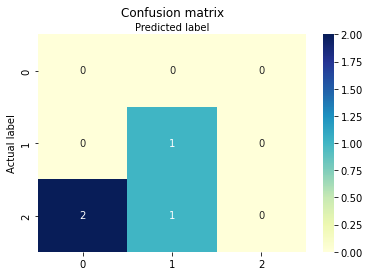

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_cla

Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.50      1.00      0.67         1
           2       0.00      0.00      0.00         3

    accuracy                           0.25         4
   macro avg       0.17      0.33      0.22         4
weighted avg       0.12      0.25      0.17         4

Accuracy: 0.25 

-------------------------------------------------------
Try 2 

Predicted  0  1  2
Actual            
1          0  2  0
2          1  0  1


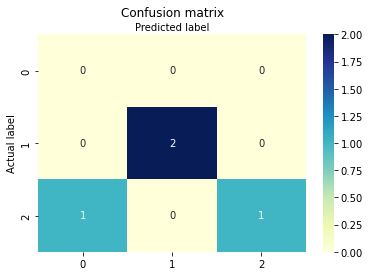

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      1.00      1.00         2
           2       1.00      0.50      0.67         2

    accuracy                           0.75         4
   macro avg       0.67      0.50      0.56         4
weighted avg       1.00      0.75      0.83         4

Accuracy: 0.75 

-------------------------------------------------------
Try 3 

Predicted  1  2
Actual         
1          2  0
2          0  2


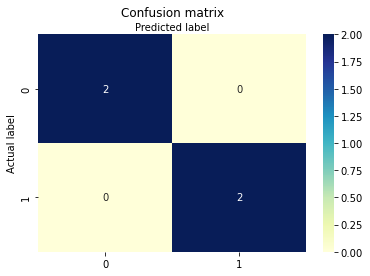

Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         2
           2       1.00      1.00      1.00         2

    accuracy                           1.00         4
   macro avg       1.00      1.00      1.00         4
weighted avg       1.00      1.00      1.00         4

Accuracy: 1.0 

-------------------------------------------------------
Try 4 

Predicted  1  2
Actual         
0          0  2
1          1  0
2          0  1


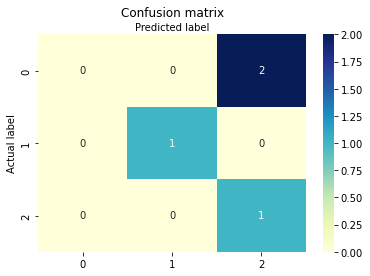

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      1.00      1.00         1
           2       0.33      1.00      0.50         1

    accuracy                           0.50         4
   macro avg       0.44      0.67      0.50         4
weighted avg       0.33      0.50      0.38         4

Accuracy: 0.5 

-------------------------------------------------------
Try 5 

Predicted  1  2
Actual         
0          0  1
1          2  0
2          0  1


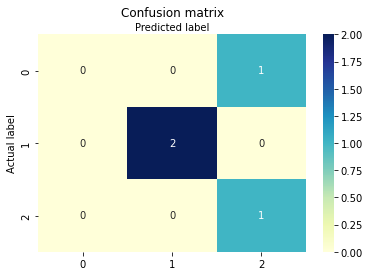

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       1.00      1.00      1.00         2
           2       0.50      1.00      0.67         1

    accuracy                           0.75         4
   macro avg       0.50      0.67      0.56         4
weighted avg       0.62      0.75      0.67         4

Accuracy: 0.75 

-------------------------------------------------------
Try 6 

Predicted  1  2
Actual         
0          0  1
1          1  0
2          0  2


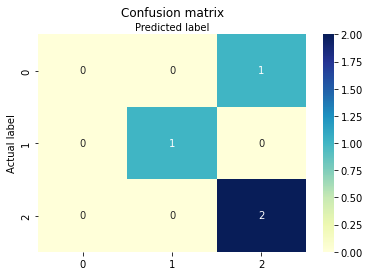

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       1.00      1.00      1.00         1
           2       0.67      1.00      0.80         2

    accuracy                           0.75         4
   macro avg       0.56      0.67      0.60         4
weighted avg       0.58      0.75      0.65         4

Accuracy: 0.75 

-------------------------------------------------------
Try 7 

Predicted  1  2
Actual         
0          0  1
1          1  1
2          0  1


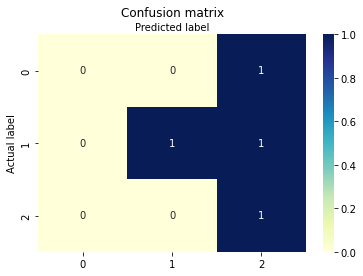

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       1.00      0.50      0.67         2
           2       0.33      1.00      0.50         1

    accuracy                           0.50         4
   macro avg       0.44      0.50      0.39         4
weighted avg       0.58      0.50      0.46         4

Accuracy: 0.5 

-------------------------------------------------------
Try 8 

Predicted  0  1  2
Actual            
1          0  1  1
2          1  0  1


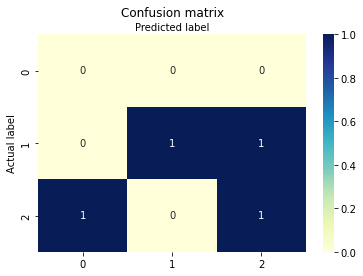

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.50      0.67         2
           2       0.50      0.50      0.50         2

    accuracy                           0.50         4
   macro avg       0.50      0.33      0.39         4
weighted avg       0.75      0.50      0.58         4

Accuracy: 0.5 

-------------------------------------------------------
Try 9 

Predicted  1  2
Actual         
0          0  2
1          1  0
2          0  1


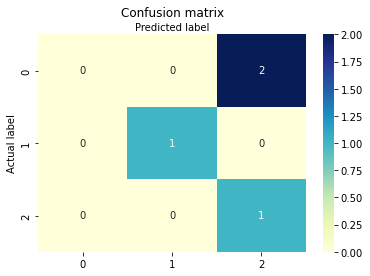

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      1.00      1.00         1
           2       0.33      1.00      0.50         1

    accuracy                           0.50         4
   macro avg       0.44      0.67      0.50         4
weighted avg       0.33      0.50      0.38         4

Accuracy: 0.5 

-------------------------------------------------------
Try 10 

Predicted  1  2
Actual         
0          0  1
1          2  0
2          0  1


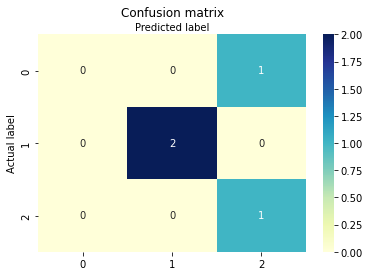

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       1.00      1.00      1.00         2
           2       0.50      1.00      0.67         1

    accuracy                           0.75         4
   macro avg       0.50      0.67      0.56         4
weighted avg       0.62      0.75      0.67         4

Accuracy: 0.75 

-------------------------------------------------------
Try 11 

Predicted  2
Actual      
0          2
2          2


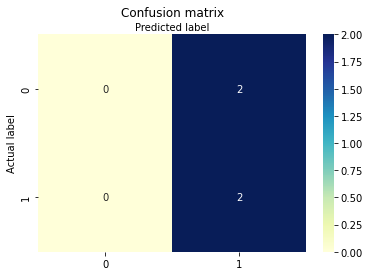

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           2       0.50      1.00      0.67         2

    accuracy                           0.50         4
   macro avg       0.25      0.50      0.33         4
weighted avg       0.25      0.50      0.33         4

Accuracy: 0.5 

-------------------------------------------------------
Try 12 

Predicted  1  2
Actual         
0          0  1
1          1  0
2          0  2


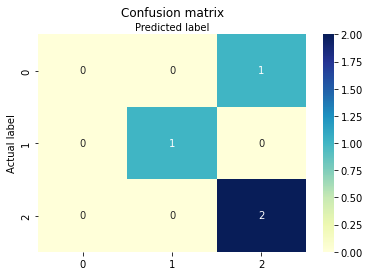

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       1.00      1.00      1.00         1
           2       0.67      1.00      0.80         2

    accuracy                           0.75         4
   macro avg       0.56      0.67      0.60         4
weighted avg       0.58      0.75      0.65         4

Accuracy: 0.75 

-------------------------------------------------------
Try 13 

Predicted  2
Actual      
0          2
1          1
2          1


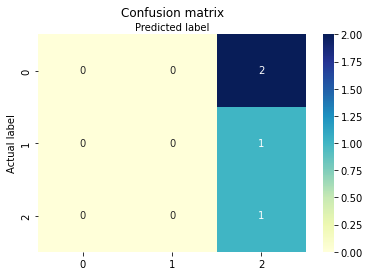

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00         1
           2       0.25      1.00      0.40         1

    accuracy                           0.25         4
   macro avg       0.08      0.33      0.13         4
weighted avg       0.06      0.25      0.10         4

Accuracy: 0.25 

-------------------------------------------------------
Try 14 

Predicted  1  2
Actual         
0          0  1
1          1  1
2          0  1


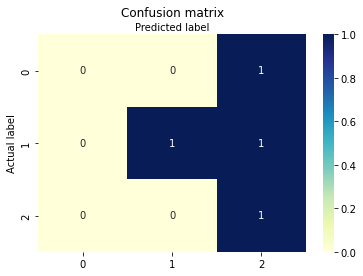

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       1.00      0.50      0.67         2
           2       0.33      1.00      0.50         1

    accuracy                           0.50         4
   macro avg       0.44      0.50      0.39         4
weighted avg       0.58      0.50      0.46         4

Accuracy: 0.5 

-------------------------------------------------------
Try 15 

Predicted  1  2
Actual         
0          0  2
1          1  0
2          0  1


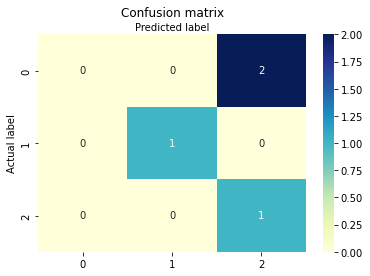

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      1.00      1.00         1
           2       0.33      1.00      0.50         1

    accuracy                           0.50         4
   macro avg       0.44      0.67      0.50         4
weighted avg       0.33      0.50      0.38         4

Accuracy: 0.5 

-------------------------------------------------------
Try 16 

Predicted  1  2
Actual         
0          0  1
1          1  0
2          1  1


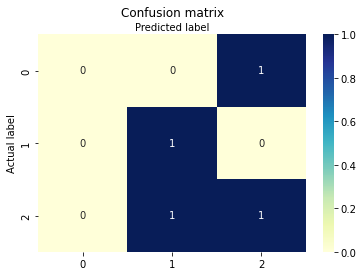

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.50      1.00      0.67         1
           2       0.50      0.50      0.50         2

    accuracy                           0.50         4
   macro avg       0.33      0.50      0.39         4
weighted avg       0.38      0.50      0.42         4

Accuracy: 0.5 

-------------------------------------------------------
Try 17 

Predicted  1
Actual      
1          3
2          1


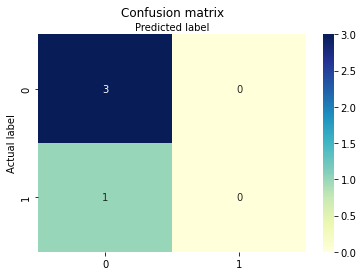

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           1       0.75      1.00      0.86         3
           2       0.00      0.00      0.00         1

    accuracy                           0.75         4
   macro avg       0.38      0.50      0.43         4
weighted avg       0.56      0.75      0.64         4

Accuracy: 0.75 

-------------------------------------------------------
Try 18 

Predicted  2
Actual      
0          2
1          1
2          1


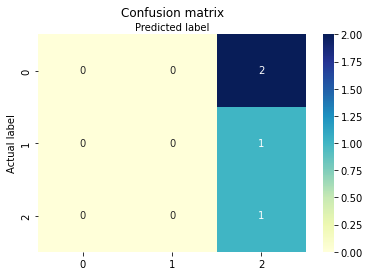

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00         1
           2       0.25      1.00      0.40         1

    accuracy                           0.25         4
   macro avg       0.08      0.33      0.13         4
weighted avg       0.06      0.25      0.10         4

Accuracy: 0.25 

-------------------------------------------------------
Try 19 

Predicted  0  1  2
Actual            
1          0  1  0
2          1  1  1


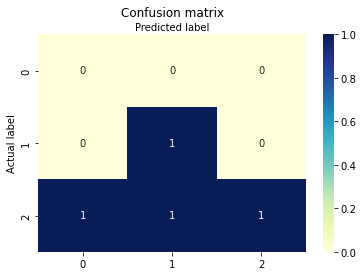

D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.50      1.00      0.67         1
           2       1.00      0.33      0.50         3

    accuracy                           0.50         4
   macro avg       0.50      0.44      0.39         4
weighted avg       0.88      0.50      0.54         4

Accuracy: 0.5 

-------------------------------------------------------
Try 20 

Predicted  1  2
Actual         
0          0  1
1          1  0
2          0  2


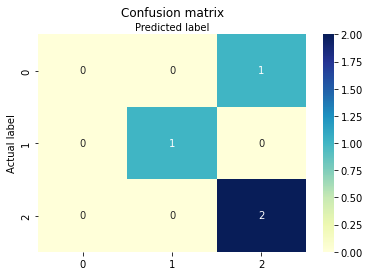

Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       1.00      1.00      1.00         1
           2       0.67      1.00      0.80         2

    accuracy                           0.75         4
   macro avg       0.56      0.67      0.60         4
weighted avg       0.58      0.75      0.65         4

Accuracy: 0.75 


Accuracy Array: [0.25 0.75 1.   0.5  0.75 0.75 0.5  0.5  0.5  0.75 0.5  0.75 0.25 0.5
 0.5  0.5  0.75 0.25 0.5  0.75]
Accuracy Mean: 0.575
Accuracy Population SD: 0.19525624189766635
Accuracy Sample SD: 0.20032867729650794
Accuracy SEM: 0.04479485402776105


D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [56]:
from sklearn.model_selection import train_test_split

X = df_2010to2020_peace.drop(['Sum', 'Group', 'Group Name'], axis=1)
y = df_2010to2020_peace['Group']

# set loop times !!!!!!
loop = 20
accuracy_arr = np.zeros(loop)

for x in range(loop):
    
    print('-------------------------------------------------------')
    print('Try', x+1, '\n')
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

    forest = RandomForestClassifier(criterion='gini', n_estimators=100, random_state=42, n_jobs=2)
    forest.fit(X_train,y_train)

    # compute predictions
    y_pred=forest.predict(X_test)
    
    print_simple_confusion_matrx(y_test, y_pred)
    print_pretty_confusion_matrx(y_test, y_pred, [0,1,2])
    print_curr_pred_report(y_test, y_pred)
    
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy, '\n')
    
    # fill accuracy data in an array
    accuracy_arr[x] = accuracy
    
print_accuracy_report(accuracy_arr)

# Method 2: Use 19 to Predict 1

-------------------------------------------------------
Try 1 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    5    1
2.0          2    1    5


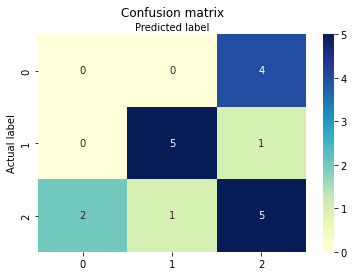

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.83      0.83      0.83         6
         2.0       0.50      0.62      0.56         8

    accuracy                           0.56        18
   macro avg       0.44      0.49      0.46        18
weighted avg       0.50      0.56      0.52        18

Accuracy: 0.5555555555555556 

-------------------------------------------------------
Try 2 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    5    1
2.0          1    2    5


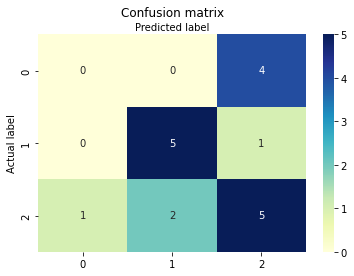

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.71      0.83      0.77         6
         2.0       0.50      0.62      0.56         8

    accuracy                           0.56        18
   macro avg       0.40      0.49      0.44        18
weighted avg       0.46      0.56      0.50        18

Accuracy: 0.5555555555555556 

-------------------------------------------------------
Try 3 

Predicted  0.0  1.0  2.0
Actual                  
0.0          1    0    3
1.0          0    5    1
2.0          3    3    2


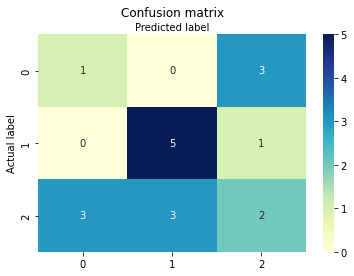

Report:
               precision    recall  f1-score   support

         0.0       0.25      0.25      0.25         4
         1.0       0.62      0.83      0.71         6
         2.0       0.33      0.25      0.29         8

    accuracy                           0.44        18
   macro avg       0.40      0.44      0.42        18
weighted avg       0.41      0.44      0.42        18

Accuracy: 0.4444444444444444 

-------------------------------------------------------
Try 4 

Predicted  0.0  1.0  2.0
Actual                  
0.0          1    0    3
1.0          0    5    1
2.0          2    2    4


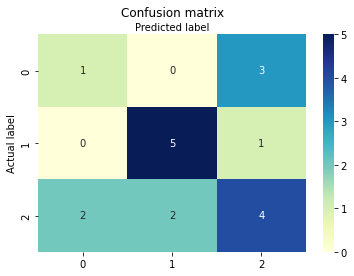

Report:
               precision    recall  f1-score   support

         0.0       0.33      0.25      0.29         4
         1.0       0.71      0.83      0.77         6
         2.0       0.50      0.50      0.50         8

    accuracy                           0.56        18
   macro avg       0.52      0.53      0.52        18
weighted avg       0.53      0.56      0.54        18

Accuracy: 0.5555555555555556 

-------------------------------------------------------
Try 5 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    3    3
2.0          1    1    6


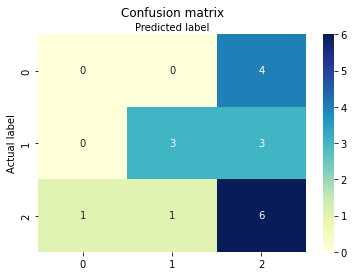

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.75      0.50      0.60         6
         2.0       0.46      0.75      0.57         8

    accuracy                           0.50        18
   macro avg       0.40      0.42      0.39        18
weighted avg       0.46      0.50      0.45        18

Accuracy: 0.5 

-------------------------------------------------------
Try 6 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    5    1
2.0          1    1    6


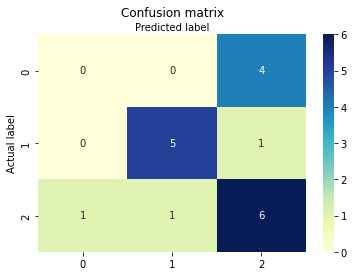

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.83      0.83      0.83         6
         2.0       0.55      0.75      0.63         8

    accuracy                           0.61        18
   macro avg       0.46      0.53      0.49        18
weighted avg       0.52      0.61      0.56        18

Accuracy: 0.6111111111111112 

-------------------------------------------------------
Try 7 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    2    4
2.0          2    2    4


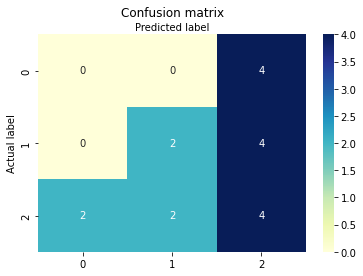

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.50      0.33      0.40         6
         2.0       0.33      0.50      0.40         8

    accuracy                           0.33        18
   macro avg       0.28      0.28      0.27        18
weighted avg       0.31      0.33      0.31        18

Accuracy: 0.3333333333333333 

-------------------------------------------------------
Try 8 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    4    2
2.0          2    2    4


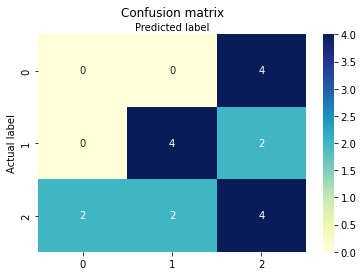

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.67      0.67      0.67         6
         2.0       0.40      0.50      0.44         8

    accuracy                           0.44        18
   macro avg       0.36      0.39      0.37        18
weighted avg       0.40      0.44      0.42        18

Accuracy: 0.4444444444444444 

-------------------------------------------------------
Try 9 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    4    2
2.0          2    1    5


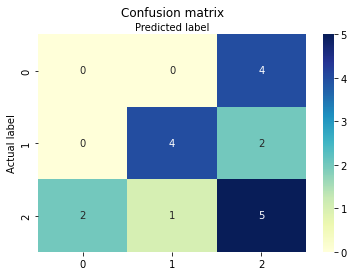

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.80      0.67      0.73         6
         2.0       0.45      0.62      0.53         8

    accuracy                           0.50        18
   macro avg       0.42      0.43      0.42        18
weighted avg       0.47      0.50      0.48        18

Accuracy: 0.5 

-------------------------------------------------------
Try 10 

Predicted  0.0  1.0  2.0
Actual                  
0.0          1    0    3
1.0          0    4    2
2.0          1    2    5


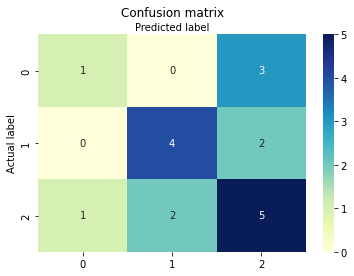

Report:
               precision    recall  f1-score   support

         0.0       0.50      0.25      0.33         4
         1.0       0.67      0.67      0.67         6
         2.0       0.50      0.62      0.56         8

    accuracy                           0.56        18
   macro avg       0.56      0.51      0.52        18
weighted avg       0.56      0.56      0.54        18

Accuracy: 0.5555555555555556 

-------------------------------------------------------
Try 11 

Predicted  1.0  2.0
Actual             
0.0          0    4
1.0          5    1
2.0          2    6


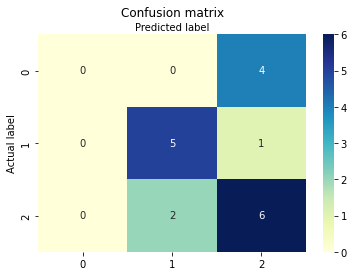

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.71      0.83      0.77         6
         2.0       0.55      0.75      0.63         8

    accuracy                           0.61        18
   macro avg       0.42      0.53      0.47        18
weighted avg       0.48      0.61      0.54        18

Accuracy: 0.6111111111111112 

-------------------------------------------------------
Try 12 



D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    5    1
2.0          1    1    6


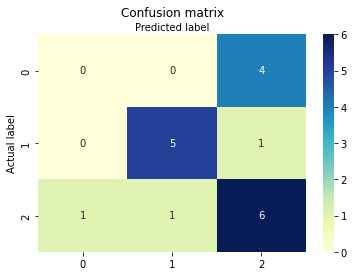

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.83      0.83      0.83         6
         2.0       0.55      0.75      0.63         8

    accuracy                           0.61        18
   macro avg       0.46      0.53      0.49        18
weighted avg       0.52      0.61      0.56        18

Accuracy: 0.6111111111111112 

-------------------------------------------------------
Try 13 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    5    1
2.0          3    2    3


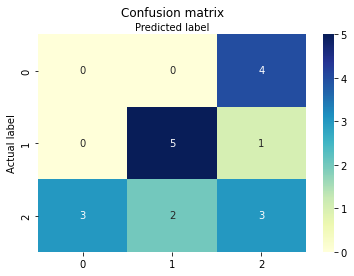

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.71      0.83      0.77         6
         2.0       0.38      0.38      0.38         8

    accuracy                           0.44        18
   macro avg       0.36      0.40      0.38        18
weighted avg       0.40      0.44      0.42        18

Accuracy: 0.4444444444444444 

-------------------------------------------------------
Try 14 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    4    2
2.0          3    1    4


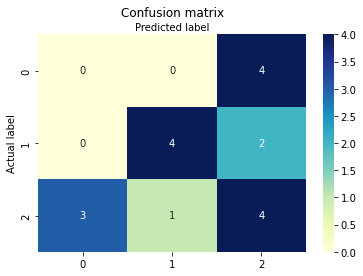

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.80      0.67      0.73         6
         2.0       0.40      0.50      0.44         8

    accuracy                           0.44        18
   macro avg       0.40      0.39      0.39        18
weighted avg       0.44      0.44      0.44        18

Accuracy: 0.4444444444444444 

-------------------------------------------------------
Try 15 

Predicted  0.0  1.0  2.0
Actual                  
0.0          1    0    3
1.0          0    4    2
2.0          1    1    6


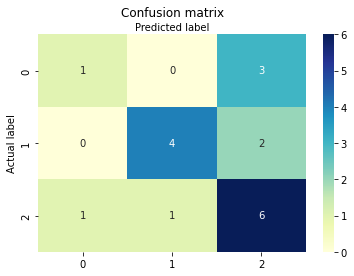

Report:
               precision    recall  f1-score   support

         0.0       0.50      0.25      0.33         4
         1.0       0.80      0.67      0.73         6
         2.0       0.55      0.75      0.63         8

    accuracy                           0.61        18
   macro avg       0.62      0.56      0.56        18
weighted avg       0.62      0.61      0.60        18

Accuracy: 0.6111111111111112 

-------------------------------------------------------
Try 16 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    5    1
2.0          1    1    6


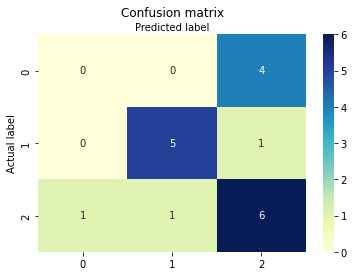

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.83      0.83      0.83         6
         2.0       0.55      0.75      0.63         8

    accuracy                           0.61        18
   macro avg       0.46      0.53      0.49        18
weighted avg       0.52      0.61      0.56        18

Accuracy: 0.6111111111111112 

-------------------------------------------------------
Try 17 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    4    2
2.0          2    2    4


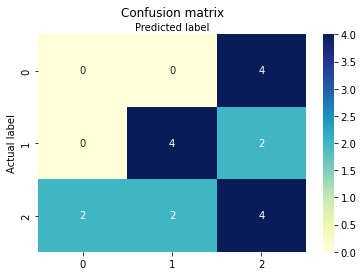

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.67      0.67      0.67         6
         2.0       0.40      0.50      0.44         8

    accuracy                           0.44        18
   macro avg       0.36      0.39      0.37        18
weighted avg       0.40      0.44      0.42        18

Accuracy: 0.4444444444444444 

-------------------------------------------------------
Try 18 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    5    1
2.0          1    2    5


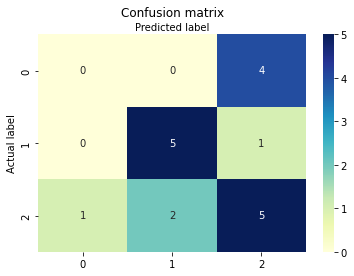

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.71      0.83      0.77         6
         2.0       0.50      0.62      0.56         8

    accuracy                           0.56        18
   macro avg       0.40      0.49      0.44        18
weighted avg       0.46      0.56      0.50        18

Accuracy: 0.5555555555555556 

-------------------------------------------------------
Try 19 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    5    1
2.0          1    3    4


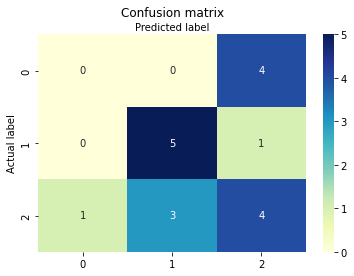

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.62      0.83      0.71         6
         2.0       0.44      0.50      0.47         8

    accuracy                           0.50        18
   macro avg       0.36      0.44      0.39        18
weighted avg       0.41      0.50      0.45        18

Accuracy: 0.5 

-------------------------------------------------------
Try 20 

Predicted  0.0  1.0  2.0
Actual                  
0.0          0    0    4
1.0          0    5    1
2.0          2    1    5


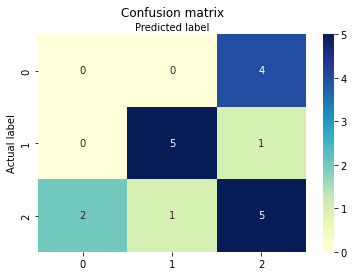

Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.83      0.83      0.83         6
         2.0       0.50      0.62      0.56         8

    accuracy                           0.56        18
   macro avg       0.44      0.49      0.46        18
weighted avg       0.50      0.56      0.52        18

Accuracy: 0.5555555555555556 


Accuracy Array: [0.55555556 0.55555556 0.44444444 0.55555556 0.5        0.61111111
 0.33333333 0.44444444 0.5        0.55555556 0.61111111 0.61111111
 0.44444444 0.44444444 0.61111111 0.61111111 0.44444444 0.55555556
 0.5        0.55555556]
Accuracy Mean: 0.5222222222222223
Accuracy Population SD: 0.07535922203472523
Accuracy Sample SD: 0.07731693043760661
Accuracy SEM: 0.017288591227011093


In [59]:
# use method pd.DataFrame(df).to_numpy() to convert dataframe to numpy array
data = df_2010to2020_peace.drop(['Sum', 'Group Name'], axis=1)
adata = pd.DataFrame(data).to_numpy()

rows,cols=adata.shape
# print("rows:", rows) = 18
# print("cols:", cols) = 938
predict=np.zeros((rows))

# set loop times !!!!!!
loop = 20
accuracy_arr = np.zeros(loop)

for x in range(loop):

    print('-------------------------------------------------------')
    print('Try', x+1, '\n')
    
    #remove row i, train all else, test i
    for m in range(rows):
        # np.delete(data, index, axis) return what is left
        adatam1=np.delete(adata, m, 0)
        X_train=np.delete(adatam1, cols-1, 1)
        y_train=adatam1[:,cols-1]
        #print('\nm =',m)
        #Random Forest classifier
        #forest = RandomForestClassifier(criterion='gini',n_estimators=25,random_state=42,n_jobs=2)
        forest = RandomForestClassifier(criterion='gini',n_estimators=25,n_jobs=2)
        forest.fit(X_train, y_train)
        X_test=adata[m,0:cols-1]
        X_test=X_test.reshape(1, -1)
        predict[m]=forest.predict(X_test)
    
    y_test=y_train=adata[:,cols-1]
    y_pred=predict
    
    # df_actu_pred_index = ['Australia AU', 'Bangladesh BD', 'Canada CA', 'United Kingdom GB', 'Ghana GH', 'Hong Kong HK', 'Ireland IE', 'India IN', 'Jamaica JM', 'Kenya KE', 'Sri Lanka LK', 'Malaysia MY', 'Nigeria NG', 'New Zealand NZ', 'Philippines PH', 'Pakistan PK', 'Singapore SG', 'Tanzania TZ', 'United States US', 'South Africa ZA'] 
    # print_df_actu_pred(y_test, y_pred, df_actu_pred_index)

    print_simple_confusion_matrx(y_test, y_pred)
    print_pretty_confusion_matrx(y_test, y_pred, [0,1,2])
    print_curr_pred_report(y_test, y_pred)
    
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy, '\n')
    
    # fill accuracy data in an array
    accuracy_arr[x] = accuracy
          
print_accuracy_report(accuracy_arr)

# Method 3: Use Random Numbers 0 1 2 to Predict

In [445]:
# from random import randrange

# # set loop times !!!!!!
# loop = 3
# accuracy_arr = np.zeros(loop)

# for x in range(loop):

#     print('-------------------------------------------------------')
#     print('Try', x+1, '\n')

#     # randrange(i) generate random numbers from 0 ~ (i-1) (inclusive)
#     for y in range(20):
#         predict[y]=randrange(3)

#     y_test=y_train=adata[:,cols-1]
#     y_pred=predict

#     print_simple_confusion_matrx(y_test, y_pred)
#     print_pretty_confusion_matrx(y_test, y_pred, [0,1,2])
#     print_curr_pred_report(y_test, y_pred)

#     accuracy = accuracy_score(y_test, y_pred)
#     print("Accuracy:", accuracy, '\n')

#     # fill accuracy data in an array
#     accuracy_arr[x] = accuracy
    
# print_accuracy_report(accuracy_arr) 

# Method 4: Use Chance 5/20 predict 0, 6/20 predict 1, 9/20 predict 2

In [446]:
# # set loop times !!!!!!
# loop = 3
# accuracy_arr = np.zeros(loop)

# for x in range(loop):

#     print('-------------------------------------------------------')
#     print('Try', x+1, '\n')

#     # randrange(i) generate random numbers from 0 ~ (i-1) (inclusive)
#     for y in range(20):
#         index=randrange(20)
#         predict[y]=y_test[index]

#     y_test=y_train=adata[:,cols-1]
#     y_pred=predict

#     print_simple_confusion_matrx(y_test, y_pred)
#     print_pretty_confusion_matrx(y_test, y_pred, [0,1,2])
#     print_curr_pred_report(y_test, y_pred)

#     accuracy = accuracy_score(y_test, y_pred)
#     print("Accuracy:", accuracy, '\n')

#     # fill accuracy data in an array
#     accuracy_arr[x] = accuracy
    
# print_accuracy_report(accuracy_arr) 

In [447]:
# Rule: 5/20 predict 0, 6/20 predict 1, 9/20 predict 2 
# Correct answer: 1 0 1 1 2 2 1 2 2 0 2 2 0 1 2 0 1 0 2 2

# Accuracy = ( p(1st number) + p(2nd number) + ... + p(20th number) ) / total times
#          = ( 6/20 + 5/20 + 6/20 + 6/20 + 9/20 + ... + 9/20 ) / 20
#          = ( 5/20 * 5 + 6/20 * 6 + 9/20 * 9 ) / 20 
#          = 0.355

# Calculate method above (think deeper)

# Accurancy = p(Actual = 0 ∧ Prediction = 0) + p(Actual = 1 ∧ Prediction = 1) + p(Actual = 2 ∧ Prediction = 2) 
#           = (5/20 * 5/20)                  + (6/20 * 6/20)                  + (9/20 * 9/20)
#           = 0.355

# If we already know that there is 5 0s, 6 1s, and 9 2s in real data, how can we make accuracy as large as possible?
# Accurancy = p(Actual = 0 ∧ Prediction = 0) + p(Actual = 1 ∧ Prediction = 1) + p(Actual = 2 ∧ Prediction = 2) 
#           = p(fixed 5/20 ∧ 0%)             + p(fixed 6/20 ∧ 0%)             + p(fixed 9/20 ∧ 100%)
#           = 0                              + 0                              + 9/20
#           = 9/20 = 0.45 > 0.355

# Ignore Neutral Countries

-------------------------------------------------------
Try 1 

               word  importance
722      university       0.080
87          capital       0.040
374             law       0.040
622        security       0.040
715             try       0.040
537         produce       0.040
429        ministry       0.040
459          office       0.040
460         officer       0.040
730         vehicle       0.040
265         foreign       0.040
509          player       0.040
503           place       0.040
215             end       0.040
97           centre       0.040
403            love       0.040
63              big       0.040
98         chairman       0.040
400            look       0.040
195        director       0.040
3         according       0.040
210        election       0.040
387            life       0.040
453             non       0.025
593          result       0.015
523           power       0.000
516      population       0.000
513       political       0.000
514     

               word  importance
392            line        0.04
120            come        0.04
526       president        0.04
246            feel        0.04
624            sell        0.04
449             new        0.04
345   international        0.04
49             away        0.04
47        available        0.04
350         involve        0.04
323          impact        0.04
359         justice        0.04
739            want        0.04
275          future        0.04
276            game        0.04
215             end        0.04
464             old        0.04
62             best        0.04
189     development        0.04
758           world        0.04
668           story        0.04
659           start        0.04
380          league        0.04
378          leader        0.04
403            love        0.04
492         payment        0.00
515            poor        0.00
516      population        0.00
517            port        0.00
493           peace        0.00
518     

               word  importance
392            line    0.083333
318           human    0.041667
555         quality    0.041667
368            land    0.041667
174            data    0.041667
83          cabinet    0.041667
229      experience    0.041667
422         meeting    0.041667
429        ministry    0.041667
275          future    0.041667
698            time    0.041667
725             use    0.041667
46        authority    0.041667
631           share    0.041667
339     information    0.041667
63              big    0.041667
503           place    0.041667
507            play    0.041667
215             end    0.041667
9          activity    0.041667
206         economy    0.041667
14          address    0.041667
209          effort    0.041667
500           phone    0.000000
519        possible    0.000000
493           peace    0.000000
516      population    0.000000
492         payment    0.000000
517            port    0.000000
518        position    0.000000
520     

1.0          0    6


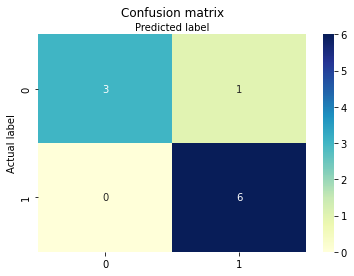

Report:
               precision    recall  f1-score   support

         0.0       1.00      0.75      0.86         4
         1.0       0.86      1.00      0.92         6

    accuracy                           0.90        10
   macro avg       0.93      0.88      0.89        10
weighted avg       0.91      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 2 

               word  importance
546         project        0.08
127       committee        0.08
648           space        0.04
305            help        0.04
125      commission        0.04
222      especially        0.04
464             old        0.04
359         justice        0.04
461        official        0.04
339     information        0.04
694           think        0.04
640           small        0.04
164          create        0.04
538         product        0.04
534         problem        0.04
520            post        0.04
53             bank        0.04
370     

               word  importance
339     information    0.083333
443        national    0.083333
99        challenge    0.041667
62             best    0.041667
724            urge    0.041667
622        security    0.041667
710        training    0.041667
442          nation    0.041667
624            sell    0.041667
140    constitution    0.041667
536         process    0.041667
509          player    0.041667
507            play    0.041667
313        hospital    0.041667
266            form    0.041667
683             tax    0.041667
277             gas    0.041667
660           state    0.041667
429        ministry    0.041667
715             try    0.041667
205        economic    0.041667
579          remain    0.041667
553          public    0.000000
511          police    0.000000
505           plant    0.000000
566         receive    0.000000
506        platform    0.000000
565          reason    0.000000
508          played    0.000000
510           point    0.000000
512     

               word  importance
161           court       0.080
509          player       0.080
620       secretary       0.040
624            sell       0.040
417            mean       0.040
546         project       0.040
545       programme       0.040
423          member       0.040
46        authority       0.040
526       president       0.040
215             end       0.040
127       committee       0.040
464             old       0.040
275          future       0.040
302            head       0.040
98         chairman       0.040
291           great       0.040
19           agency       0.040
488           party       0.040
564            real       0.040
399            long       0.040
560           range       0.040
182          demand       0.025
713          travel       0.015
511          police       0.000
507            play       0.000
508          played       0.000
568        recently       0.000
567          recent       0.000
566         receive       0.000
510     

               word  importance
160          course        0.08
352           issue        0.08
339     information        0.04
558            race        0.04
55             base        0.04
63              big        0.04
716            turn        0.04
255            find        0.04
422         meeting        0.04
546         project        0.04
622        security        0.04
686            team        0.04
222      especially        0.04
88              car        0.04
278         general        0.04
311            home        0.04
14          address        0.04
287            good        0.04
377            lead        0.04
395            live        0.04
659           start        0.04
660           state        0.04
205        economic        0.04
496     performance        0.00
517            port        0.00
512          policy        0.00
513       political        0.00
514      politician        0.00
515            poor        0.00
516      population        0.00
490     

               word  importance
716            turn        0.04
318           human        0.04
734            view        0.04
421            meet        0.04
422         meeting        0.04
429        ministry        0.04
703            told        0.04
327       important        0.04
269           found        0.04
595         revenue        0.04
273            fund        0.04
659           start        0.04
102          change        0.04
287            good        0.04
488           party        0.04
662         station        0.04
33           appear        0.04
106           child        0.04
752           woman        0.04
3         according        0.04
573          region        0.04
205        economic        0.04
579          remain        0.04
389            like        0.04
195        director        0.04
559           raise        0.00
506        platform        0.00
507            play        0.00
508          played        0.00
509          player        0.00
510     

               word  importance
13              add       0.080
25            allow       0.080
291           great       0.040
276            game       0.040
621          sector       0.040
518        position       0.040
327       important       0.040
238          family       0.040
457           offer       0.040
464             old       0.040
127       committee       0.040
546         project       0.040
364            know       0.040
270            free       0.040
250            file       0.040
275          future       0.040
686            team       0.040
300          happen       0.040
560           range       0.040
760           write       0.040
287            good       0.040
189     development       0.040
301            hard       0.025
404             low       0.015
515            poor       0.000
492         payment       0.000
512          policy       0.000
513       political       0.000
491             pay       0.000
514      politician       0.000
490     

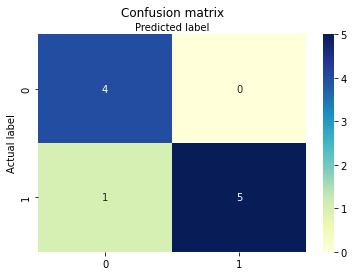

Report:
               precision    recall  f1-score   support

         0.0       0.80      1.00      0.89         4
         1.0       1.00      0.83      0.91         6

    accuracy                           0.90        10
   macro avg       0.90      0.92      0.90        10
weighted avg       0.92      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 3 

               word  importance
374             law        0.08
318           human        0.08
383            left        0.04
422         meeting        0.04
222      especially        0.04
640           small        0.04
546         project        0.04
461        official        0.04
420          medium        0.04
513       political        0.04
503           place        0.04
456          number        0.04
160          course        0.04
345   international        0.04
255            find        0.04
523           power        0.04
620       secretary        0.04
509     

               word  importance
99        challenge        0.04
551         provide        0.04
598            risk        0.04
734            view        0.04
230         explain        0.04
428        minister        0.04
345   international        0.04
343     institution        0.04
442          nation        0.04
328         improve        0.04
140    constitution        0.04
637            site        0.04
460         officer        0.04
88              car        0.04
303          health        0.04
475           order        0.04
276            game        0.04
742           water        0.04
153      corruption        0.04
570          reduce        0.04
569          record        0.04
378          leader        0.04
589        resource        0.04
568        recently        0.04
213          enable        0.04
508          played        0.00
509          player        0.00
510           point        0.00
511          police        0.00
566         receive        0.00
565     

               word  importance
127       committee    0.041667
460         officer    0.041667
269           found    0.041667
548        property    0.041667
417            mean    0.041667
640           small    0.041667
266            form    0.041667
507            play    0.041667
459          office    0.041667
275          future    0.041667
352           issue    0.041667
318           human    0.041667
536         process    0.041667
698            time    0.041667
244         feature    0.041667
624            sell    0.041667
177            deal    0.041667
442          nation    0.041667
659           start    0.041667
207       education    0.041667
668           story    0.041667
378          leader    0.041667
91            carry    0.041667
660           state    0.041667
514      politician    0.000000
510           point    0.000000
511          police    0.000000
512          policy    0.000000
513       political    0.000000
499        personal    0.000000
509     

               word  importance
287            good    0.041667
14          address    0.041667
315           house    0.041667
507            play    0.041667
464             old    0.041667
548        property    0.041667
319            idea    0.041667
611             saw    0.041667
308             hit    0.041667
367            lack    0.041667
534         problem    0.041667
461        official    0.041667
66              bit    0.041667
496     performance    0.041667
209          effort    0.041667
246            feel    0.041667
195        director    0.041667
443        national    0.041667
569          record    0.041667
568        recently    0.041667
7               act    0.041667
230         explain    0.041667
564            real    0.041667
659           start    0.041667
514      politician    0.000000
513       political    0.000000
519        possible    0.000000
518        position    0.000000
511          police    0.000000
520            post    0.000000
515     

               word  importance
13              add        0.08
158         country        0.08
228          expect        0.04
66              bit        0.04
513       political        0.04
271          friend        0.04
354             job        0.04
175            date        0.04
698            time        0.04
468       operation        0.04
507            play        0.04
686            team        0.04
72             book        0.04
87          capital        0.04
122         comment        0.04
693           thing        0.04
62             best        0.04
205        economic        0.04
144         content        0.04
115           close        0.04
402             lot        0.04
287            good        0.04
210        election        0.04
520            post        0.00
524        practice        0.00
523           power        0.00
514      politician        0.00
522       postmedia        0.00
512          policy        0.00
515            poor        0.00
516     

               word  importance
362            kill    0.043478
539      production    0.043478
174            data    0.043478
227       executive    0.043478
359         justice    0.043478
694           think    0.043478
352           issue    0.043478
637            site    0.043478
613          school    0.043478
87          capital    0.043478
137         conduct    0.043478
722      university    0.043478
345   international    0.043478
289      government    0.043478
144         content    0.043478
62             best    0.043478
467            open    0.043478
523           power    0.043478
115           close    0.043478
3         according    0.043478
207       education    0.043478
475           order    0.043478
569          record    0.043478
500           phone    0.000000
516      population    0.000000
514      politician    0.000000
515            poor    0.000000
492         payment    0.000000
491             pay    0.000000
518        position    0.000000
517     

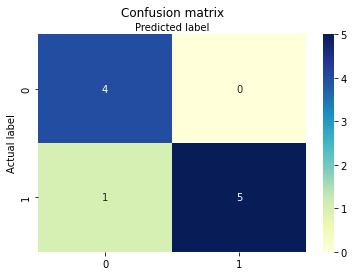

Report:
               precision    recall  f1-score   support

         0.0       0.80      1.00      0.89         4
         1.0       1.00      0.83      0.91         6

    accuracy                           0.90        10
   macro avg       0.90      0.92      0.90        10
weighted avg       0.92      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 4 

               word  importance
464             old        0.08
578         release        0.04
47        available        0.04
354             job        0.04
420          medium        0.04
600            road        0.04
507            play        0.04
33           appear        0.04
736           visit        0.04
417            mean        0.04
621          sector        0.04
415          matter        0.04
605             run        0.04
551         provide        0.04
46        authority        0.04
352           issue        0.04
200           drive        0.04
289     

               word  importance
685         teacher       0.080
526       president       0.080
60          believe       0.040
403            love       0.040
600            road       0.040
423          member       0.040
694           think       0.040
513       political       0.040
260           focus       0.040
429        ministry       0.040
455            note       0.040
345   international       0.040
460         officer       0.040
264           force       0.040
758           world       0.040
246            feel       0.040
248           fight       0.040
392            line       0.040
97           centre       0.040
187         despite       0.040
62             best       0.040
289      government       0.040
695         thought       0.025
520            post       0.015
512          policy       0.000
522       postmedia       0.000
519        possible       0.000
514      politician       0.000
521          posted       0.000
515            poor       0.000
516     

               word  importance
246            feel        0.04
536         process        0.04
35             area        0.04
359         justice        0.04
429        ministry        0.04
76            bring        0.04
164          create        0.04
553          public        0.04
240             far        0.04
47        available        0.04
415          matter        0.04
414           match        0.04
278         general        0.04
475           order        0.04
92             case        0.04
72             book        0.04
161           court        0.04
14          address        0.04
60          believe        0.04
389            like        0.04
586        research        0.04
144         content        0.04
97           centre        0.04
209          effort        0.04
662         station        0.04
520            post        0.00
517            port        0.00
516      population        0.00
526       president        0.00
525         present        0.00
524     

               word  importance
177            deal        0.08
624            sell        0.04
302            head        0.04
546         project        0.04
461        official        0.04
33           appear        0.04
605             run        0.04
694           think        0.04
417            mean        0.04
176             day        0.04
608            sale        0.04
308             hit        0.04
222      especially        0.04
182          demand        0.04
161           court        0.04
423          member        0.04
513       political        0.04
60          believe        0.04
754            work        0.04
3         according        0.04
63              big        0.04
563            read        0.04
621          sector        0.04
620       secretary        0.04
519        possible        0.00
525         present        0.00
526       president        0.00
514      politician        0.00
524        practice        0.00
520            post        0.00
523     

               word  importance
668           story        0.12
53             bank        0.04
559           raise        0.04
488           party        0.04
659           start        0.04
672         student        0.04
300          happen        0.04
302            head        0.04
275          future        0.04
686            team        0.04
311            home        0.04
459          office        0.04
630             set        0.04
145        continue        0.04
624            sell        0.04
218          ensure        0.04
289      government        0.04
9          activity        0.04
398           local        0.04
562           reach        0.04
14          address        0.04
394          little        0.04
578         release        0.04
564            real        0.00
503           place        0.00
504            plan        0.00
505           plant        0.00
506        platform        0.00
507            play        0.00
508          played        0.00
510     

               word  importance
622        security        0.08
0              able        0.04
523           power        0.04
88              car        0.04
122         comment        0.04
127       committee        0.04
176             day        0.04
211           email        0.04
229      experience        0.04
539      production        0.04
537         produce        0.04
513       political        0.04
33           appear        0.04
269           found        0.04
276            game        0.04
497          period        0.04
301            hard        0.04
457           offer        0.04
422         meeting        0.04
359         justice        0.04
407           major        0.04
393            list        0.04
53             bank        0.04
195        director        0.04
743             way        0.00
502         picture        0.00
504            plan        0.00
505           plant        0.00
506        platform        0.00
507            play        0.00
757     

               word  importance
594          return      0.0800
465          online      0.0400
189     development      0.0400
319            idea      0.0400
218          ensure      0.0400
468       operation      0.0400
92             case      0.0400
238          family      0.0400
461        official      0.0400
359         justice      0.0400
467            open      0.0400
532         private      0.0400
348      investment      0.0400
29         announce      0.0400
252           final      0.0400
399            long      0.0400
398           local      0.0400
621          sector      0.0400
205        economic      0.0400
442          nation      0.0400
762            year      0.0400
509          player      0.0400
104          charge      0.0400
707           trade      0.0256
395            live      0.0144
514      politician      0.0000
513       political      0.0000
0              able      0.0000
518        position      0.0000
515            poor      0.0000
516     

               word  importance
291           great        0.08
345   international        0.08
605             run        0.08
96          central        0.04
62             best        0.04
449             new        0.04
722      university        0.04
45           attack        0.04
38           arrest        0.04
460         officer        0.04
509          player        0.04
593          result        0.04
182          demand        0.04
188         develop        0.04
739            want        0.04
378          leader        0.04
299            hand        0.04
289      government        0.04
7               act        0.04
209          effort        0.04
491             pay        0.04
659           start        0.04
498          person        0.00
512          policy        0.00
514      politician        0.00
515            poor        0.00
490         patient        0.00
516      population        0.00
517            port        0.00
489            past        0.00
518     

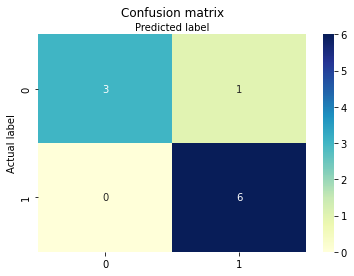

Report:
               precision    recall  f1-score   support

         0.0       1.00      0.75      0.86         4
         1.0       0.86      1.00      0.92         6

    accuracy                           0.90        10
   macro avg       0.93      0.88      0.89        10
weighted avg       0.91      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 5 

               word  importance
443        national        0.08
513       political        0.08
754            work        0.08
275          future        0.04
177            deal        0.04
266            form        0.04
601            role        0.04
734            view        0.04
722      university        0.04
305            help        0.04
240             far        0.04
63              big        0.04
520            post        0.04
246            feel        0.04
620       secretary        0.04
144         content        0.04
276            game        0.04
689     

               word  importance
475           order        0.08
0              able        0.04
140    constitution        0.04
605             run        0.04
423          member        0.04
160          course        0.04
529           price        0.04
289      government        0.04
443        national        0.04
62             best        0.04
455            note        0.04
553          public        0.04
694           think        0.04
467            open        0.04
683             tax        0.04
273            fund        0.04
90             care        0.04
488           party        0.04
176             day        0.04
715             try        0.04
7               act        0.04
209          effort        0.04
762            year        0.04
392            line        0.04
568        recently        0.00
505           plant        0.00
506        platform        0.00
507            play        0.00
508          played        0.00
509          player        0.00
510     

               word  importance
200           drive        0.08
98         chairman        0.08
621          sector        0.04
62             best        0.04
55             base        0.04
339     information        0.04
719      understand        0.04
158         country        0.04
311            home        0.04
722      university        0.04
345   international        0.04
237            fail        0.04
513       political        0.04
605             run        0.04
233            face        0.04
546         project        0.04
464             old        0.04
599           river        0.04
622        security        0.04
668           story        0.04
302            head        0.04
651         special        0.04
400            look        0.04
519        possible        0.00
516      population        0.00
517            port        0.00
494             pen        0.00
493           peace        0.00
492         payment        0.00
518        position        0.00
491     

               word  importance
676          supply    0.041667
403            love    0.041667
277             gas    0.041667
88              car    0.041667
681            talk    0.041667
140    constitution    0.041667
475           order    0.041667
532         private    0.041667
355            join    0.041667
127       committee    0.041667
189     development    0.041667
137         conduct    0.041667
378          leader    0.041667
63              big    0.041667
98         chairman    0.041667
340  infrastructure    0.041667
9          activity    0.041667
210        election    0.041667
488           party    0.041667
622        security    0.041667
624            sell    0.041667
205        economic    0.041667
526       president    0.041667
275          future    0.041667
513       political    0.000000
514      politician    0.000000
512          policy    0.000000
515            poor    0.000000
0              able    0.000000
516      population    0.000000
517     

               word  importance
270            free    0.083333
53             bank    0.041667
698            time    0.041667
734            view    0.041667
420          medium    0.041667
426        military    0.041667
621          sector    0.041667
144         content    0.041667
449             new    0.041667
513       political    0.041667
551         provide    0.041667
693           thing    0.041667
88              car    0.041667
275          future    0.041667
300          happen    0.041667
488           party    0.041667
417            mean    0.041667
105           chief    0.041667
389            like    0.041667
195        director    0.041667
750             win    0.041667
374             law    0.041667
206         economy    0.041667
559           raise    0.000000
567          recent    0.000000
506        platform    0.000000
507            play    0.000000
508          played    0.000000
509          player    0.000000
510           point    0.000000
511     

               word  importance
341      initiative        0.04
435           money        0.04
359         justice        0.04
457           offer        0.04
137         conduct        0.04
598            risk        0.04
235            fact        0.04
722      university        0.04
743             way        0.04
368            land        0.04
698            time        0.04
305            help        0.04
169         current        0.04
750             win        0.04
50              bad        0.04
460         officer        0.04
475           order        0.04
53             bank        0.04
620       secretary        0.04
387            life        0.04
64             bill        0.04
339     information        0.04
579          remain        0.04
252           final        0.04
105           chief        0.04
514      politician        0.00
513       political        0.00
523           power        0.00
516      population        0.00
515            poor        0.00
520     

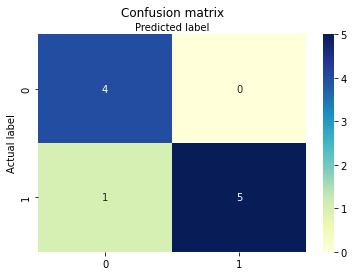

Report:
               precision    recall  f1-score   support

         0.0       0.80      1.00      0.89         4
         1.0       1.00      0.83      0.91         6

    accuracy                           0.90        10
   macro avg       0.90      0.92      0.90        10
weighted avg       0.92      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 6 

               word  importance
389            like        0.08
35             area        0.04
98         chairman        0.04
102          change        0.04
657        standard        0.04
620       secretary        0.04
161           court        0.04
174            data        0.04
555         quality        0.04
229      experience        0.04
546         project        0.04
523           power        0.04
294            grow        0.04
457           offer        0.04
449             new        0.04
359         justice        0.04
417            mean        0.04
686     

               word  importance
0              able        0.04
305            help        0.04
594          return        0.04
222      especially        0.04
468       operation        0.04
689            term        0.04
546         project        0.04
465          online        0.04
35             area        0.04
352           issue        0.04
161           court        0.04
238          family        0.04
722      university        0.04
537         produce        0.04
630             set        0.04
63              big        0.04
526       president        0.04
275          future        0.04
227       executive        0.04
207       education        0.04
392            line        0.04
107          church        0.04
98         chairman        0.04
209          effort        0.04
395            live        0.04
515            poor        0.00
513       political        0.00
492         payment        0.00
514      politician        0.00
491             pay        0.00
517     

               word  importance
3         according        0.08
389            like        0.04
640           small        0.04
275          future        0.04
87          capital        0.04
177            deal        0.04
464             old        0.04
227       executive        0.04
734            view        0.04
507            play        0.04
510           point        0.04
370           large        0.04
513       political        0.04
716            turn        0.04
106           child        0.04
63              big        0.04
620       secretary        0.04
62             best        0.04
182          demand        0.04
686            team        0.04
754            work        0.04
378          leader        0.04
209          effort        0.04
489            past        0.04
514      politician        0.00
515            poor        0.00
516      population        0.00
517            port        0.00
518        position        0.00
519        possible        0.00
500     

               word  importance
739            want    0.045455
209          effort    0.045455
642         society    0.045455
468       operation    0.045455
510           point    0.045455
305            help    0.045455
461        official    0.045455
174            data    0.045455
460         officer    0.045455
557        question    0.045455
457           offer    0.045455
158         country    0.045455
421            meet    0.045455
210        election    0.045455
311            home    0.045455
8            action    0.045455
195        director    0.045455
392            line    0.045455
205        economic    0.045455
762            year    0.045455
569          record    0.045455
754            work    0.045455
517            port    0.000000
523           power    0.000000
508          played    0.000000
509          player    0.000000
522       postmedia    0.000000
511          police    0.000000
512          policy    0.000000
521          posted    0.000000
520     

               word  importance
624            sell    0.083333
475           order    0.041667
255            find    0.041667
340  infrastructure    0.041667
246            feel    0.041667
63              big    0.041667
240             far    0.041667
536         process    0.041667
698            time    0.041667
539      production    0.041667
35             area    0.041667
459          office    0.041667
269           found    0.041667
686            team    0.041667
275          future    0.041667
489            past    0.041667
115           close    0.041667
287            good    0.041667
210        election    0.041667
205        economic    0.041667
659           start    0.041667
403            love    0.041667
661       statement    0.041667
519        possible    0.000000
491             pay    0.000000
518        position    0.000000
490         patient    0.000000
517            port    0.000000
516      population    0.000000
515            poor    0.000000
520     

               word  importance
3         according        0.08
264           force        0.08
709         traffic        0.04
345   international        0.04
422         meeting        0.04
38           arrest        0.04
359         justice        0.04
250            file        0.04
457           offer        0.04
468       operation        0.04
125      commission        0.04
725             use        0.04
536         process        0.04
304            held        0.04
677         support        0.04
460         officer        0.04
169         current        0.04
300          happen        0.04
327       important        0.04
197        division        0.04
105           chief        0.04
668           story        0.04
402             lot        0.04
518        position        0.00
519        possible        0.00
513       political        0.00
516      population        0.00
512          policy        0.00
520            post        0.00
521          posted        0.00
511     

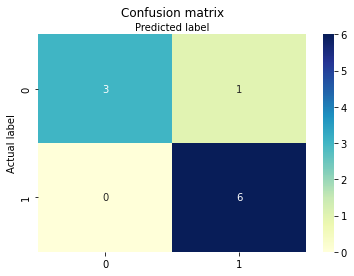

Report:
               precision    recall  f1-score   support

         0.0       1.00      0.75      0.86         4
         1.0       0.86      1.00      0.92         6

    accuracy                           0.90        10
   macro avg       0.93      0.88      0.89        10
weighted avg       0.91      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 7 

               word  importance
443        national        0.08
174            data        0.08
301            hard        0.04
628           serve        0.04
343     institution        0.04
72             book        0.04
429        ministry        0.04
509          player        0.04
507            play        0.04
642         society        0.04
736           visit        0.04
598            risk        0.04
176             day        0.04
305            help        0.04
553          public        0.04
766           youth        0.04
764           young        0.04
395     

               word  importance
640           small    0.086957
624            sell    0.086957
457           offer    0.043478
422         meeting    0.043478
534         problem    0.043478
523           power    0.043478
144         content    0.043478
698            time    0.043478
715             try    0.043478
741           watch    0.043478
642         society    0.043478
308             hit    0.043478
463             oil    0.043478
305            help    0.043478
651         special    0.043478
475           order    0.043478
352           issue    0.043478
661       statement    0.043478
378          leader    0.043478
557        question    0.043478
195        director    0.043478
555         quality    0.000000
567          recent    0.000000
565          reason    0.000000
503           place    0.000000
504            plan    0.000000
505           plant    0.000000
564            real    0.000000
506        platform    0.000000
507            play    0.000000
508     

               word  importance
53             bank        0.04
19           agency        0.04
410      management        0.04
275          future        0.04
742           water        0.04
28              amp        0.04
736           visit        0.04
229      experience        0.04
734            view        0.04
423          member        0.04
264           force        0.04
604            rule        0.04
352           issue        0.04
429        ministry        0.04
76            bring        0.04
261          follow        0.04
698            time        0.04
650        speaking        0.04
622        security        0.04
278         general        0.04
210        election        0.04
399            long        0.04
189     development        0.04
568        recently        0.04
7               act        0.04
490         patient        0.00
493           peace        0.00
514      politician        0.00
492         payment        0.00
491             pay        0.00
515     

               word  importance
651         special        0.08
403            love        0.08
754            work        0.08
622        security        0.04
548        property        0.04
304            held        0.04
47        available        0.04
694           think        0.04
28              amp        0.04
278         general        0.04
562           reach        0.04
637            site        0.04
207       education        0.04
510           point        0.04
605             run        0.04
422         meeting        0.04
523           power        0.04
195        director        0.04
488           party        0.04
3         according        0.04
442          nation        0.04
686            team        0.04
512          policy        0.00
511          police        0.00
516      population        0.00
513       political        0.00
514      politician        0.00
515            poor        0.00
517            port        0.00
518        position        0.00
519     

               word  importance
389            like        0.04
526       president        0.04
598            risk        0.04
422         meeting        0.04
352           issue        0.04
46        authority        0.04
722      university        0.04
345   international        0.04
435           money        0.04
246            feel        0.04
743             way        0.04
622        security        0.04
512          policy        0.04
640           small        0.04
465          online        0.04
92             case        0.04
98         chairman        0.04
660           state        0.04
594          return        0.04
289      government        0.04
393            list        0.04
762            year        0.04
378          leader        0.04
3         according        0.04
579          remain        0.04
511          police        0.00
505           plant        0.00
506        platform        0.00
507            play        0.00
508          played        0.00
509     

               word  importance
642         society    0.083333
383            left    0.041667
520            post    0.041667
86         capacity    0.041667
97           centre    0.041667
105           chief    0.041667
137         conduct    0.041667
192       different    0.041667
526       president    0.041667
255            find    0.041667
264           force    0.041667
28              amp    0.041667
511          police    0.041667
270            free    0.041667
310            hold    0.041667
460         officer    0.041667
442          nation    0.041667
415          matter    0.041667
399            long    0.041667
394          little    0.041667
38           arrest    0.041667
195        director    0.041667
7               act    0.041667
746            week    0.000000
507            play    0.000000
508          played    0.000000
760           write    0.000000
509          player    0.000000
510           point    0.000000
759           would    0.000000
512     

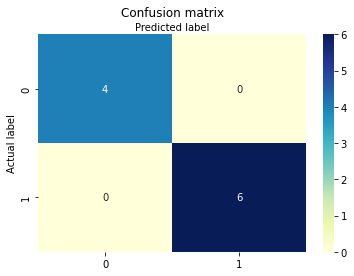

Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         4
         1.0       1.00      1.00      1.00         6

    accuracy                           1.00        10
   macro avg       1.00      1.00      1.00        10
weighted avg       1.00      1.00      1.00        10

Accuracy: 1.0 

-------------------------------------------------------
Try 8 

               word  importance
195        director        0.04
224           event        0.04
553          public        0.04
174            data        0.04
734            view        0.04
532         private        0.04
621          sector        0.04
622        security        0.04
62             best        0.04
140    constitution        0.04
318           human        0.04
510           point        0.04
507            play        0.04
503           place        0.04
88              car        0.04
115           close        0.04
659           start        0.04
660     

               word  importance
195        director       0.040
63              big       0.040
242          farmer       0.040
161           court       0.040
245         federal       0.040
532         private       0.040
715             try       0.040
624            sell       0.040
637            site       0.040
218          ensure       0.040
510           point       0.040
467            open       0.040
127       committee       0.040
686            team       0.040
308             hit       0.040
304            held       0.040
229      experience       0.040
108         citizen       0.040
5            accuse       0.040
579          remain       0.040
762            year       0.040
754            work       0.040
14          address       0.040
399            long       0.040
84         campaign       0.025
248           fight       0.015
516      population       0.000
515            poor       0.000
517            port       0.000
514      politician       0.000
522     

               word  importance
464             old    0.125000
49             away    0.083333
739            want    0.041667
586        research    0.041667
523           power    0.041667
364            know    0.041667
312            hope    0.041667
275          future    0.041667
88              car    0.041667
276            game    0.041667
277             gas    0.041667
703            told    0.041667
422         meeting    0.041667
47        available    0.041667
374             law    0.041667
564            real    0.041667
291           great    0.041667
7               act    0.041667
144         content    0.041667
668           story    0.041667
246            feel    0.041667
517            port    0.000000
512          policy    0.000000
509          player    0.000000
510           point    0.000000
511          police    0.000000
521          posted    0.000000
513       political    0.000000
520            post    0.000000
516      population    0.000000
514     

               word  importance
389            like        0.08
536         process        0.08
246            feel        0.08
370           large        0.08
698            time        0.04
417            mean        0.04
422         meeting        0.04
429        ministry        0.04
716            turn        0.04
53             bank        0.04
305            help        0.04
455            note        0.04
475           order        0.04
666            stop        0.04
127       committee        0.04
228          expect        0.04
211           email        0.04
415          matter        0.04
98         chairman        0.04
403            love        0.04
762            year        0.04
405            main        0.00
512          policy        0.00
513       political        0.00
514      politician        0.00
515            poor        0.00
516      population        0.00
517            port        0.00
518        position        0.00
519        possible        0.00
520     

               word  importance
551         provide        0.08
443        national        0.04
302            head        0.04
640           small        0.04
511          police        0.04
739            want        0.04
233            face        0.04
698            time        0.04
23              aim        0.04
515            poor        0.04
238          family        0.04
88              car        0.04
275          future        0.04
318           human        0.04
651         special        0.04
423          member        0.04
300          happen        0.04
252           final        0.04
343     institution        0.04
144         content        0.04
449             new        0.04
62             best        0.04
518        position        0.04
578         release        0.04
521          posted        0.00
522       postmedia        0.00
512          policy        0.00
517            port        0.00
513       political        0.00
520            post        0.00
516     

               word  importance
210        election    0.080000
102          change    0.040000
659           start    0.040000
278         general    0.040000
546         project    0.040000
545       programme    0.040000
642         society    0.040000
511          police    0.040000
537         produce    0.040000
209          effort    0.040000
402             lot    0.040000
536         process    0.040000
276            game    0.040000
242          farmer    0.040000
327       important    0.040000
287            good    0.040000
7               act    0.040000
255            find    0.040000
568        recently    0.040000
443        national    0.040000
291           great    0.040000
389            like    0.040000
368            land    0.040000
252           final    0.022857
130         company    0.017143
499        personal    0.000000
517            port    0.000000
513       political    0.000000
514      politician    0.000000
515            poor    0.000000
516     

               word  importance
275          future        0.08
147         control        0.04
301            hard        0.04
423          member        0.04
510           point        0.04
694           think        0.04
526       president        0.04
598            risk        0.04
503           place        0.04
368            land        0.04
722      university        0.04
304            held        0.04
38           arrest        0.04
345   international        0.04
215             end        0.04
545       programme        0.04
153      corruption        0.04
189     development        0.04
210        election        0.04
289      government        0.04
53             bank        0.04
394          little        0.04
760           write        0.04
144         content        0.04
513       political        0.00
525         present        0.00
524        practice        0.00
514      politician        0.00
521          posted        0.00
515            poor        0.00
516     

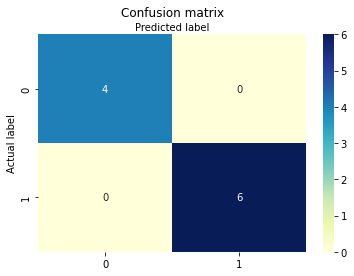

Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         4
         1.0       1.00      1.00      1.00         6

    accuracy                           1.00        10
   macro avg       1.00      1.00      1.00        10
weighted avg       1.00      1.00      1.00        10

Accuracy: 1.0 

-------------------------------------------------------
Try 9 

               word  importance
63              big        0.08
716            turn        0.04
743             way        0.04
715             try        0.04
629         service        0.04
449             new        0.04
695         thought        0.04
640           small        0.04
318           human        0.04
461        official        0.04
269           found        0.04
503           place        0.04
467            open        0.04
125      commission        0.04
115           close        0.04
294            grow        0.04
287            good        0.04
33      

               word  importance
195        director        0.12
374             law        0.04
176             day        0.04
174            data        0.04
359         justice        0.04
423          member        0.04
229      experience        0.04
725             use        0.04
343     institution        0.04
337        industry        0.04
145        continue        0.04
140    constitution        0.04
72             book        0.04
312            hope        0.04
311            home        0.04
503           place        0.04
475           order        0.04
409          manage        0.04
715             try        0.04
215             end        0.04
14          address        0.04
399            long        0.04
287            good        0.04
556           queen        0.00
508          played        0.00
569          record        0.00
509          player        0.00
510           point        0.00
511          police        0.00
512          policy        0.00
513     

               word  importance
693           thing        0.08
327       important        0.08
195        director        0.04
304            held        0.04
546         project        0.04
352           issue        0.04
637            site        0.04
698            time        0.04
87          capital        0.04
681            talk        0.04
182          demand        0.04
161           court        0.04
160          course        0.04
372           later        0.04
92             case        0.04
750             win        0.04
392            line        0.04
475           order        0.04
660           state        0.04
104          charge        0.04
115           close        0.04
9          activity        0.04
526       president        0.04
515            poor        0.00
513       political        0.00
521          posted        0.00
511          police        0.00
512          policy        0.00
520            post        0.00
516      population        0.00
519     

               word  importance
291           great        0.04
119         college        0.04
621          sector        0.04
620       secretary        0.04
252           final        0.04
160          course        0.04
539      production        0.04
459          office        0.04
510           point        0.04
354             job        0.04
265         foreign        0.04
33           appear        0.04
464             old        0.04
642         society        0.04
689            term        0.04
269           found        0.04
622        security        0.04
389            like        0.04
568        recently        0.04
660           state        0.04
398           local        0.04
496     performance        0.04
395            live        0.04
188         develop        0.04
7               act        0.04
520            post        0.00
521          posted        0.00
519        possible        0.00
522       postmedia        0.00
517            port        0.00
523     

               word  importance
622        security        0.08
698            time        0.04
70             body        0.04
460         officer        0.04
422         meeting        0.04
352           issue        0.04
624            sell        0.04
739            want        0.04
238          family        0.04
467            open        0.04
127       committee        0.04
161           court        0.04
471     opportunity        0.04
160          course        0.04
722      university        0.04
503           place        0.04
318           human        0.04
215             end        0.04
704           total        0.04
3         according        0.04
205        economic        0.04
442          nation        0.04
195        director        0.04
102          change        0.04
518        position        0.00
523           power        0.00
524        practice        0.00
514      politician        0.00
517            port        0.00
522       postmedia        0.00
521     

               word  importance
659           start    0.083333
383            left    0.041667
426        military    0.041667
192       different    0.041667
207       education    0.041667
215             end    0.041667
276            game    0.041667
289      government    0.041667
304            held    0.041667
311            home    0.041667
327       important    0.041667
503           place    0.041667
147         control    0.041667
564            real    0.041667
604            rule    0.041667
613          school    0.041667
693           thing    0.041667
694           think    0.041667
698            time    0.041667
716            turn    0.041667
734            view    0.041667
160          course    0.041667
766           youth    0.041667
23              aim    0.000000
522       postmedia    0.000000
513       political    0.000000
514      politician    0.000000
515            poor    0.000000
516      population    0.000000
517            port    0.000000
518     

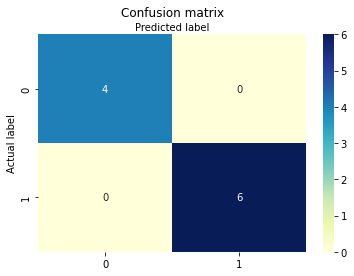

Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         4
         1.0       1.00      1.00      1.00         6

    accuracy                           1.00        10
   macro avg       1.00      1.00      1.00        10
weighted avg       1.00      1.00      1.00        10

Accuracy: 1.0 

-------------------------------------------------------
Try 10 

               word  importance
624            sell        0.04
240             far        0.04
230         explain        0.04
541            prof        0.04
526       president        0.04
551         provide        0.04
271          friend        0.04
161           court        0.04
368            land        0.04
308             hit        0.04
160          course        0.04
275          future        0.04
46        authority        0.04
47        available        0.04
513       political        0.04
750             win        0.04
264           force        0.04
102    

               word  importance
63              big        0.08
766           youth        0.04
600            road        0.04
423          member        0.04
289      government        0.04
442          nation        0.04
147         control        0.04
62             best        0.04
456          number        0.04
698            time        0.04
694           think        0.04
264           force        0.04
510           point        0.04
127       committee        0.04
90             care        0.04
115           close        0.04
489            past        0.04
605             run        0.04
715             try        0.04
578         release        0.04
3         according        0.04
215             end        0.04
402             lot        0.04
403            love        0.04
514      politician        0.00
508          played        0.00
509          player        0.00
569          record        0.00
511          police        0.00
568        recently        0.00
512     

               word  importance
488           party        0.04
352           issue        0.04
468       operation        0.04
174            data        0.04
686            team        0.04
642         society        0.04
33           appear        0.04
640           small        0.04
459          office        0.04
555         quality        0.04
457           offer        0.04
47        available        0.04
344        interest        0.04
158         country        0.04
255            find        0.04
328         improve        0.04
224           event        0.04
443        national        0.04
762            year        0.04
668           story        0.04
392            line        0.04
659           start        0.04
98         chairman        0.04
401            lose        0.04
102          change        0.04
498          person        0.00
512          policy        0.00
513       political        0.00
514      politician        0.00
515            poor        0.00
490     

               word  importance
715             try    0.043478
509          player    0.043478
164          create    0.043478
429        ministry    0.043478
525         present    0.043478
443        national    0.043478
447            need    0.043478
511          police    0.043478
127       committee    0.043478
25            allow    0.043478
464             old    0.043478
467            open    0.043478
302            head    0.043478
677         support    0.043478
475           order    0.043478
97           centre    0.043478
734            view    0.043478
287            good    0.043478
579          remain    0.043478
586        research    0.043478
399            long    0.043478
210        election    0.043478
378          leader    0.043478
510           point    0.000000
505           plant    0.000000
506        platform    0.000000
567          recent    0.000000
566         receive    0.000000
507            play    0.000000
508          played    0.000000
560     

               word  importance
374             law        0.08
246            feel        0.04
370           large        0.04
33           appear        0.04
734            view        0.04
546         project        0.04
41              ask        0.04
485            park        0.04
387            life        0.04
403            love        0.04
694           think        0.04
455            note        0.04
637            site        0.04
507            play        0.04
115           close        0.04
488           party        0.04
449             new        0.04
716            turn        0.04
189     development        0.04
192       different        0.04
207       education        0.04
762            year        0.04
754            work        0.04
400            look        0.04
567          recent        0.00
568        recently        0.00
508          played        0.00
509          player        0.00
510           point        0.00
511          police        0.00
512     

               word  importance
158         country    0.086957
668           story    0.043478
106           child    0.043478
344        interest    0.043478
716            turn    0.043478
61          benefit    0.043478
319            idea    0.043478
318           human    0.043478
677         support    0.043478
299            hand    0.043478
269           found    0.043478
359         justice    0.043478
640           small    0.043478
511          police    0.043478
140    constitution    0.043478
518        position    0.043478
622        security    0.043478
207       education    0.043478
205        economic    0.043478
422         meeting    0.043478
572          regard    0.043478
382           leave    0.043478
530           prime    0.000000
512          policy    0.000000
513       political    0.000000
514      politician    0.000000
515            poor    0.000000
516      population    0.000000
397            loan    0.000000
517            port    0.000000
396     

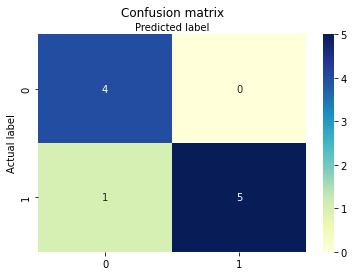

Report:
               precision    recall  f1-score   support

         0.0       0.80      1.00      0.89         4
         1.0       1.00      0.83      0.91         6

    accuracy                           0.90        10
   macro avg       0.90      0.92      0.90        10
weighted avg       0.92      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 11 

               word  importance
460         officer        0.08
368            land        0.08
464             old        0.04
378          leader        0.04
359         justice        0.04
38           arrest        0.04
230         explain        0.04
41              ask        0.04
182          demand        0.04
19           agency        0.04
510           point        0.04
752           woman        0.04
704           total        0.04
374             law        0.04
211           email        0.04
300          happen        0.04
59            begin        0.04
489    

               word  importance
229      experience        0.08
442          nation        0.08
642         society        0.04
537         produce        0.04
85        candidate        0.04
35             area        0.04
459          office        0.04
319            idea        0.04
455            note        0.04
240             far        0.04
215             end        0.04
47        available        0.04
534         problem        0.04
716            turn        0.04
443        national        0.04
331          income        0.04
177            deal        0.04
59            begin        0.04
189     development        0.04
394          little        0.04
207       education        0.04
578         release        0.04
659           start        0.04
520            post        0.00
517            port        0.00
518        position        0.00
495          people        0.00
519        possible        0.00
494             pen        0.00
521          posted        0.00
493     

               word  importance
229      experience        0.16
698            time        0.04
423          member        0.04
35             area        0.04
352           issue        0.04
724            urge        0.04
624            sell        0.04
62             best        0.04
339     information        0.04
182          demand        0.04
460         officer        0.04
510           point        0.04
130         company        0.04
467            open        0.04
88              car        0.04
104          charge        0.04
694           think        0.04
289      government        0.04
189     development        0.04
196        district        0.04
586        research        0.04
215             end        0.04
559           raise        0.00
512          policy        0.00
508          played        0.00
509          player        0.00
568        recently        0.00
511          police        0.00
567          recent        0.00
566         receive        0.00
569     

               word  importance
389            like    0.083333
9          activity    0.083333
215             end    0.041667
91            carry    0.041667
668           story    0.041667
638       situation    0.041667
637            site    0.041667
160          course    0.041667
175            date    0.041667
595         revenue    0.041667
568        recently    0.041667
246            feel    0.041667
46        authority    0.041667
318           human    0.041667
457           offer    0.041667
354             job    0.041667
417            mean    0.041667
371            late    0.041667
403            love    0.041667
395            live    0.041667
53             bank    0.041667
195        director    0.041667
746            week    0.000000
512          policy    0.000000
503           place    0.000000
504            plan    0.000000
505           plant    0.000000
506        platform    0.000000
507            play    0.000000
508          played    0.000000
509     

               word  importance
762            year        0.08
546         project        0.08
378          leader        0.08
389            like        0.04
127       committee        0.04
442          nation        0.04
526       president        0.04
246            feel        0.04
704           total        0.04
429        ministry        0.04
536         process        0.04
693           thing        0.04
38           arrest        0.04
640           small        0.04
269           found        0.04
364            know        0.04
177            deal        0.04
6           achieve        0.04
3         according        0.04
668           story        0.04
760           write        0.04
754            work        0.04
516      population        0.00
510           point        0.00
511          police        0.00
512          policy        0.00
513       political        0.00
488           party        0.00
514      politician        0.00
515            poor        0.00
494     

               word  importance
620       secretary        0.08
98         chairman        0.08
0              able        0.04
319            idea        0.04
350         involve        0.04
638       situation        0.04
238          family        0.04
613          school        0.04
174            data        0.04
597            rise        0.04
551         provide        0.04
553          public        0.04
516      population        0.04
87          capital        0.04
532         private        0.04
715             try        0.04
659           start        0.04
488           party        0.04
111           claim        0.04
489            past        0.04
210        election        0.04
206         economy        0.04
8            action        0.04
521          posted        0.00
512          policy        0.00
513       political        0.00
522       postmedia        0.00
519        possible        0.00
518        position        0.00
520            post        0.00
514     

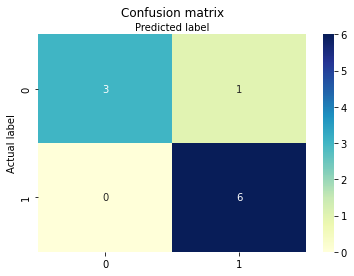

Report:
               precision    recall  f1-score   support

         0.0       1.00      0.75      0.86         4
         1.0       0.86      1.00      0.92         6

    accuracy                           0.90        10
   macro avg       0.93      0.88      0.89        10
weighted avg       0.91      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 12 

               word  importance
7               act       0.080
160          course       0.040
53             bank       0.040
88              car       0.040
685         teacher       0.040
182          demand       0.040
308             hit       0.040
276            game       0.040
475           order       0.040
359         justice       0.040
97           centre       0.040
378          leader       0.040
127       committee       0.040
14          address       0.040
350         involve       0.040
715             try       0.040
733           video       0.040
423    

               word  importance
200           drive        0.04
229      experience        0.04
33           appear        0.04
429        ministry        0.04
156         council        0.04
442          nation        0.04
289      government        0.04
339     information        0.04
248           fight        0.04
622        security        0.04
63              big        0.04
258            firm        0.04
698            time        0.04
459          office        0.04
694           think        0.04
637            site        0.04
311            home        0.04
127       committee        0.04
271          friend        0.04
307         history        0.04
304            held        0.04
422         meeting        0.04
715             try        0.04
3         according        0.04
410      management        0.04
552        province        0.00
513       political        0.00
507            play        0.00
508          played        0.00
509          player        0.00
510     

               word  importance
98         chairman       0.120
278         general       0.080
766           youth       0.040
115           close       0.040
33           appear       0.040
359         justice       0.040
637            site       0.040
442          nation       0.040
513       political       0.040
85        candidate       0.040
703            told       0.040
403            love       0.040
475           order       0.040
423          member       0.040
207       education       0.040
489            past       0.040
523           power       0.040
393            list       0.040
102          change       0.040
715             try       0.040
7               act       0.040
704           total       0.025
262            food       0.015
514      politician       0.000
512          policy       0.000
524        practice       0.000
521          posted       0.000
520            post       0.000
516      population       0.000
517            port       0.000
518     

               word  importance
389            like    0.041667
368            land    0.041667
726            user    0.041667
722      university    0.041667
715             try    0.041667
698            time    0.041667
686            team    0.041667
666            stop    0.041667
294            grow    0.041667
658            star    0.041667
642         society    0.041667
638       situation    0.041667
270            free    0.041667
238          family    0.041667
600            road    0.041667
546         project    0.041667
215             end    0.041667
189     development    0.041667
210        election    0.041667
733           video    0.041667
668           story    0.041667
3         according    0.041667
760           write    0.041667
377            lead    0.041667
515            poor    0.000000
507            play    0.000000
508          played    0.000000
509          player    0.000000
510           point    0.000000
511          police    0.000000
512     

               word  importance
345   international        0.04
503           place        0.04
122         comment        0.04
741           watch        0.04
526       president        0.04
601            role        0.04
318           human        0.04
545       programme        0.04
266            form        0.04
461        official        0.04
637            site        0.04
726            user        0.04
238          family        0.04
160          course        0.04
49             away        0.04
291           great        0.04
144         content        0.04
410      management        0.04
270            free        0.04
14          address        0.04
3         according        0.04
207       education        0.04
209          effort        0.04
186          design        0.04
752           woman        0.04
524        practice        0.00
491             pay        0.00
493           peace        0.00
515            poor        0.00
516      population        0.00
492     

               word  importance
423          member        0.08
278         general        0.04
513       political        0.04
548        property        0.04
270            free        0.04
160          course        0.04
698            time        0.04
722      university        0.04
305            help        0.04
516      population        0.04
90             care        0.04
435           money        0.04
460         officer        0.04
119         college        0.04
294            grow        0.04
403            love        0.04
713          travel        0.04
246            feel        0.04
102          change        0.04
389            like        0.04
668           story        0.04
370           large        0.04
716            turn        0.04
402             lot        0.04
515            poor        0.00
520            post        0.00
519        possible        0.00
517            port        0.00
518        position        0.00
522       postmedia        0.00
514     

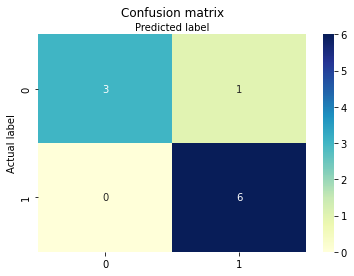

Report:
               precision    recall  f1-score   support

         0.0       1.00      0.75      0.86         4
         1.0       0.86      1.00      0.92         6

    accuracy                           0.90        10
   macro avg       0.93      0.88      0.89        10
weighted avg       0.91      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 13 

               word  importance
464             old        0.04
97           centre        0.04
538         product        0.04
461        official        0.04
164          create        0.04
686            team        0.04
685         teacher        0.04
520            post        0.04
308             hit        0.04
593          result        0.04
635            sign        0.04
722      university        0.04
553          public        0.04
650        speaking        0.04
422         meeting        0.04
378          leader        0.04
716            turn        0.04
62     

               word  importance
210        election    0.083333
672         student    0.041667
465          online    0.041667
640           small    0.041667
686            team    0.041667
429        ministry    0.041667
459          office    0.041667
218          ensure    0.041667
537         produce    0.041667
156         council    0.041667
340  infrastructure    0.041667
229      experience    0.041667
186          design    0.041667
403            love    0.041667
766           youth    0.041667
464             old    0.041667
102          change    0.041667
289      government    0.041667
764           young    0.041667
392            line    0.041667
245         federal    0.041667
195        director    0.041667
400            look    0.041667
511          police    0.000000
512          policy    0.000000
513       political    0.000000
514      politician    0.000000
520            post    0.000000
515            poor    0.000000
516      population    0.000000
523     

               word  importance
60          believe        0.08
461        official        0.08
338          inform        0.04
532         private        0.04
640           small        0.04
600            road        0.04
264           force        0.04
507            play        0.04
310            hold        0.04
429        ministry        0.04
270            free        0.04
215             end        0.04
722      university        0.04
475           order        0.04
343     institution        0.04
278         general        0.04
398           local        0.04
392            line        0.04
102          change        0.04
394          little        0.04
7               act        0.04
659           start        0.04
638       situation        0.04
515            poor        0.00
514      politician        0.00
520            post        0.00
513       political        0.00
517            port        0.00
512          policy        0.00
511          police        0.00
521     

               word  importance
53             bank        0.12
63              big        0.04
368            land        0.04
218          ensure        0.04
725             use        0.04
348      investment        0.04
47        available        0.04
60          believe        0.04
457           offer        0.04
185          deputy        0.04
459          office        0.04
637            site        0.04
509          player        0.04
269           found        0.04
200           drive        0.04
287            good        0.04
182          demand        0.04
195        director        0.04
374             law        0.04
400            look        0.04
579          remain        0.04
758           world        0.04
488           party        0.04
563            read        0.00
514      politician        0.00
508          played        0.00
570          reduce        0.00
510           point        0.00
511          police        0.00
512          policy        0.00
513     

               word  importance
638       situation    0.080000
403            love    0.080000
3         according    0.080000
545       programme    0.080000
465          online    0.040000
507            play    0.040000
189     development    0.040000
269           found    0.040000
174            data    0.040000
694           think    0.040000
9          activity    0.040000
372           later    0.040000
429        ministry    0.040000
7               act    0.040000
536         process    0.040000
106           child    0.040000
620       secretary    0.040000
62             best    0.040000
743             way    0.040000
147         control    0.025000
695         thought    0.022857
660           state    0.017143
209          effort    0.015000
523           power    0.000000
516      population    0.000000
512          policy    0.000000
513       political    0.000000
514      politician    0.000000
488           party    0.000000
515            poor    0.000000
491     

               word  importance
513       political    0.130435
98         chairman    0.043478
374             law    0.043478
467            open    0.043478
311            home    0.043478
459          office    0.043478
457           offer    0.043478
443        national    0.043478
620       secretary    0.043478
345   international    0.043478
422         meeting    0.043478
28              amp    0.043478
594          return    0.043478
215             end    0.043478
403            love    0.043478
53             bank    0.043478
378          leader    0.043478
395            live    0.043478
205        economic    0.043478
3         according    0.043478
399            long    0.043478
569          record    0.000000
510           point    0.000000
511          police    0.000000
512          policy    0.000000
571         reflect    0.000000
514      politician    0.000000
570          reduce    0.000000
515            poor    0.000000
564            real    0.000000
516     

               word  importance
624            sell        0.08
410      management        0.04
532         private        0.04
140    constitution        0.04
637            site        0.04
464             old        0.04
352           issue        0.04
423          member        0.04
422         meeting        0.04
546         project        0.04
734            view        0.04
600            road        0.04
127       committee        0.04
125      commission        0.04
364            know        0.04
682          target        0.04
53             bank        0.04
195        director        0.04
573          region        0.04
3         according        0.04
291           great        0.04
668           story        0.04
207       education        0.04
417            mean        0.04
497          period        0.00
496     performance        0.00
491             pay        0.00
513       political        0.00
514      politician        0.00
515            poor        0.00
516     

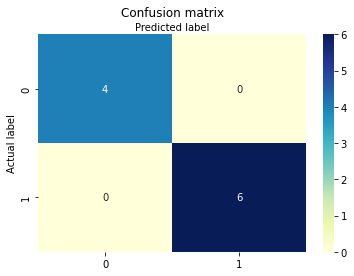

Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         4
         1.0       1.00      1.00      1.00         6

    accuracy                           1.00        10
   macro avg       1.00      1.00      1.00        10
weighted avg       1.00      1.00      1.00        10

Accuracy: 1.0 

-------------------------------------------------------
Try 14 

               word  importance
345   international        0.08
53             bank        0.08
443        national        0.04
734            view        0.04
509          player        0.04
262            food        0.04
269           found        0.04
352           issue        0.04
536         process        0.04
410      management        0.04
275          future        0.04
215             end        0.04
255            find        0.04
278         general        0.04
750             win        0.04
318           human        0.04
488           party        0.04
49     

               word  importance
716            turn        0.04
410      management        0.04
233            face        0.04
350         involve        0.04
235            fact        0.04
435           money        0.04
50              bad        0.04
620       secretary        0.04
60          believe        0.04
703            told        0.04
461        official        0.04
506        platform        0.04
127       committee        0.04
467            open        0.04
471     opportunity        0.04
275          future        0.04
278         general        0.04
659           start        0.04
668           story        0.04
28              amp        0.04
488           party        0.04
382           leave        0.04
579          remain        0.04
215             end        0.04
195        director        0.04
505           plant        0.00
566         receive        0.00
507            play        0.00
508          played        0.00
509          player        0.00
565     

               word  importance
339     information      0.0400
215             end      0.0400
621          sector      0.0400
442          nation      0.0400
624            sell      0.0400
289      government      0.0400
526       president      0.0400
246            feel      0.0400
698            time      0.0400
605             run      0.0400
35             area      0.0400
686            team      0.0400
642         society      0.0400
370           large      0.0400
475           order      0.0400
464             old      0.0400
622        security      0.0400
754            work      0.0400
115           close      0.0400
98         chairman      0.0400
760           write      0.0400
378          leader      0.0400
105           chief      0.0400
1            access      0.0256
248           fight      0.0250
260           focus      0.0150
596           right      0.0144
489            past      0.0000
517            port      0.0000
514      politician      0.0000
515     

               word  importance
106           child    0.043478
115           close    0.043478
246            feel    0.043478
640           small    0.043478
605             run    0.043478
509          player    0.043478
422         meeting    0.043478
548        property    0.043478
686            team    0.043478
505           plant    0.043478
597            rise    0.043478
417            mean    0.043478
177            deal    0.043478
305            help    0.043478
215             end    0.043478
750             win    0.043478
174            data    0.043478
93            cause    0.043478
289      government    0.043478
395            live    0.043478
399            long    0.043478
377            lead    0.043478
569          record    0.043478
515            poor    0.000000
489            past    0.000000
511          police    0.000000
512          policy    0.000000
513       political    0.000000
514      politician    0.000000
516      population    0.000000
517     

               word  importance
144         content      0.0800
98         chairman      0.0800
668           story      0.0400
497          period      0.0400
600            road      0.0400
734            view      0.0400
640           small      0.0400
605             run      0.0400
176             day      0.0400
741           watch      0.0400
722      university      0.0400
536         process      0.0400
301            hard      0.0400
158         country      0.0400
370           large      0.0400
449             new      0.0400
378          leader      0.0400
568        recently      0.0400
244         feature      0.0400
716            turn      0.0400
461        official      0.0400
399            long      0.0400
424             men      0.0256
182          demand      0.0144
515            poor      0.0000
519        possible      0.0000
516      population      0.0000
514      politician      0.0000
513       political      0.0000
520            post      0.0000
512     

               word  importance
686            team    0.083333
200           drive    0.041667
456          number    0.041667
595         revenue    0.041667
222      especially    0.041667
443        national    0.041667
736           visit    0.041667
315           house    0.041667
513       political    0.041667
555         quality    0.041667
725             use    0.041667
429        ministry    0.041667
327       important    0.041667
63              big    0.041667
523           power    0.041667
622        security    0.041667
467            open    0.041667
464             old    0.041667
526       president    0.041667
3         according    0.041667
7               act    0.041667
195        director    0.041667
579          remain    0.041667
522       postmedia    0.000000
488           party    0.000000
521          posted    0.000000
489            past    0.000000
520            post    0.000000
501           photo    0.000000
518        position    0.000000
517     

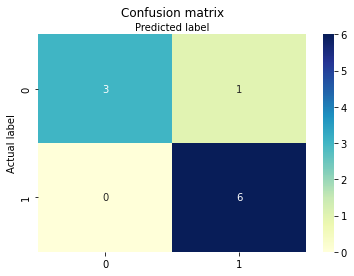

Report:
               precision    recall  f1-score   support

         0.0       1.00      0.75      0.86         4
         1.0       0.86      1.00      0.92         6

    accuracy                           0.90        10
   macro avg       0.93      0.88      0.89        10
weighted avg       0.91      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 15 

               word  importance
383            left        0.04
161           court        0.04
33           appear        0.04
359         justice        0.04
513       political        0.04
269           found        0.04
509          player        0.04
38           arrest        0.04
313        hospital        0.04
551         provide        0.04
417            mean        0.04
460         officer        0.04
125      commission        0.04
222      especially        0.04
698            time        0.04
160          course        0.04
330         include        0.04
192    

               word  importance
488           party        0.08
716            turn        0.08
715             try        0.04
555         quality        0.04
512          policy        0.04
600            road        0.04
127       committee        0.04
503           place        0.04
450            news        0.04
725             use        0.04
176             day        0.04
429        ministry        0.04
305            help        0.04
605             run        0.04
678            sure        0.04
275          future        0.04
90             care        0.04
435           money        0.04
712       transport        0.04
660           state        0.04
659           start        0.04
246            feel        0.04
623            seek        0.04
520            post        0.00
521          posted        0.00
518        position        0.00
515            poor        0.00
519        possible        0.00
514      politician        0.00
513       political        0.00
516     

               word  importance
579          remain        0.04
362            kill        0.04
546         project        0.04
33           appear        0.04
423          member        0.04
35             area        0.04
38           arrest        0.04
47        available        0.04
158         country        0.04
291           great        0.04
621          sector        0.04
715             try        0.04
339     information        0.04
509          player        0.04
464             old        0.04
277             gas        0.04
475           order        0.04
677         support        0.04
302            head        0.04
99        challenge        0.04
287            good        0.04
229      experience        0.04
488           party        0.04
205        economic        0.04
189     development        0.04
552        province        0.00
505           plant        0.00
506        platform        0.00
566         receive        0.00
507            play        0.00
508     

               word  importance
659           start    0.083333
526       president    0.083333
620       secretary    0.041667
450            news    0.041667
33           appear    0.041667
605             run    0.041667
53             bank    0.041667
255            find    0.041667
449             new    0.041667
257            fire    0.041667
595         revenue    0.041667
689            term    0.041667
686            team    0.041667
273            fund    0.041667
496     performance    0.041667
296        guardian    0.041667
102          change    0.041667
176             day    0.041667
104          charge    0.041667
378          leader    0.041667
211           email    0.041667
762            year    0.041667
510           point    0.000000
504            plan    0.000000
564            real    0.000000
505           plant    0.000000
506        platform    0.000000
507            play    0.000000
508          played    0.000000
509          player    0.000000
511     

               word  importance
546         project    0.083333
359         justice    0.083333
739            want    0.041667
120            come    0.041667
145        continue    0.041667
53             bank    0.041667
631           share    0.041667
160          course    0.041667
698            time    0.041667
539      production    0.041667
694           think    0.041667
268         forward    0.041667
229      experience    0.041667
273            fund    0.041667
275          future    0.041667
523           power    0.041667
7               act    0.041667
392            line    0.041667
98         chairman    0.041667
399            long    0.041667
97           centre    0.041667
210        election    0.041667
497          period    0.000000
515            poor    0.000000
513       political    0.000000
492         payment    0.000000
514      politician    0.000000
491             pay    0.000000
516      population    0.000000
511          police    0.000000
517     

               word  importance
205        economic       0.080
389            like       0.040
311            home       0.040
734            view       0.040
161           court       0.040
47        available       0.040
532         private       0.040
526       president       0.040
455            note       0.040
464             old       0.040
503           place       0.040
225         example       0.040
276            game       0.040
305            help       0.040
92             case       0.040
498          person       0.040
302            head       0.040
104          charge       0.040
546         project       0.040
53             bank       0.040
403            love       0.040
7               act       0.040
764           young       0.040
313        hospital       0.025
442          nation       0.015
558            race       0.000
509          player       0.000
505           plant       0.000
506        platform       0.000
566         receive       0.000
507     

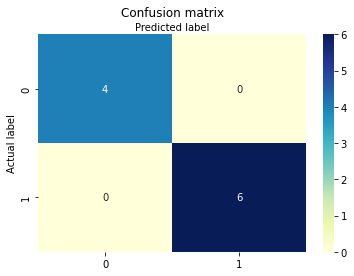

Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         4
         1.0       1.00      1.00      1.00         6

    accuracy                           1.00        10
   macro avg       1.00      1.00      1.00        10
weighted avg       1.00      1.00      1.00        10

Accuracy: 1.0 

-------------------------------------------------------
Try 16 

               word  importance
403            love      0.0800
475           order      0.0800
374             law      0.0400
459          office      0.0400
417            mean      0.0400
318           human      0.0400
737            vote      0.0400
624            sell      0.0400
510           point      0.0400
698            time      0.0400
704           total      0.0400
278         general      0.0400
526       president      0.0400
457           offer      0.0400
98         chairman      0.0400
63              big      0.0400
568        recently      0.0400
660    

               word  importance
229      experience    0.095238
620       secretary    0.047619
594          return    0.047619
97           centre    0.047619
659           start    0.047619
84         campaign    0.047619
78         building    0.047619
513       political    0.047619
629         service    0.047619
144         content    0.047619
526       president    0.047619
534         problem    0.047619
238          family    0.047619
160          course    0.047619
237            fail    0.047619
422         meeting    0.047619
102          change    0.047619
195        director    0.047619
403            love    0.047619
374             law    0.047619
560           range    0.000000
569          record    0.000000
507            play    0.000000
508          played    0.000000
509          player    0.000000
510           point    0.000000
511          police    0.000000
512          policy    0.000000
514      politician    0.000000
505           plant    0.000000
515     

               word  importance
551         provide        0.08
443        national        0.04
303          health        0.04
63              big        0.04
350         involve        0.04
137         conduct        0.04
640           small        0.04
235            fact        0.04
174            data        0.04
275          future        0.04
29         announce        0.04
278         general        0.04
414           match        0.04
120            come        0.04
90             care        0.04
276            game        0.04
209          effort        0.04
189     development        0.04
6           achieve        0.04
115           close        0.04
104          charge        0.04
659           start        0.04
299            hand        0.04
287            good        0.04
498          person        0.00
513       political        0.00
494             pen        0.00
514      politician        0.00
493           peace        0.00
515            poor        0.00
516     

               word  importance
0              able        0.08
102          change        0.08
352           issue        0.08
559           raise        0.04
328         improve        0.04
327       important        0.04
449             new        0.04
631           share        0.04
722      university        0.04
536         process        0.04
642         society        0.04
686            team        0.04
177            deal        0.04
305            help        0.04
275          future        0.04
370           large        0.04
59            begin        0.04
569          record        0.04
14          address        0.04
403            love        0.04
195        director        0.04
205        economic        0.04
517            port        0.00
513       political        0.00
514      politician        0.00
515            poor        0.00
490         patient        0.00
516      population        0.00
489            past        0.00
497          period        0.00
518     

               word  importance
659           start        0.08
35             area        0.08
716            turn        0.04
631           share        0.04
422         meeting        0.04
38           arrest        0.04
161           court        0.04
442          nation        0.04
621          sector        0.04
137         conduct        0.04
227       executive        0.04
511          police        0.04
264           force        0.04
311            home        0.04
88              car        0.04
273            fund        0.04
600            road        0.04
289      government        0.04
755          worker        0.04
399            long        0.04
764           young        0.04
579          remain        0.04
403            love        0.04
558            race        0.00
565          reason        0.00
507            play        0.00
508          played        0.00
509          player        0.00
566         receive        0.00
510           point        0.00
513     

               word  importance
569          record        0.08
734            view        0.08
328         improve        0.08
35             area        0.04
743             way        0.04
695         thought        0.04
725             use        0.04
513       political        0.04
594          return        0.04
258            firm        0.04
176             day        0.04
240             far        0.04
265         foreign        0.04
546         project        0.04
488           party        0.04
295          growth        0.04
394          little        0.04
392            line        0.04
5            accuse        0.04
764           young        0.04
62             best        0.04
539      production        0.04
509          player        0.00
510           point        0.00
511          police        0.00
0              able        0.00
512          policy        0.00
514      politician        0.00
508          played        0.00
516      population        0.00
517     

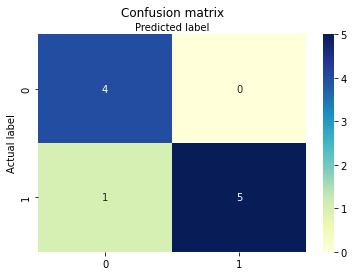

Report:
               precision    recall  f1-score   support

         0.0       0.80      1.00      0.89         4
         1.0       1.00      0.83      0.91         6

    accuracy                           0.90        10
   macro avg       0.90      0.92      0.90        10
weighted avg       0.92      0.90      0.90        10

Accuracy: 0.9 

-------------------------------------------------------
Try 17 

               word  importance
766           youth      0.0400
407           major      0.0400
553          public      0.0400
33           appear      0.0400
423          member      0.0400
38           arrest      0.0400
352           issue      0.0400
429        ministry      0.0400
620       secretary      0.0400
63              big      0.0400
706            town      0.0400
694           think      0.0400
467            open      0.0400
269           found      0.0400
90             care      0.0400
304            held      0.0400
104          charge      0.0400
182    

               word  importance
594          return        0.08
318           human        0.08
605             run        0.04
464             old        0.04
686            team        0.04
461        official        0.04
734            view        0.04
637            site        0.04
422         meeting        0.04
0              able        0.04
364            know        0.04
158         country        0.04
339     information        0.04
716            turn        0.04
526       president        0.04
62             best        0.04
509          player        0.04
642         society        0.04
98         chairman        0.04
300          happen        0.04
99        challenge        0.04
374             law        0.04
624            sell        0.04
503           place        0.00
517            port        0.00
512          policy        0.00
513       political        0.00
514      politician        0.00
490         patient        0.00
515            poor        0.00
516     

               word  importance
195        director        0.04
530           prime        0.04
46        authority        0.04
694           think        0.04
681            talk        0.04
666            stop        0.04
660           state        0.04
640           small        0.04
629         service        0.04
605             run        0.04
536         process        0.04
264           force        0.04
25            allow        0.04
269           found        0.04
270            free        0.04
278         general        0.04
311            home        0.04
422         meeting        0.04
412          market        0.04
368            land        0.04
404             low        0.04
378          leader        0.04
45           attack        0.04
389            like        0.04
14          address        0.04
744             web        0.00
756         workers        0.00
502         picture        0.00
503           place        0.00
504            plan        0.00
758     

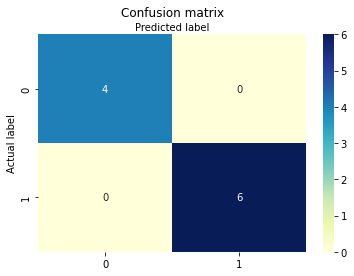

Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         4
         1.0       1.00      1.00      1.00         6

    accuracy                           1.00        10
   macro avg       1.00      1.00      1.00        10
weighted avg       1.00      1.00      1.00        10

Accuracy: 1.0 

-------------------------------------------------------
Try 18 

               word  importance
289      government      0.1200
200           drive      0.0800
546         project      0.0800
33           appear      0.0400
192       different      0.0400
209          effort      0.0400
160          course      0.0400
624            sell      0.0400
264           force      0.0400
127       committee      0.0400
270            free      0.0400
681            talk      0.0400
461        official      0.0400
345   international      0.0400
429        ministry      0.0400
389            like      0.0400
670          street      0.0400
395    

               word  importance
526       president        0.04
422         meeting        0.04
306            high        0.04
694           think        0.04
551         provide        0.04
410      management        0.04
50              bad        0.04
589        resource        0.04
76            bring        0.04
84         campaign        0.04
734            view        0.04
724            urge        0.04
374             law        0.04
99        challenge        0.04
125      commission        0.04
377            lead        0.04
529           price        0.04
192       different        0.04
621          sector        0.04
660           state        0.04
206         economy        0.04
205        economic        0.04
546         project        0.04
60          believe        0.04
392            line        0.04
512          policy        0.00
513       political        0.00
517            port        0.00
514      politician        0.00
515            poor        0.00
516     

               word  importance
460         officer        0.12
468       operation        0.04
553          public        0.04
215             end        0.04
319            idea        0.04
28              amp        0.04
211           email        0.04
343     institution        0.04
278         general        0.04
461        official        0.04
754            work        0.04
402             lot        0.04
242          farmer        0.04
224           event        0.04
53             bank        0.04
225         example        0.04
1            access        0.04
659           start        0.04
311            home        0.04
395            live        0.04
422         meeting        0.04
264           force        0.04
88              car        0.04
512          policy        0.00
517            port        0.00
513       political        0.00
514      politician        0.00
515            poor        0.00
516      population        0.00
510           point        0.00
518     

               word  importance
681            talk        0.04
88              car        0.04
271          friend        0.04
182          demand        0.04
410      management        0.04
503           place        0.04
72             book        0.04
598            risk        0.04
345   international        0.04
176             day        0.04
404             low        0.04
475           order        0.04
378          leader        0.04
429        ministry        0.04
76            bring        0.04
53             bank        0.04
33           appear        0.04
319            idea        0.04
7               act        0.04
35             area        0.04
659           start        0.04
459          office        0.04
447            need        0.04
662         station        0.04
457           offer        0.04
514      politician        0.00
0              able        0.00
515            poor        0.00
512          policy        0.00
516      population        0.00
517     

               word  importance
174            data        0.04
134        complete        0.04
302            head        0.04
182          demand        0.04
28              amp        0.04
423          member        0.04
229      experience        0.04
429        ministry        0.04
237            fail        0.04
186          design        0.04
461        official        0.04
345   international        0.04
140    constitution        0.04
106           child        0.04
246            feel        0.04
530           prime        0.04
215             end        0.04
449             new        0.04
400            look        0.04
207       education        0.04
3         according        0.04
295          growth        0.04
660           state        0.04
389            like        0.04
395            live        0.04
494             pen        0.00
518        position        0.00
519        possible        0.00
495          people        0.00
520            post        0.00
522     

               word  importance
743             way        0.08
754            work        0.08
578         release        0.04
76            bring        0.04
92             case        0.04
98         chairman        0.04
659           start        0.04
638       situation        0.04
613          school        0.04
174            data        0.04
182          demand        0.04
238          family        0.04
240             far        0.04
246            feel        0.04
255            find        0.04
509          player        0.04
308             hit        0.04
352           issue        0.04
415          matter        0.04
725             use        0.04
389            like        0.04
14          address        0.04
764           young        0.04
747            west        0.00
513       political        0.00
505           plant        0.00
506        platform        0.00
507            play        0.00
508          played        0.00
762            year        0.00
510     

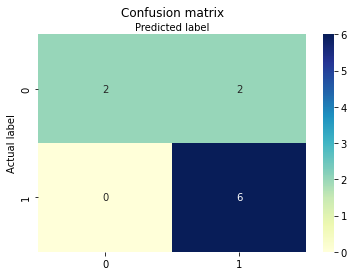

Report:
               precision    recall  f1-score   support

         0.0       1.00      0.50      0.67         4
         1.0       0.75      1.00      0.86         6

    accuracy                           0.80        10
   macro avg       0.88      0.75      0.76        10
weighted avg       0.85      0.80      0.78        10

Accuracy: 0.8 

-------------------------------------------------------
Try 19 

               word  importance
205        economic        0.08
289      government        0.04
45           attack        0.04
176             day        0.04
60          believe        0.04
546         project        0.04
638       situation        0.04
457           offer        0.04
539      production        0.04
140    constitution        0.04
47        available        0.04
182          demand        0.04
49             away        0.04
345   international        0.04
255            find        0.04
246            feel        0.04
339     information        0.04
443    

               word  importance
275          future        0.08
624            sell        0.08
255            find        0.08
195        director        0.04
605             run        0.04
102          change        0.04
106           child        0.04
115           close        0.04
127       committee        0.04
130         company        0.04
160          course        0.04
523           power        0.04
189     development        0.04
739            want        0.04
513       political        0.04
305            help        0.04
468       operation        0.04
459          office        0.04
457           offer        0.04
374             law        0.04
63              big        0.04
389            like        0.04
745         website        0.00
759           would        0.00
504            plan        0.00
505           plant        0.00
506        platform        0.00
507            play        0.00
508          played        0.00
509          player        0.00
510     

               word  importance
422         meeting      0.1600
449             new      0.0400
355            join      0.0400
637            site      0.0400
464             old      0.0400
624            sell      0.0400
536         process      0.0400
90             care      0.0400
301            hard      0.0400
215             end      0.0400
450            news      0.0400
373          launch      0.0400
710        training      0.0400
523           power      0.0400
716            turn      0.0400
207       education      0.0400
573          region      0.0400
289      government      0.0400
707           trade      0.0400
7               act      0.0400
661       statement      0.0400
93            cause      0.0256
311            home      0.0144
509          player      0.0000
510           point      0.0000
521          posted      0.0000
511          police      0.0000
518        position      0.0000
512          policy      0.0000
517            port      0.0000
514     

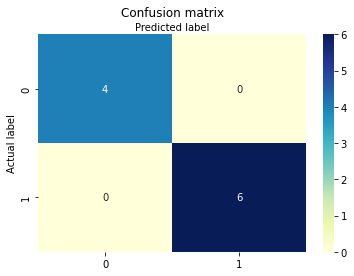

Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         4
         1.0       1.00      1.00      1.00         6

    accuracy                           1.00        10
   macro avg       1.00      1.00      1.00        10
weighted avg       1.00      1.00      1.00        10

Accuracy: 1.0 

-------------------------------------------------------
Try 20 

               word  importance
624            sell       0.080
14          address       0.080
716            turn       0.040
557        question       0.040
620       secretary       0.040
153      corruption       0.040
160          course       0.040
631           share       0.040
429        ministry       0.040
423          member       0.040
457           offer       0.040
637            site       0.040
459          office       0.040
598            risk       0.040
467            open       0.040
680          system       0.040
739            want       0.040
9      

               word  importance
98         chairman        0.08
195        director        0.04
509          player        0.04
743             way        0.04
35             area        0.04
605             run        0.04
537         produce        0.04
255            find        0.04
268         forward        0.04
640           small        0.04
318           human        0.04
370           large        0.04
127       committee        0.04
646          source        0.04
685         teacher        0.04
92             case        0.04
671          strong        0.04
104          charge        0.04
555         quality        0.04
105           chief        0.04
399            long        0.04
750             win        0.04
205        economic        0.04
207       education        0.04
556           queen        0.00
504            plan        0.00
567          recent        0.00
566         receive        0.00
505           plant        0.00
506        platform        0.00
507     

               word  importance
63              big       0.080
509          player       0.080
304            held       0.080
716            turn       0.040
315           house       0.040
465          online       0.040
467            open       0.040
86         capacity       0.040
295          growth       0.040
668           story       0.040
289      government       0.040
390          likely       0.040
278         general       0.040
496     performance       0.040
275          future       0.040
507            play       0.040
255            find       0.040
624            sell       0.040
620       secretary       0.040
536         process       0.040
115           close       0.040
78         building       0.025
573          region       0.015
412          market       0.000
413       marketing       0.000
512          policy       0.000
513       political       0.000
514      politician       0.000
515            poor       0.000
516      population       0.000
394     

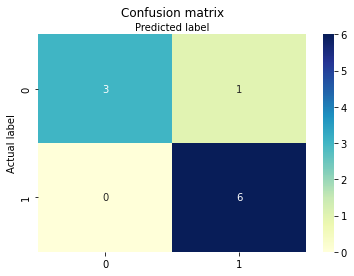

Report:
               precision    recall  f1-score   support

         0.0       1.00      0.75      0.86         4
         1.0       0.86      1.00      0.92         6

    accuracy                           0.90        10
   macro avg       0.93      0.88      0.89        10
weighted avg       0.91      0.90      0.90        10

Accuracy: 0.9 


Accuracy Array: [0.9 0.9 0.9 0.9 0.9 0.9 1.  1.  1.  0.9 0.9 0.9 1.  0.9 1.  0.9 1.  0.8
 1.  0.9]
Accuracy Mean: 0.9299999999999999
Accuracy Population SD: 0.05567764362830021
Accuracy Sample SD: 0.05712405705774792
Accuracy SEM: 0.012773327473170098

['university', 'urge', 'line', 'time', 'find', 'available', 'line', 'election', 'big', 'found', 'project', 'information', 'look', 'court', 'world', 'course', 'good', 'turn', 'great', 'add', 'law', 'challenge', 'club', 'committee', 'society', 'good', 'training', 'chairman', 'add', 'kill', 'old', 'teacher', 'believe', 'feel', 'deal', 'story', 'election', 'security', 'return', 'great', 'nationa

In [448]:
# missing pk & za --> total 10 peaceful and not peaceful countries

# use method pd.DataFrame(df).to_numpy() to convert dataframe to numpy array
df_2010to2020_peace_NoNeut = df_2010to2020_peace.drop(index=['Ghana GH', 'Hong Kong HK', 'India IN', 'Jamaica JM', 'Sri Lanka LK', 'Malaysia MY', 'Philippines PH', 'United States US'])
data = df_2010to2020_peace_NoNeut.drop(['Sum', 'Group Name'], axis=1)
adata = data.to_numpy()
rows,cols=adata.shape
# print("rows:", rows) = 10
# print("cols:", cols) = 1043

# set loop times !!!!!!
loop = 20
accuracy_arr = np.zeros(loop)

# save the most important word here (for every try, 10 words are collected)
important_lst = list()

for x in range(loop):

    print('-------------------------------------------------------')
    print('Try', x+1, '\n')

    #remove row i, train all else, test i
    predict=np.zeros((rows))
    for m in range(rows):
        # np.delete(data, index, axis) return what is left
        adatam1=np.delete(adata, m, 0)
        X_train=np.delete(adatam1, cols-1, 1)
        y_train=adatam1[:,cols-1]
        #print('\nm =',m)
        #Random Forest classifier
        #forest = RandomForestClassifier(criterion='gini',n_estimators=25,random_state=42,n_jobs=2)
        forest = RandomForestClassifier(criterion='gini',n_estimators=25,n_jobs=2)
        forest.fit(X_train, y_train)
        X_test=adata[m,0:cols-1]
        X_test=X_test.reshape(1, -1)
        predict[m]=forest.predict(X_test)
        
        # compute feature importance: EVERY TRYING GENERATES 10 IMPORTANCE-TABLES, HOW DO WE DEAL WITH THAT?
        q=[[0 for x in range(2)] for y in range(cols-1)]
        # print(q)
        importances = forest.feature_importances_
        # print(importances)
        for i in range(cols-1):
            q[i][0]=data.columns[i]
            q[i][1]=importances[i]
        df=pd.DataFrame(q)
        df.columns=['word','importance']
        sort=df.sort_values(by=['importance'],ascending=False)
        print(sort)
        print()
        important_lst.append(sort.iloc[0][0])

    y_test=y_train=adata[:,cols-1]
    y_pred=predict
    
    # df_actu_pred_index = ['Australia AU', 'Bangladesh BD', 'Canada CA', 'United Kingdom GB', 'Ireland IE', 'Kenya KE', 'Nigeria NG', 'New Zealand NZ', 'Pakistan PK', 'Singapore SG', 'Tanzania TZ']
    # print_df_actu_pred(y_test, y_pred, df_actu_pred_index)

    print_simple_confusion_matrx(y_test, y_pred)
    print_pretty_confusion_matrx(y_test, y_pred, [0,1])
    print_curr_pred_report(y_test, y_pred)
        
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy, '\n')
    
    # fill accuracy data in an array
    accuracy_arr[x] = accuracy
          
print_accuracy_report(accuracy_arr)
print()
print(important_lst)

In [449]:
df_peace_wrd_sortedLst_update = df_peace_wrd_sortedLst.style.applymap(lambda x: 'background-color : red' if x in important_lst else '')
df_notpeace_wrd_sortedLst_update = df_notpeace_wrd_sortedLst.style.applymap(lambda x: 'background-color : red' if x in important_lst else '')

In [450]:
# df_peace_wrd_sortedLst_update = df_peace_wrd_sortedLst_update.applymap(\
#          lambda x: 'background-color : orange' if x in important_lst_1 and x in important_lst\
#     else '').applymap(lambda x: 'background-color : red' if x in important_lst and x not in important_lst_1\
#     else '').applymap(lambda x: 'background-color : yellow' if x in important_lst_1 and x not in important_lst\
#     else '')

In [451]:
df_all_wrd_styled_update = df_all_wrd_update.style.applymap(lambda x: 'background-color : red' if x in important_lst else '')

In [452]:
df_all_wrd_styled_update

,Notpeace,0 Count,Peace,1 Count
0,state,187579.000000,time,409580
1,government,161409.000000,people,378012
2,people,136572.000000,new,313290
3,country,135245.000000,work,309182
4,president,93318.000000,use,304381
5,time,91229.000000,like,291324
6,come,81038.000000,come,267715
7,work,69295.000000,need,209246
8,new,68473.000000,look,203832
9,use,67592.000000,include,201315


In [453]:
df_all_wrd_styled_update.to_excel('p_n_notp_words_update.xlsx', engine='openpyxl', index=False) 

In [454]:
important_lst_1 = \
[ 'event', 'especially', 'constitution', 'story', 'time', \
 'view', 'ministry', 'according', 'according', 'university', \
'government', 'night', 'big', 'project', 'story', \
'sheikh', 'percent', 'release', 'new', 'place', \
'ministry', 'different', 'project', 'economic', 'centre', \
'leader', 'experience', 'secretary', 'time', 'president', \
'member', 'find', 'sector', 'story', 'release', \
'situation', 'officer', 'life', 'age', 'car', \
'find', 'commission', 'director', 'court', 'order', \
'jonathan', 'great', 'nation', 'game', 'full', \
'ms', 'best', 'place', 'release', 'love', \
'early', 'often', 'production', 'good', 'nation', \
'ministry', 'country', 'age', 'experience', 'often', \
'full', 'team', 'national', 'feel', 'love', \
'great', 'man', 'power', 'feel', 'long', \
'law', 'think', 'open', 'write', 'arrest', \
'well', 'day', 'offer', 'land', 'hour', \
'record', 'project', 'change', 'month', 'chief', \
'street', 'youth', 'future', 'general', 'sector', \
'land', 'general', 'open', 'leave', 'view', \
'long', 'member', 'official', 'bill', 'early', \
'various', 'season', 'committee', 'lot', 'use', \
'offer', 'month', 'age', 'party', 'country', \
'future', 'hour', 'happen', 'meeting', 'game', \
'full', 'offer', 'society', 'chairman', 'sector', \
'story', 'government', 'centre', 'general', 'large', \
'national', 'road', 'nation', 'data', 'story', \
'place', 'news', 'great', 'official', 'turn', \
'director', 'site', 'left', 'political', 'ministry', \
'great', 'top', 'society', 'future', 'little', \
'full', 'capacity', 'official', 'place', 'major', \
'story', 'mobile', 'official', 'official', 'bank', \
'time', 'big', 'project', 'provide', 'leader', \
'order', 'game', 'growth', 'office', 'help', \
'team', 'official', 'different', 'amp', 'development', \
'change', 'nation', 'election', 'always', 'big', \
'money', 'city', 'law', 'video', 'release', \
'move', 'play', 'office', 'long', 'education', \
'meeting', 'big', 'car', 'season', 'committee', \
'great', 'car', 'place', 'capital', 'kill' ]

In [455]:
df_all_wrd_1 = pd.read_pickle('df_all_wrd_1.pkl')
df_all_wrd_styled_1 = df_all_wrd_1.style.applymap(lambda x: 'background-color : yellow' if x in important_lst_1 else '')

In [456]:
df_notpeace_wrd_sortedLst_1 = df_all_wrd_1.iloc[:,[0, 1]]
df_notpeace_wrd_sortedLst_1.columns = ['Word', 'Count']

df_peace_wrd_sortedLst_1 = df_all_wrd_1.iloc[:, [2, 3]]
df_peace_wrd_sortedLst_1.columns = ['Word', 'Count']

In [457]:
df_notpeace_wrd_sortedLst_1

,Word,Count
0,state,197326.0
1,nigeria,164717.0
2,government,163651.0
3,people,137769.0
4,country,137002.0
5,year,135913.0
6,president,94390.0
7,time,93123.0
8,national,84740.0
9,well,74230.0


In [458]:
df_all_wrd_1

,Notpeace,0 Count,Peace,1 Count
0,state,197326.0,year,638740
1,nigeria,164717.0,new,486784
2,government,163651.0,time,416247
3,people,137769.0,people,379067
4,country,137002.0,work,310320
5,year,135913.0,use,304649
6,president,94390.0,well,275470
7,time,93123.0,day,243152
8,national,84740.0,include,201455
9,well,74230.0,world,190308


In [459]:
df_notpeace_wrd_sortedLst_total = df_notpeace_wrd_sortedLst.merge(df_notpeace_wrd_sortedLst_1, on = "Word",\
                 how="outer", indicator=False)

df_notpeace_wrd_sortedLst_total.columns = ['Notpeace', 'Count_NoStop', 'Count_Stop']

In [460]:
df_notpeace_wrd_sortedLst_total

,Notpeace,Count_NoStop,Count_Stop
0,state,187579.0,197326.0
1,government,161409.0,163651.0
2,people,136572.0,137769.0
3,country,135245.0,137002.0
4,president,93318.0,94390.0
5,time,91229.0,93123.0
6,come,81038.0,NaN
7,work,69295.0,70310.0
8,new,68473.0,73803.0
9,use,67592.0,68751.0


In [461]:
df_peace_wrd_sortedLst_total = df_peace_wrd_sortedLst.merge(df_peace_wrd_sortedLst_1, on = "Word",\
                 how="outer", indicator=False)

df_peace_wrd_sortedLst_total.columns = ['Peace', 'Count_NoStop', 'Count_Stop']

In [462]:
df_all_wrd_total_both = pd.concat([df_notpeace_wrd_sortedLst_total,df_peace_wrd_sortedLst_total], axis=1)
# df_all_wrd_total_both.columns = ['Notpeace, Count_NoStop_X', 'Count_Stop_Y',\
#                                  'Peace', 'Count_NoStop_Y', 'Count_Stop_Y']

In [463]:
df_all_wrd_total_both

,Notpeace,Count_NoStop,Count_Stop,Peace,Count_NoStop,Count_Stop
0,state,187579.0,197326.0,time,409580.0,416247.0
1,government,161409.0,163651.0,people,378012.0,379067.0
2,people,136572.0,137769.0,new,313290.0,486784.0
3,country,135245.0,137002.0,work,309182.0,310320.0
4,president,93318.0,94390.0,use,304381.0,304649.0
5,time,91229.0,93123.0,like,291324.0,NaN
6,come,81038.0,NaN,come,267715.0,NaN
7,work,69295.0,70310.0,need,209246.0,NaN
8,new,68473.0,73803.0,look,203832.0,NaN
9,use,67592.0,68751.0,include,201315.0,201455.0


In [464]:
len(important_lst)

200

In [465]:
len(important_lst_1)

200

In [466]:
for i in important_lst_1:
    if i in important_lst:
        print(i)

story
time
view
according
according
university
government
big
project
story
place
project
economic
experience
secretary
time
president
member
find
sector
story
situation
officer
find
director
court
order
great
game
place
love
good
country
experience
team
national
feel
love
great
feel
law
think
open
record
project
youth
future
general
sector
general
open
view
member
official
committee
party
country
future
meeting
game
society
chairman
sector
story
government
general
national
data
story
place
great
official
turn
director
site
left
political
great
society
future
official
place
major
story
official
official
bank
time
big
project
provide
order
game
team
official
amp
election
big
law
play
meeting
big
committee
great
place
kill


In [467]:
df_peace_wrd_sortedLst_total_styled = df_peace_wrd_sortedLst_total.style.applymap(\
         lambda x: 'background-color : orange' if x in important_lst_1 and x in important_lst\
    else '').applymap(lambda x: 'background-color : red' if x in important_lst and x not in important_lst_1\
    else '').applymap(lambda x: 'background-color : yellow' if x in important_lst_1 and x not in important_lst\
    else '')

df_notpeace_wrd_sortedLst_total_styled = df_notpeace_wrd_sortedLst_total.style.applymap(\
         lambda x: 'background-color : orange' if x in important_lst_1 and x in important_lst\
    else '').applymap(lambda x: 'background-color : red' if x in important_lst and x not in important_lst_1\
    else '').applymap(lambda x: 'background-color : yellow' if x in important_lst_1 and x not in important_lst\
    else '')
    

In [468]:
df_notpeace_wrd_sortedLst_total_styled

,Notpeace,Count_NoStop,Count_Stop
0,state,187579.000000,197326.000000
1,government,161409.000000,163651.000000
2,people,136572.000000,137769.000000
3,country,135245.000000,137002.000000
4,president,93318.000000,94390.000000
5,time,91229.000000,93123.000000
6,come,81038.000000,nan
7,work,69295.000000,70310.000000
8,new,68473.000000,73803.000000
9,use,67592.000000,68751.000000


In [469]:
df_peace_wrd_sortedLst_total_styled

,Peace,Count_NoStop,Count_Stop
0,time,409580.000000,416247.000000
1,people,378012.000000,379067.000000
2,new,313290.000000,486784.000000
3,work,309182.000000,310320.000000
4,use,304381.000000,304649.000000
5,like,291324.000000,nan
6,come,267715.000000,nan
7,need,209246.000000,nan
8,look,203832.000000,nan
9,include,201315.000000,201455.000000


In [472]:
df_notpeace_wrd_sortedLst_total_styled.to_excel('notpeace_words_total.xlsx', engine='openpyxl', index=False)
df_peace_wrd_sortedLst_total_styled.to_excel('peace_words_total.xlsx', engine='openpyxl', index=False) 

In [473]:
# with open("non_quoted_no_middle_highlighted_words.txt", 'r') as f:
#     important_lst_1 = [line.split(',') for line in f.read().split()]

# Logistic Regression

In [474]:
hours = [0.50, 0.75, 1.00, 1.25, 1.50, 1.75, 1.75, 2.00, 2.25, 2.50, 2.75, 3.00, 3.25, 3.50, 4.00, 4.25, 4.50, 4.75, 5.00, 5.50]
passfail = [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]

In [475]:
logregtest = pd.DataFrame()
logregtest["Hours"] = hours
logregtest["Pass"] = passfail

In [476]:
logregtest

,Hours,Pass
0,0.50,0
1,0.75,0
2,1.00,0
3,1.25,0
4,1.50,0
5,1.75,0
6,1.75,1
7,2.00,0
8,2.25,1
9,2.50,0


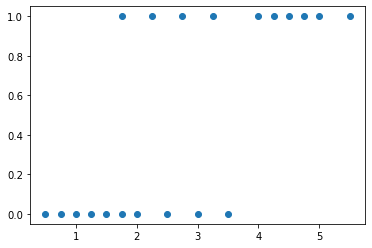

In [477]:
x = logregtest.Hours
y = logregtest.Pass

plt.scatter(x, y)
plt.show()

In [478]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(C=10000, solver='lbfgs', multi_class='ovr')
#Convert a 1D array to a 2D array in numpy
x = x.values.reshape(-1,1)
#Run Logistic Regression
logreg.fit(x, y)

LogisticRegression(C=10000, multi_class='ovr')

In [479]:
x

array([[0.5 ],
       [0.75],
       [1.  ],
       [1.25],
       [1.5 ],
       [1.75],
       [1.75],
       [2.  ],
       [2.25],
       [2.5 ],
       [2.75],
       [3.  ],
       [3.25],
       [3.5 ],
       [4.  ],
       [4.25],
       [4.5 ],
       [4.75],
       [5.  ],
       [5.5 ]])

In [480]:
hours = np.arange(0, 10, 0.5)
probabilities = []
for i in hours:
    p_fail, p_pass = logreg.predict_proba([[i]])[0]
    probabilities.append(p_pass)

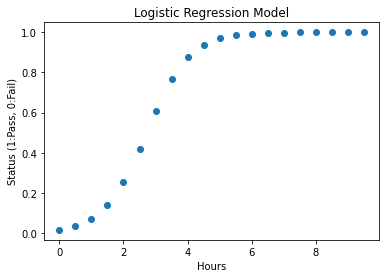

In [481]:
plt.scatter(hours,probabilities)
plt.title("Logistic Regression Model")
plt.xlabel('Hours')
plt.ylabel('Status (1:Pass, 0:Fail)')
plt.show()

In [482]:
logreg.coef_

array([[1.50458575]])

In [483]:
logreg.intercept_

array([-4.07756199])

In [484]:
for i in logreg.coef_:
    for j in i:
        print(j)
        log_co = j

1.5045857465226218


In [485]:
for i in logreg.intercept_:
    print(i)
    log_int = i

-4.077561989266636


In [486]:
from math import exp

In [487]:
print('p(passing for 2 hours studying) = ', "{:.0%}".format(1 / (1 + exp(-1 * (log_co*2 + log_int)))))

p(passing for 2 hours studying) =  26%


In [488]:
print('p(passing for 4 hours studying) = ', "{:.0%}".format(1 / (1 + exp(-1 * (log_co*4 + log_int)))))

p(passing for 4 hours studying) =  87%


# Peaceful and Non-Peaceful Logistic Regression Model

In [489]:
# data = df_2010to2020_peace_NoNeut.drop(['Sum', 'Group Name'], axis=1)
# adata = data.to_numpy()

adata.shape

(10, 768)

In [490]:
data

,able,access,accord,according,account,accuse,achieve,act,action,activity,actor,actually,ad,add,address,administration,advertising,again,age,agency,agree,agreement,agriculture,aim,air,allow,along,among,amp,announce,another,app,appeal,appear,appoint,area,army,around,arrest,art,article,ask,assembly,asset,association,attack,authority,available,award,away,bad,ball,ban,bank,banking,base,bay,become,before,begin,believe,benefit,best,big,bill,billion,bit,black,block,board,body,bond,book,border,both,brand,bring,budget,building,bus,business,but,buy,cabinet,campaign,candidate,capacity,capital,car,card,care,carry,case,cause,cent,center,central,centre,chairman,challenge,championship,chance,change,character,charge,chief,child,church,citizen,city,civil,claim,class,clear,click,close,club,coach,collect,college,come,coming,comment,comments,commercial,commission,commissioner,committee,community,companies,company,compare,competition,complaint,complete,concern,condition,conduct,conference,consider,constitution,construction,consumer,contact,content,continue,contract,control,cookie,cookies,cork,coronavirus,corporate,corruption,cost,could,council,countries,country,county,course,court,cover,covid,create,cricket,crime,crisis,culture,current,currently,curse,customer,cut,data,date,day,deal,death,decide,decision,delete,demand,democracy,department,deputy,design,despite,develop,development,device,die,different,digital,direct,director,district,division,domestic,down,drive,drug,dunedin,earlier,early,economic,economy,education,effect,effort,election,email,employee,enable,encourage,end,energy,enjoy,ensure,environment,equity,ers,especially,establish,event,example,exchange,executive,expect,experience,explain,export,express,face,facility,fact,factory,fail,family,fan,far,farm,farmer,father,feature,federal,feel,field,fight,figure,file,film,final,finance,financial,find,finish,fire,firm,flowing,focus,follow,food,football,force,foreign,form,former,forward,found,free,friend,from,fund,fur,future,game,gas,general,getty,girl,gleaner,global,go,goal,god,going,good,govern,government,governor,great,group,groups,grow,growth,guardian,guy,had,hand,happen,hard,head,health,held,help,high,history,hit,hockey,hold,home,hope,hospital,hotel,house,housing,however,human,idea,identify,image,immediately,impact,implement,implementation,import,important,improve,incident,include,income,increase,independent,indiana,indicate,individual,industry,inform,information,infrastructure,initiative,instead,institution,interest,international,internet,investigation,investment,investor,involve,island,issue,it,job,join,journal,jubilee,judge,justice,key,kid,kill,kind,know,known,labour,lack,land,language,large,late,later,launch,law,lawmaker,lawyer,lead,leader,leadership,league,learn,leave,left,legal,let,level,life,light,like,likely,limited,line,list,little,live,living,loan,local,long,look,lose,lot,love,low,main,mainland,major,man,manage,management,manager,market,marketing,match,matter,may,mean,measure,medical,medium,meet,meeting,member,men,met,military,million,minister,ministry,miss,mobile,model,moment,monday,money,months,mother,movement,movie,music,must,nation,national,natural,nature,near,need,network,new,news,newspaper,night,non,north,note,number,offer,offering,office,officer,official,officials,oil,old,online,only,open,operation,operations,opinion,opportunity,opposition,opt,option,order,organisation,organization,ottawa,outside,owner,page,paid,parent,parish,park,parliament,partner,party,past,patient,pay,payment,peace,pen,people,performance,period,person,personal,phone,photo,picture,place,plan,plant,platform,play,played,player,point,police,policy,political,politician,poor,population,port,position,possible,post,posted,postmedia,power,practice,present,president,presidential,press,price,prime,prince,private,pro,problem,proceed,process,produce,product,production,products,prof,professional,profit,program,programme,project,projects,property,protest,protester,provide,province,public,publish,quality,queen,question,race,

In [491]:
ytrain = data.loc[:,'Group'].values

In [492]:
ytrain

array([1, 0, 1, 1, 1, 0, 0, 1, 1, 0], dtype=int64)

In [493]:
xtrain = data.drop(columns=['Group']).to_numpy()

In [494]:
xtrain

array([[0.00288108, 0.00230297, 0.        , ..., 0.0032372 , 0.        ,
        0.        ],
       [0.00194173, 0.        , 0.00277403, ..., 0.00206763, 0.        ,
        0.        ],
       [0.00260896, 0.00176582, 0.00201234, ..., 0.00314892, 0.        ,
        0.        ],
       ...,
       [0.00283635, 0.00207866, 0.        , ..., 0.00347627, 0.        ,
        0.        ],
       [0.00286593, 0.00250481, 0.00217713, ..., 0.00240376, 0.        ,
        0.        ],
       [0.        , 0.00325241, 0.00207244, ..., 0.00193268, 0.        ,
        0.00311665]])

In [495]:
model = logreg.fit(xtrain, ytrain)

In [496]:
model.intercept_

array([0.34649194])

In [497]:
model.coef_

array([[ 6.93825821e+00,  5.51829724e-01, -7.43512465e-01,
        -9.64308317e+00,  2.08854704e+00, -4.61066409e+00,
        -1.14324989e+00, -4.75717666e+00, -2.12676630e-01,
        -3.42465466e+00,  0.00000000e+00,  1.08827705e+00,
         9.69123140e-01, -3.79980340e+00, -7.74845261e+00,
        -1.95239668e+00,  8.43580508e-01,  0.00000000e+00,
         2.79240379e+00, -2.04400228e+00,  2.00500489e+00,
         0.00000000e+00, -1.30661938e+00,  2.22190064e-01,
         0.00000000e+00,  5.78313770e-01,  0.00000000e+00,
         0.00000000e+00,  8.11227735e+00,  4.93444386e+00,
         0.00000000e+00,  1.91905510e+00, -1.06779211e+00,
         7.37069431e+00,  0.00000000e+00, -6.69012477e+00,
        -1.92005045e+00,  0.00000000e+00, -7.00175128e+00,
         1.08213305e+00,  3.10864249e+00,  8.99609358e-01,
        -1.29475221e+00,  0.00000000e+00,  0.00000000e+00,
        -4.34130821e+00, -7.95837486e+00,  7.01989703e+00,
        -3.07377620e+00,  3.27909528e+00,  5.31788159e+0

In [498]:
df_2010to2020_words.columns[0:-1]

Index(['able', 'access', 'accord', 'according', 'account', 'accuse', 'achieve',
       'act', 'action', 'activity',
       ...
       'working', 'world', 'would', 'write', 'yea', 'year', 'you', 'young',
       'your', 'youth'],
      dtype='object', length=767)

In [499]:
# produce a dataframe to show coefficient for each word
  
# creates Dataframe
df_words_coef = pd.DataFrame({
    'Words' : df_2010to2020_words.columns[0:-1],
    'Coefficient' : model.coef_[0]
})

# sorting in decending order by absolute value of Coefficient
df_words_coef = df_words_coef.reindex(df_words_coef.Coefficient.abs().sort_values(ascending=False).index)

In [500]:
df_words_coef

,Words,Coefficient
289,government,-37.927646
158,country,-37.663672
526,president,-24.867754
660,state,-23.331568
449,new,18.968074
276,game,18.763129
698,time,17.523628
210,election,-17.146213
389,like,16.528292
400,look,16.094553


In [501]:
# Add intercept value at top

new_row = pd.DataFrame({'Words': 'Intercept', 'Coefficient' : model.intercept_}, index = [0])
df_words_coef_sort = pd.concat([new_row, df_words_coef]).reset_index(drop = True)

In [502]:
df_words_coef_sort

,Words,Coefficient
0,Intercept,0.346492
1,government,-37.927646
2,country,-37.663672
3,president,-24.867754
4,state,-23.331568
5,new,18.968074
6,game,18.763129
7,time,17.523628
8,election,-17.146213
9,like,16.528292


In [503]:
# These are all neutral countries that we need to predict

df_2010to2020_peace_AllNeut = df_2010to2020_peace.drop(index=['Australia AU', 'Bangladesh BD', 'Canada CA', 'United Kingdom GB', 'Ireland IE', 'Kenya KE', 'Nigeria NG', 'New Zealand NZ', 'Singapore SG', 'Tanzania TZ'])
df_xtest = df_2010to2020_peace_AllNeut.drop(['Sum', 'Group', 'Group Name'], axis=1)

In [504]:
df_xtest

,able,access,accord,according,account,accuse,achieve,act,action,activity,actor,actually,ad,add,address,administration,advertising,again,age,agency,agree,agreement,agriculture,aim,air,allow,along,among,amp,announce,another,app,appeal,appear,appoint,area,army,around,arrest,art,article,ask,assembly,asset,association,attack,authority,available,award,away,bad,ball,ban,bank,banking,base,bay,become,before,begin,believe,benefit,best,big,bill,billion,bit,black,block,board,body,bond,book,border,both,brand,bring,budget,building,bus,business,but,buy,cabinet,campaign,candidate,capacity,capital,car,card,care,carry,case,cause,cent,center,central,centre,chairman,challenge,championship,chance,change,character,charge,chief,child,church,citizen,city,civil,claim,class,clear,click,close,club,coach,collect,college,come,coming,comment,comments,commercial,commission,commissioner,committee,community,companies,company,compare,competition,complaint,complete,concern,condition,conduct,conference,consider,constitution,construction,consumer,contact,content,continue,contract,control,cookie,cookies,cork,coronavirus,corporate,corruption,cost,could,council,countries,country,county,course,court,cover,covid,create,cricket,crime,crisis,culture,current,currently,curse,customer,cut,data,date,day,deal,death,decide,decision,delete,demand,democracy,department,deputy,design,despite,develop,development,device,die,different,digital,direct,director,district,division,domestic,down,drive,drug,dunedin,earlier,early,economic,economy,education,effect,effort,election,email,employee,enable,encourage,end,energy,enjoy,ensure,environment,equity,ers,especially,establish,event,example,exchange,executive,expect,experience,explain,export,express,face,facility,fact,factory,fail,family,fan,far,farm,farmer,father,feature,federal,feel,field,fight,figure,file,film,final,finance,financial,find,finish,fire,firm,flowing,focus,follow,food,football,force,foreign,form,former,forward,found,free,friend,from,fund,fur,future,game,gas,general,getty,girl,gleaner,global,go,goal,god,going,good,govern,government,governor,great,group,groups,grow,growth,guardian,guy,had,hand,happen,hard,head,health,held,help,high,history,hit,hockey,hold,home,hope,hospital,hotel,house,housing,however,human,idea,identify,image,immediately,impact,implement,implementation,import,important,improve,incident,include,income,increase,independent,indiana,indicate,individual,industry,inform,information,infrastructure,initiative,instead,institution,interest,international,internet,investigation,investment,investor,involve,island,issue,it,job,join,journal,jubilee,judge,justice,key,kid,kill,kind,know,known,labour,lack,land,language,large,late,later,launch,law,lawmaker,lawyer,lead,leader,leadership,league,learn,leave,left,legal,let,level,life,light,like,likely,limited,line,list,little,live,living,loan,local,long,look,lose,lot,love,low,main,mainland,major,man,manage,management,manager,market,marketing,match,matter,may,mean,measure,medical,medium,meet,meeting,member,men,met,military,million,minister,ministry,miss,mobile,model,moment,monday,money,months,mother,movement,movie,music,must,nation,national,natural,nature,near,need,network,new,news,newspaper,night,non,north,note,number,offer,offering,office,officer,official,officials,oil,old,online,only,open,operation,operations,opinion,opportunity,opposition,opt,option,order,organisation,organization,ottawa,outside,owner,page,paid,parent,parish,park,parliament,partner,party,past,patient,pay,payment,peace,pen,people,performance,period,person,personal,phone,photo,picture,place,plan,plant,platform,play,played,player,point,police,policy,political,politician,poor,population,port,position,possible,post,posted,postmedia,power,practice,present,president,presidential,press,price,prime,prince,private,pro,problem,proceed,process,produce,product,production,products,prof,professional,profit,program,programme,project,projects,property,protest,protester,provide,province,public,publish,quality,queen,question,race,

# Method 1: Use Build-in Method to Predict Neutral Countries

In [505]:
df_xtest

,able,access,accord,according,account,accuse,achieve,act,action,activity,actor,actually,ad,add,address,administration,advertising,again,age,agency,agree,agreement,agriculture,aim,air,allow,along,among,amp,announce,another,app,appeal,appear,appoint,area,army,around,arrest,art,article,ask,assembly,asset,association,attack,authority,available,award,away,bad,ball,ban,bank,banking,base,bay,become,before,begin,believe,benefit,best,big,bill,billion,bit,black,block,board,body,bond,book,border,both,brand,bring,budget,building,bus,business,but,buy,cabinet,campaign,candidate,capacity,capital,car,card,care,carry,case,cause,cent,center,central,centre,chairman,challenge,championship,chance,change,character,charge,chief,child,church,citizen,city,civil,claim,class,clear,click,close,club,coach,collect,college,come,coming,comment,comments,commercial,commission,commissioner,committee,community,companies,company,compare,competition,complaint,complete,concern,condition,conduct,conference,consider,constitution,construction,consumer,contact,content,continue,contract,control,cookie,cookies,cork,coronavirus,corporate,corruption,cost,could,council,countries,country,county,course,court,cover,covid,create,cricket,crime,crisis,culture,current,currently,curse,customer,cut,data,date,day,deal,death,decide,decision,delete,demand,democracy,department,deputy,design,despite,develop,development,device,die,different,digital,direct,director,district,division,domestic,down,drive,drug,dunedin,earlier,early,economic,economy,education,effect,effort,election,email,employee,enable,encourage,end,energy,enjoy,ensure,environment,equity,ers,especially,establish,event,example,exchange,executive,expect,experience,explain,export,express,face,facility,fact,factory,fail,family,fan,far,farm,farmer,father,feature,federal,feel,field,fight,figure,file,film,final,finance,financial,find,finish,fire,firm,flowing,focus,follow,food,football,force,foreign,form,former,forward,found,free,friend,from,fund,fur,future,game,gas,general,getty,girl,gleaner,global,go,goal,god,going,good,govern,government,governor,great,group,groups,grow,growth,guardian,guy,had,hand,happen,hard,head,health,held,help,high,history,hit,hockey,hold,home,hope,hospital,hotel,house,housing,however,human,idea,identify,image,immediately,impact,implement,implementation,import,important,improve,incident,include,income,increase,independent,indiana,indicate,individual,industry,inform,information,infrastructure,initiative,instead,institution,interest,international,internet,investigation,investment,investor,involve,island,issue,it,job,join,journal,jubilee,judge,justice,key,kid,kill,kind,know,known,labour,lack,land,language,large,late,later,launch,law,lawmaker,lawyer,lead,leader,leadership,league,learn,leave,left,legal,let,level,life,light,like,likely,limited,line,list,little,live,living,loan,local,long,look,lose,lot,love,low,main,mainland,major,man,manage,management,manager,market,marketing,match,matter,may,mean,measure,medical,medium,meet,meeting,member,men,met,military,million,minister,ministry,miss,mobile,model,moment,monday,money,months,mother,movement,movie,music,must,nation,national,natural,nature,near,need,network,new,news,newspaper,night,non,north,note,number,offer,offering,office,officer,official,officials,oil,old,online,only,open,operation,operations,opinion,opportunity,opposition,opt,option,order,organisation,organization,ottawa,outside,owner,page,paid,parent,parish,park,parliament,partner,party,past,patient,pay,payment,peace,pen,people,performance,period,person,personal,phone,photo,picture,place,plan,plant,platform,play,played,player,point,police,policy,political,politician,poor,population,port,position,possible,post,posted,postmedia,power,practice,present,president,presidential,press,price,prime,prince,private,pro,problem,proceed,process,produce,product,production,products,prof,professional,profit,program,programme,project,projects,property,protest,protester,provide,province,public,publish,quality,queen,question,race,

In [506]:
xtest = df_xtest.to_numpy()

In [507]:
prob_pred = model.predict_proba(xtest)

In [508]:
prob_pred

array([[0.86392287, 0.13607713],
       [0.42011927, 0.57988073],
       [0.43546457, 0.56453543],
       [0.56292412, 0.43707588],
       [0.87307127, 0.12692873],
       [0.505826  , 0.494174  ],
       [0.46215523, 0.53784477],
       [0.05988889, 0.94011111]])

In [509]:
print('Predictions (probablility to be a peaceful country):')
print('Ghana GH: ', "{:.0%}".format(prob_pred[0][1]))
print('Hong Kong HK: ', "{:.0%}".format(prob_pred[1][1]))
print('India IN: ', "{:.0%}".format(prob_pred[2][1]))
print('Jamaica JM: ', "{:.0%}".format(prob_pred[3][1]))
print('Sri Lanka LK: ', "{:.0%}".format(prob_pred[4][1]))
print('Malaysia MY: ', "{:.0%}".format(prob_pred[5][1]))
print('Philippines PH: ', "{:.0%}".format(prob_pred[6][1]))
print('United States US: ', "{:.0%}".format(prob_pred[7][1]))

Predictions (probablility to be a peaceful country):
Ghana GH:  14%
Hong Kong HK:  58%
India IN:  56%
Jamaica JM:  44%
Sri Lanka LK:  13%
Malaysia MY:  49%
Philippines PH:  54%
United States US:  94%


# Method 2: Use Formula to Predict Neutral Countries

In [510]:
GH = df_xtest.to_numpy()[0]
HK = df_xtest.to_numpy()[1]
IN = df_xtest.to_numpy()[2]
JM = df_xtest.to_numpy()[3]
LK = df_xtest.to_numpy()[4]
MY = df_xtest.to_numpy()[5]
PH = df_xtest.to_numpy()[6]
US = df_xtest.to_numpy()[7]

In [511]:
# Make a function
# input: numpy array of word percentage of a neutral country
# output: Predictions (probablility to be a peaceful country)

def possibility_peace(country):
    product = model.coef_[0] * country
    total = 0
    for i in product:
        total = total + i
        p = 1 / (1 + exp(-1 * (total + model.intercept_)))
    return p

In [512]:
pi_data = {}

In [513]:
print('Predictions (probablility to be a peaceful country):')
print('Ghana GH: ', "{:.0%}".format(possibility_peace(GH)))
print('Hong Kong HK: ', "{:.0%}".format(possibility_peace(HK)))
print('India IN: ', "{:.0%}".format(possibility_peace(IN)))
print('Jamaica JM: ', "{:.0%}".format(possibility_peace(JM)))
print('Sri Lanka LK: ', "{:.0%}".format(possibility_peace(LK)))
print('Malaysia MY: ', "{:.0%}".format(possibility_peace(MY)))
print('Philippines PH: ', "{:.0%}".format(possibility_peace(PH)))
print('United States US: ', "{:.0%}".format(possibility_peace(US)))

pi_data = {
'Ghana GH: ' : int(round(possibility_peace(GH) * 100)),
'Hong Kong HK: ' : int(round(possibility_peace(HK) * 100)),
'India IN: ': int(round(possibility_peace(IN) * 100)),
'Jamaica JM: ' : int(round(possibility_peace(JM) * 100)),
'Sri Lanka LK: ' : int(round(possibility_peace(LK) * 100)),
'Malaysia MY: '  : int(round(possibility_peace(MY) * 100)),
'Philippines PH: ' : int(round(possibility_peace(PH) * 100)),
'United States US: ' : int(round(possibility_peace(US) *100))
}

Predictions (probablility to be a peaceful country):
Ghana GH:  14%
Hong Kong HK:  58%
India IN:  56%
Jamaica JM:  44%
Sri Lanka LK:  13%
Malaysia MY:  49%
Philippines PH:  54%
United States US:  94%


In [514]:
pi_data

{'Ghana GH: ': 14,
 'Hong Kong HK: ': 58,
 'India IN: ': 56,
 'Jamaica JM: ': 44,
 'Sri Lanka LK: ': 13,
 'Malaysia MY: ': 49,
 'Philippines PH: ': 54,
 'United States US: ': 94}

# Use Formula to Predict Peaceful And Non-peaceful Countries

In [515]:
AU = xtrain[0]
BD = xtrain[1]
CA = xtrain[2]
GB = xtrain[3]
IE = xtrain[4]
KE = xtrain[5]
NG = xtrain[6]
NZ = xtrain[7]
SG = xtrain[8]
TZ = xtrain[9]

In [516]:
print('Predictions (probablility to be a peaceful country) After removing stopwords and named entities:')
print('Australia AU (1): ', "{:.0%}".format(possibility_peace(AU)))
print('Bangladesh BD (0): ', "{:.0%}".format(possibility_peace(BD)))
print('Canada CA (1): ', "{:.0%}".format(possibility_peace(CA)))
print('United Kingdom GB (1): ', "{:.0%}".format(possibility_peace(GB)))
print('Ireland IE (1): ', "{:.0%}".format(possibility_peace(IE)))
print('Kenya KE (0): ', "{:.0%}".format(possibility_peace(KE)))
print('Nigeria NG (0): ', "{:.0%}".format(possibility_peace(NG)))
print('New Zealand NZ (1): ', "{:.0%}".format(possibility_peace(NZ)))
print('Singapore SG (1): ', "{:.0%}".format(possibility_peace(SG)))
print('Tanzania TZ (0): ', "{:.0%}".format(possibility_peace(TZ)))

pi_data['Australia AU'] = int(round(possibility_peace(AU) * 100))
pi_data['Bangladesh BD'] = int(round(possibility_peace(BD) * 100))
pi_data['Canada CA'] = int(round(possibility_peace(CA) * 100))
pi_data['United Kingdom GB'] = int(round(possibility_peace(GB) * 100))
pi_data['Ireland IE'] = int(round(possibility_peace(IE) * 100))
pi_data['Kenya KE'] = int(round(possibility_peace(KE) * 100))
pi_data['Nigeria NG'] = int(round(possibility_peace(NG) * 100))
pi_data['New Zealand NZ'] = int(round(possibility_peace(NZ) * 100))
pi_data['Singapore SG'] = int(round(possibility_peace(SG) * 100))
pi_data['Tanzania TZ'] = int(round(possibility_peace(TZ) * 100))

Predictions (probablility to be a peaceful country) After removing stopwords and named entities:
Australia AU (1):  96%
Bangladesh BD (0):  10%
Canada CA (1):  94%
United Kingdom GB (1):  94%
Ireland IE (1):  96%
Kenya KE (0):  14%
Nigeria NG (0):  6%
New Zealand NZ (1):  93%
Singapore SG (1):  90%
Tanzania TZ (0):  6%


In [517]:
pi_data

{'Ghana GH: ': 14,
 'Hong Kong HK: ': 58,
 'India IN: ': 56,
 'Jamaica JM: ': 44,
 'Sri Lanka LK: ': 13,
 'Malaysia MY: ': 49,
 'Philippines PH: ': 54,
 'United States US: ': 94,
 'Australia AU': 96,
 'Bangladesh BD': 10,
 'Canada CA': 94,
 'United Kingdom GB': 94,
 'Ireland IE': 96,
 'Kenya KE': 14,
 'Nigeria NG': 6,
 'New Zealand NZ': 93,
 'Singapore SG': 90,
 'Tanzania TZ': 6}

In [518]:
pi_data_df = pd.DataFrame({'Country': list(pi_data.keys()), 'Peace Index': list(pi_data.values())})
pi_data_df = pi_data_df.sort_values(by = 'Peace Index', ascending = True).reset_index(drop=True)

In [521]:
pi_data_df.to_excel('peace_index_nostop_words.xlsx', engine='openpyxl', index=False) 

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
from wordcloud import WordCloud

wc = WordCloud(background_color="white",width=1000,height=1000, max_words=100,relative_scaling=0.5,normalize_plurals=False).\
generate_from_frequencies(notpeace_wrd_dict)
plt.imshow(wc)
plt.savefig('wordcloud_notpeace_update.png')

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
from wordcloud import WordCloud

wc = WordCloud(background_color="white",width=1000,height=1000, max_words=100,relative_scaling=0.5,normalize_plurals=False).\
generate_from_frequencies(peace_wrd_dict)
plt.imshow(wc)
plt.savefig('wordcloud_peace_update.png')